In [ ]:
import os
import json

os.environ["RAY_DISABLE_WINDOWS_JOB_OBJECT"] = "1"
os.environ["RAY_DEDUP_LOGS"] = "0"    

import torch
import torch.nn as nn
import pandas as pd
import numpy as np

from torch.utils.data import DataLoader

import matplotlib.pyplot as plt

from model import TCNRegressor
from tuning_try import ray_train
from ray import tune
from ray.tune import RunConfig
from ray.tune import Tuner
from ray.tune.schedulers import ASHAScheduler
from ray.tune.search.optuna import OptunaSearch
from ray.tune import CLIReporter


import utils
from utils import plot_residual_diagnostics

if torch.xpu.is_available():
    device = torch.device("xpu")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

import sarima as sm 

from utils import 

C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2026-03-04 20:48:52,292	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2026-03-04 20:48:55,879	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


In [2]:
import os, ctypes, sys

os.environ["RAY_DISABLE_WINDOWS_JOB_OBJECT"] = "1"  # belt

# Patch AssignProcessToJobObject at the WinAPI level before Ray imports it.
# This avoids the OSError regardless of whether Ray reads the env var in time.
if sys.platform == "win32":
    _kernel32 = ctypes.WinDLL("kernel32", use_last_error=True)
    _real_apjo = _kernel32.AssignProcessToJobObject

    def _safe_apjo(hJob, hProcess):
        result = _real_apjo(hJob, hProcess)
        if not result:
            ctypes.set_last_error(0)   # clear error, pretend success
            return 1
        return result

    _kernel32.AssignProcessToJobObject = _safe_apjo

In [3]:
import torch

print(f"PyTorch version: {torch.__version__}")

has_xpu_attr = hasattr(torch, "xpu")
xpu_compiled = hasattr(torch._C, "_xpu_getDeviceCount")
xpu_available = has_xpu_attr and torch.xpu.is_available()

print(f"XPU compiled: {xpu_compiled}")
print(f"XPU available: {xpu_available}")

if xpu_available:
    print(f"Device count: {torch.xpu.device_count()}")
    print(f"Device name: {torch.xpu.get_device_name(0)}")
    test_device = "xpu"
else:
    print("Device count: 0")
    print("Device name: N/A")
    test_device = "cuda" if torch.cuda.is_available() else "cpu"

# Test tensor creation
x = torch.randn(3, 3, device=test_device)
print(f"Test tensor: {x.size()} {x.device}")

PyTorch version: 2.7.1+xpu
XPU compiled: True
XPU available: True
Device count: 1
Device name: Intel(R) Arc(TM) Graphics
Test tensor: torch.Size([3, 3]) xpu:0


In [4]:
# ...existing code...
from statsmodels.stats.outliers_influence import variance_inflation_factor

def _as_df(X):
    if isinstance(X, pd.DataFrame):
        return X.copy()
    X = np.asarray(X)
    return pd.DataFrame(X, columns=[f"f{i}" for i in range(X.shape[1])])

def fit_corr_vif_selector(X_train, corr_threshold=0.95, vif_threshold=10.0, verbose=True):
    X = _as_df(X_train).select_dtypes(include=[np.number]).copy()

    # Drop constant columns
    const_cols = [c for c in X.columns if X[c].nunique(dropna=False) <= 1]
    if const_cols:
        X = X.drop(columns=const_cols)

    # Correlation filter
    corr = X.corr().abs()
    upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
    corr_drop = [c for c in upper.columns if (upper[c] > corr_threshold).any()]
    X_after_corr = X.drop(columns=corr_drop, errors="ignore")

    # VIF filter (iterative)
    X_vif = X_after_corr.replace([np.inf, -np.inf], np.nan).dropna().copy()
    vif_drop = []
    if X_vif.shape[1] >= 2:
        while True:
            vifs = pd.Series(
                [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])],
                index=X_vif.columns
            )
            max_vif = float(vifs.max())
            if max_vif <= vif_threshold or X_vif.shape[1] <= 1:
                break
            drop_col = str(vifs.idxmax())
            vif_drop.append(drop_col)
            X_vif = X_vif.drop(columns=[drop_col])

    selected_cols = [c for c in X_after_corr.columns if c not in vif_drop]

    selector = {
        "selected_cols": selected_cols,
        "dropped_constant": const_cols,
        "dropped_corr": corr_drop,
        "dropped_vif": vif_drop
    }

    if verbose:
        print(f"[FS] start={len(const_cols) + len(X.columns)} cols | "
              f"const_drop={len(const_cols)} | corr_drop={len(corr_drop)} | "
              f"vif_drop={len(vif_drop)} | final={len(selected_cols)}")

    return selector

def apply_feature_selector(X, selector):
    Xdf = _as_df(X)
    cols = [c for c in selector["selected_cols"] if c in Xdf.columns]
    return Xdf[cols].to_numpy(), cols
# ...existing code...

In [5]:
# Feature-selection toggle (set enabled=False to skip)
FEATURE_SELECTION_CONFIG = {
    "enabled": True,
    "corr_threshold": 0.95,
    "vif_threshold": 10.0,
    "save_selector": True,
}

def maybe_apply_feature_selection(train_data, val_data, test_data, exp_name, fs_config=FEATURE_SELECTION_CONFIG):
    if not fs_config.get("enabled", False):
        return train_data, val_data, test_data, None

    selector = fit_corr_vif_selector(
        train_data,
        corr_threshold=fs_config.get("corr_threshold", 0.95),
        vif_threshold=fs_config.get("vif_threshold", 10.0),
        verbose=True,
    )

    train_fs, selected_cols = apply_feature_selector(train_data, selector)
    val_fs, _ = apply_feature_selector(val_data, selector)
    test_fs, _ = apply_feature_selector(test_data, selector)

    selector["selected_count"] = len(selected_cols)

    if fs_config.get("save_selector", True):
        os.makedirs(f"configs_featcorr/{exp_name}", exist_ok=True)
        with open(f"configs_featcorr/{exp_name}/feature_selector.json", "w") as f:
            json.dump(selector, f, indent=4)

    print(f"[FS] {exp_name}: selected {len(selected_cols)} features")
    return train_fs, val_fs, test_fs, selector

In [6]:
# Windows-only Ray safeguard for AssignProcessToJobObject errors
import os

os.environ["RAY_DISABLE_WINDOWS_JOB_OBJECT"] = "1"
os.environ["RAY_DEDUP_LOGS"] = "0"

if os.name == "nt":
    import ray._private.utils as ray_private_utils

    if not getattr(ray_private_utils, "_safe_job_object_patch_applied", False):
        _original_set_kill = ray_private_utils.set_kill_child_on_death_win32

        def _safe_set_kill_child_on_death_win32(child_proc):
            try:
                _original_set_kill(child_proc)
            except OSError as exc:
                msg = str(exc)
                if getattr(exc, "winerror", None) in (0, 5, 87, 203) or "AssignProcessToJobObject" in msg:
                    return
                raise

        ray_private_utils.set_kill_child_on_death_win32 = _safe_set_kill_child_on_death_win32
        ray_private_utils._safe_job_object_patch_applied = True

print("Ray Windows patch active.")

Ray Windows patch active.


In [ ]:
import time
import ray

TRAIN_LOSS = "mse"
trials     = 50

reporter = CLIReporter(
    metric="loss", mode="min",
    metric_columns=["loss", "std"],
    max_progress_rows=15,
    print_intermediate_tables=True,
    max_report_frequency=30,
    sort_by_metric=True
)

def trial_dirname_creator(trial):
    return f"trial_{trial.trial_id}"

def ensure_ray_resources(min_cpu=1, require_gpu=False, wait_s=15):
    expected_gpu = 1.0 if require_gpu else 0.0

    if not ray.is_initialized():
        ray.init(
            ignore_reinit_error=True,
            include_dashboard=False,
            num_cpus=max(1, (os.cpu_count() or 2) - 1),
            num_gpus=1 if torch.cuda.is_available() else 0,
            log_to_driver=True,
        )

    steps = max(1, int(wait_s / 0.5))
    last = {}
    for _ in range(steps):
        last = ray.cluster_resources()
        cpu_ok = float(last.get("CPU", 0.0)) >= float(min_cpu)
        gpu_ok = float(last.get("GPU", 0.0)) >= expected_gpu
        if cpu_ok and gpu_ok:
            return last
        time.sleep(0.5)

    raise RuntimeError(
        f"Ray resources unavailable after {wait_s}s. "
        f"Detected={last}, required CPU>={min_cpu}, GPU>={expected_gpu}"
    )

# ── Label & Feature Config ─────────────────────────────────────────────────────
LABEL_COLS = ['Tax Revenues',"BIR", "BOC", "Other Offices", 'Non-tax Revenues', 'Expenditures']

FEATURE_CONFIG = {
    "features":     ['Tax Revenues',"BIR", "BOC", "Other Offices", "Non-tax Revenues", "Expenditures",
                     "TotalTrade_PHPMN", "NominalGDP_disagg", "Pop_disagg", "USDPHP"],
    "dummy_vars":   ["COVID-19", "TRAIN", "CREATE", "FIST", "BIR_COMM"],
    "use_seasonal": True,
    "lag_periods":  [1, 3, 6, 12],
    "use_lags":     True,
}

BASE_SEARCH_SPACE = {
    "num_channels":  tune.choice([[64], [64, 64], [64, 64, 64], [128], [128, 128], [128, 128, 128], [256], [256, 256], [256, 256, 256]]),
    "kernel_size":   tune.choice([2, 3, 4, 5]),
    "dropout":       tune.uniform(0.1, 0.4),
    "lr":            tune.loguniform(5e-4, 5e-2),
    "wd":            tune.loguniform(1e-6, 1e-4),
    "factor":        tune.uniform(0.2, 0.5),
    "patience":      tune.choice([5, 10]),
    "batch_size":    tune.choice([16, 32, 64]),
    "seq_len":       tune.choice([12, 18, 24]),
    "l1_lambda":     tune.loguniform(1e-5, 1e-2),
    "lag_periods":   [1, 3, 6, 12]
}

START_DATES = ["1992-01-01", "2000-01-01", "2007-01-01"]

ray_cluster = ensure_ray_resources(min_cpu=1, require_gpu=torch.cuda.is_available(), wait_s=20)
available_cpu = max(1, int(ray_cluster.get("CPU", 1)))
available_gpu = float(ray_cluster.get("GPU", 0.0))

print(f"Ray cluster resources: {ray_cluster}")

# ── Main Loop — 
all_results = {}

for start_date in START_DATES:
    all_results[start_date] = {}
    
    for label in LABEL_COLS:
        label_slug = label.replace(' ', '_')
        exp_name   = f"{label_slug}_{start_date[:4]}"

        print(f"\n{'='*60}")
        print(f"  TUNING: {label} | Start: {start_date}")
        print(f"{'='*60}")

        search_space = {
            **BASE_SEARCH_SPACE,
            **FEATURE_CONFIG,
            "labels":            [label],
            "experiment_name":   exp_name,
            "start_date":        start_date,
            "use_feature_selection": FEATURE_SELECTION_CONFIG["enabled"],
            "fs_corr_threshold": FEATURE_SELECTION_CONFIG["corr_threshold"],
            "fs_vif_threshold":  FEATURE_SELECTION_CONFIG["vif_threshold"],
        }

        scheduler  = ASHAScheduler(metric="loss", mode="min", max_t=50, grace_period=10, reduction_factor=2)
        search_alg = OptunaSearch(metric="loss", mode="min")

        per_trial_cpu = min(4, available_cpu)
        resources = {"cpu": per_trial_cpu}
        if torch.cuda.is_available() and available_gpu >= 1.0:
            resources["gpu"] = 0.25

        max_parallel_by_cpu = max(1, available_cpu // per_trial_cpu)
        max_parallel_by_gpu = int(available_gpu / 0.25) if resources.get("gpu", 0) > 0 else max_parallel_by_cpu
        max_parallel = max(1, min(4, max_parallel_by_cpu, max_parallel_by_gpu))

        tuner = Tuner(
            tune.with_resources(ray_train, resources=resources),
            tune_config=tune.TuneConfig(
                search_alg=search_alg,
                scheduler=scheduler,
                num_samples=trials,
                trial_dirname_creator=trial_dirname_creator,
                max_concurrent_trials=max_parallel,
            ),
            run_config=RunConfig(
                name=f"tcn_{exp_name}",
                storage_path=os.path.abspath("ray_results_featcorr"),
                verbose=1,
                progress_reporter=reporter,
            ),
            param_space=search_space,
        )


        results      = tuner.fit()
        best_result  = results.get_best_result(metric="loss", mode="min")
        best_config  = best_result.config
        best_metrics = best_result.metrics

        # Save config
        exp_folder = f"configs_featcorr/{exp_name}"
        os.makedirs(exp_folder, exist_ok=True)

        with open(f"{exp_folder}/best_config.json", "w") as f:
            json.dump(best_config, f, indent=4)

        with open(f"{exp_folder}/metadata.json", "w") as f:
            json.dump({
                "label":      label,
                "start_date": start_date,
                "best_loss":  best_metrics["loss"],
                "best_std":   best_metrics.get("std", None),
                "num_trials": len(results),
                "timestamp":  pd.Timestamp.now().isoformat(),
            }, f, indent=4)

        all_results[start_date][label] = {
            "best_loss": best_metrics["loss"],
            "best_std":  best_metrics.get("std", None),
        }

        print(f"\n✓ {label} ({start_date[:4]}) — Best CV MAPE: {best_metrics['loss']:.4f}%")

# ── Summary ───────────────────────────────────────────────
print(f"\n{'='*60}\nTUNING SUMMARY\n{'='*60}")
rows = [
    {
        "Start": sd[:4],
        "Label": label,
        "Best MAPE": f"{info['best_loss']:.4f}",
        "Std": f"{info['best_std']:.4f}" if info["best_std"] else "—"
    }
    for sd, labels in all_results.items()
    for label, info in labels.items()
]
print(pd.DataFrame(rows).to_string(index=False))

2026-03-04 20:49:45,334	INFO worker.py:1841 -- Started a local Ray instance.
2026-03-04 20:49:48,782	INFO tune.py:616 -- [output] This uses the legacy output and progress reporter, as Jupyter notebooks are not supported by the new engine, yet. For more information, please see https://github.com/ray-project/ray/issues/36949
[I 2026-03-04 20:49:48,793] A new study created in memory with name: optuna


Ray cluster resources: {'memory': 1172695451.0, 'CPU': 21.0, 'object_store_memory': 586347724.0, 'node:127.0.0.1': 1.0, 'node:__internal_head__': 1.0}

  TUNING: Tax Revenues | Start: 1992-01-01
== Status ==
Current time: 2026-03-04 20:49:49 (running for 00:00:00.67)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 0/21 CPUs, 0/0 GPUs
Result logdir: C:/Users/Jojie/AppData/Local/Temp/ray/session_2026-03-04_20-49-36_458247_29944/artifacts/2026-03-04_20-49-48/tcn_Tax_Revenues_1992/driver_artifacts
Number of trials: 1/50 (1 PENDING)
+--------------------+----------+-------+--------------+-----------+----------+---------------+-------------+-----------+----------------+------------+-----------+-------------+
| Trial name         | status   | loc   |   batch_size |   dropout |   factor |   kernel_size |   l1_lambda |        lr | num_channels   |   patience |   seq_len |          wd |
|--------------------+---------

(ray_train pid=944) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=944)   WeightNorm.apply(module, name, dim)
(ray_train pid=46412) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46412)   WeightNorm.apply(module, name, dim)
(ray_train pid=25484) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in f

== Status ==
Current time: 2026-03-04 20:50:19 (running for 00:00:30.70)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Result logdir: C:/Users/Jojie/AppData/Local/Temp/ray/session_2026-03-04_20-49-36_458247_29944/artifacts/2026-03-04_20-49-48/tcn_Tax_Revenues_1992/driver_artifacts
Number of trials: 4/50 (1 PENDING, 3 RUNNING)
+--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+-----------+-------------+
| Trial name         | status   | loc             |   batch_size |   dropout |   factor |   kernel_size |   l1_lambda |         lr | num_channels   |   patience |   seq_len |          wd |
|--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+-----------+-------------|
|

(ray_train pid=46412) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46412)   WeightNorm.apply(module, name, dim)
(ray_train pid=25484) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25484)   WeightNorm.apply(module, name, dim)
(ray_train pid=41376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 20:50:49 (running for 00:01:00.74)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Result logdir: C:/Users/Jojie/AppData/Local/Temp/ray/session_2026-03-04_20-49-36_458247_29944/artifacts/2026-03-04_20-49-48/tcn_Tax_Revenues_1992/driver_artifacts
Number of trials: 4/50 (4 RUNNING)
+--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+-----------+-------------+
| Trial name         | status   | loc             |   batch_size |   dropout |   factor |   kernel_size |   l1_lambda |         lr | num_channels   |   patience |   seq_len |          wd |
|--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+-----------+-------------|
| ray_train_

(ray_train pid=46412) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46412)   WeightNorm.apply(module, name, dim)
(ray_train pid=25484) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25484)   WeightNorm.apply(module, name, dim)
(ray_train pid=41376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 20:51:19 (running for 00:01:30.77)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Result logdir: C:/Users/Jojie/AppData/Local/Temp/ray/session_2026-03-04_20-49-36_458247_29944/artifacts/2026-03-04_20-49-48/tcn_Tax_Revenues_1992/driver_artifacts
Number of trials: 4/50 (4 RUNNING)
+--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+-----------+-------------+
| Trial name         | status   | loc             |   batch_size |   dropout |   factor |   kernel_size |   l1_lambda |         lr | num_channels   |   patience |   seq_len |          wd |
|--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+-----------+-------------|
| ray_train_

(ray_train pid=944) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=944)   WeightNorm.apply(module, name, dim)
(ray_train pid=46412) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46412)   WeightNorm.apply(module, name, dim)
(ray_train pid=41376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in f

== Status ==
Current time: 2026-03-04 20:51:50 (running for 00:02:00.86)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 8f2900fd with loss=15.725287818908692 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.32953630441510917, 'lr': 0.004680410393693178, 'wd': 6.225960261700034e-05, 'factor': 0.40394031975245015, 'patience': 5, 'batch_size': 64, 'seq_len': 24, 'l1_lambda': 0.00013680709789317162, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, '

(ray_train pid=30028) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=30028)   WeightNorm.apply(module, name, dim)
(ray_train pid=30028) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=30028)   WeightNorm.apply(module, name, dim)
(ray_train pid=30028) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 20:52:20 (running for 00:02:30.93)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 8f2900fd with loss=15.725287818908692 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.32953630441510917, 'lr': 0.004680410393693178, 'wd': 6.225960261700034e-05, 'factor': 0.40394031975245015, 'patience': 5, 'batch_size': 64, 'seq_len': 24, 'l1_lambda': 0.00013680709789317162, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, '

(ray_train pid=34676) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34676)   WeightNorm.apply(module, name, dim)
(ray_train pid=30028) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=30028)   WeightNorm.apply(module, name, dim)
(ray_train pid=34676) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 20:52:50 (running for 00:03:01.03)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 8f2900fd with loss=15.725287818908692 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.32953630441510917, 'lr': 0.004680410393693178, 'wd': 6.225960261700034e-05, 'factor': 0.40394031975245015, 'patience': 5, 'batch_size': 64, 'seq_len': 24, 'l1_lambda': 0.00013680709789317162, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, '

(ray_train pid=44696) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=44696)   WeightNorm.apply(module, name, dim)
(ray_train pid=34676) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34676)   WeightNorm.apply(module, name, dim)
(ray_train pid=44696) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 20:53:20 (running for 00:03:31.12)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 8f2900fd with loss=15.725287818908692 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.32953630441510917, 'lr': 0.004680410393693178, 'wd': 6.225960261700034e-05, 'factor': 0.40394031975245015, 'patience': 5, 'batch_size': 64, 'seq_len': 24, 'l1_lambda': 0.00013680709789317162, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, '

(ray_train pid=44696) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=44696)   WeightNorm.apply(module, name, dim)
(ray_train pid=52220) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52220)   WeightNorm.apply(module, name, dim)
(ray_train pid=52220) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 20:53:50 (running for 00:04:01.14)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 8f2900fd with loss=15.725287818908692 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.32953630441510917, 'lr': 0.004680410393693178, 'wd': 6.225960261700034e-05, 'factor': 0.40394031975245015, 'patience': 5, 'batch_size': 64, 'seq_len': 24, 'l1_lambda': 0.00013680709789317162, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, '

(ray_train pid=52220) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52220)   WeightNorm.apply(module, name, dim)
(ray_train pid=22852) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22852)   WeightNorm.apply(module, name, dim)
(ray_train pid=944) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 20:54:20 (running for 00:04:31.22)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 8f2900fd with loss=15.725287818908692 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.32953630441510917, 'lr': 0.004680410393693178, 'wd': 6.225960261700034e-05, 'factor': 0.40394031975245015, 'patience': 5, 'batch_size': 64, 'seq_len': 24, 'l1_lambda': 0.00013680709789317162, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, '

(ray_train pid=22852) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22852)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 20:54:50 (running for 00:05:01.24)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 7a528e24 with loss=14.06517219543457 and parameters={'num_channels': [64], 'kernel_size': 4, 'dropout': 0.13793477811145455, 'lr': 0.00814622133831591, 'wd': 3.3134919621788285e-05, 'factor': 0.4990213401254221, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 0.00012099741679731583, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif

(ray_train pid=26224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=26224)   WeightNorm.apply(module, name, dim)
(ray_train pid=11888) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11888)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 20:55:20 (running for 00:05:31.27)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 7a528e24 with loss=14.06517219543457 and parameters={'num_channels': [64], 'kernel_size': 4, 'dropout': 0.13793477811145455, 'lr': 0.00814622133831591, 'wd': 3.3134919621788285e-05, 'factor': 0.4990213401254221, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 0.00012099741679731583, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif

(ray_train pid=11888) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11888)   WeightNorm.apply(module, name, dim)
(ray_train pid=22852) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22852)   WeightNorm.apply(module, name, dim)
(ray_train pid=26224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 20:55:50 (running for 00:06:01.33)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 7a528e24 with loss=14.06517219543457 and parameters={'num_channels': [64], 'kernel_size': 4, 'dropout': 0.13793477811145455, 'lr': 0.00814622133831591, 'wd': 3.3134919621788285e-05, 'factor': 0.4990213401254221, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 0.00012099741679731583, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif

(ray_train pid=11888) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11888)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 20:56:20 (running for 00:06:31.43)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 12.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=9744) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9744)   WeightNorm.apply(module, name, dim)
(ray_train pid=9744) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9744)   WeightNorm.apply(module, name, dim)
(ray_train pid=11888) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in f

== Status ==
Current time: 2026-03-04 20:56:50 (running for 00:07:01.51)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=9744) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9744)   WeightNorm.apply(module, name, dim)
(ray_train pid=50300) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=50300)   WeightNorm.apply(module, name, dim)
(ray_train pid=9744) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in 

== Status ==
Current time: 2026-03-04 20:57:20 (running for 00:07:31.59)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=5236) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=5236)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 20:57:50 (running for 00:08:01.67)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=5012) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=5012)   WeightNorm.apply(module, name, dim)
(ray_train pid=26224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=26224)   WeightNorm.apply(module, name, dim)
(ray_train pid=50300) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 20:58:20 (running for 00:08:31.71)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=5012) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=5012)   WeightNorm.apply(module, name, dim)
(ray_train pid=5236) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=5236)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 20:58:50 (running for 00:09:01.77)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=5012) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=5012)   WeightNorm.apply(module, name, dim)
(ray_train pid=50300) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=50300)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 20:59:20 (running for 00:09:31.78)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=5236) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=5236)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 20:59:51 (running for 00:10:01.80)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=26224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=26224)   WeightNorm.apply(module, name, dim)
(ray_train pid=5012) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=5012)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:00:51 (running for 00:11:01.90)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=5236) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=5236)   WeightNorm.apply(module, name, dim)
(ray_train pid=9120) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9120)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:01:21 (running for 00:11:31.96)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=9120) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9120)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:01:51 (running for 00:12:02.03)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=9120) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9120)   WeightNorm.apply(module, name, dim)
(ray_train pid=5012) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=5012)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:02:21 (running for 00:12:32.13)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=9120) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9120)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:02:51 (running for 00:13:02.17)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=40780) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=40780)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:03:21 (running for 00:13:32.24)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=9120) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9120)   WeightNorm.apply(module, name, dim)
(ray_train pid=45860) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=45860)   WeightNorm.apply(module, name, dim)
(ray_train pid=40780) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 21:03:51 (running for 00:14:02.30)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=45860) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=45860)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:04:21 (running for 00:14:32.31)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a6d2c8d2 with loss=12.559088134765625 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.23688755995415509, 'lr': 0.003569304244969115, 'wd': 3.65597356208898e-05, 'factor': 0.21852147891828327, 'patience': 5, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00011971159610105745, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=45860) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=45860)   WeightNorm.apply(module, name, dim)
(ray_train pid=13308) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13308)   WeightNorm.apply(module, name, dim)
(ray_train pid=40780) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 21:04:51 (running for 00:15:02.42)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=11320) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11320)   WeightNorm.apply(module, name, dim)
(ray_train pid=13308) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13308)   WeightNorm.apply(module, name, dim)
(ray_train pid=45860) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 21:05:21 (running for 00:15:32.42)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=11320) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11320)   WeightNorm.apply(module, name, dim)
(ray_train pid=13308) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13308)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:05:51 (running for 00:16:02.47)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=11320) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11320)   WeightNorm.apply(module, name, dim)
(ray_train pid=40780) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=40780)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:06:21 (running for 00:16:32.54)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=45860) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=45860)   WeightNorm.apply(module, name, dim)
(ray_train pid=13308) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13308)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:06:51 (running for 00:17:02.58)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=11320) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11320)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:07:21 (running for 00:17:32.60)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=13308) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13308)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:07:51 (running for 00:18:02.70)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=40780) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=40780)   WeightNorm.apply(module, name, dim)
(ray_train pid=11320) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11320)   WeightNorm.apply(module, name, dim)
(ray_train pid=46800) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 21:08:21 (running for 00:18:32.77)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

2026-03-04 21:09:05,695	WARNING util.py:201 -- The `on_step_begin` operation took 1.799 s, which may be a performance bottleneck.


== Status ==
Current time: 2026-03-04 21:09:22 (running for 00:19:33.41)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=46800) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46800)   WeightNorm.apply(module, name, dim)
(ray_train pid=41472) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41472)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:10:52 (running for 00:21:03.64)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=31332) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31332)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:11:53 (running for 00:22:03.85)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=41472) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41472)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:12:25 (running for 00:22:36.50)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=31332) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31332)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:12:55 (running for 00:23:06.60)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=31332) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31332)   WeightNorm.apply(module, name, dim)
(ray_train pid=46800) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46800)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:13:55 (running for 00:24:06.72)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=31332) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31332)   WeightNorm.apply(module, name, dim)
(ray_train pid=41472) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41472)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:15:56 (running for 00:26:06.97)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=42284) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=42284)   WeightNorm.apply(module, name, dim)
(ray_train pid=42284) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=42284)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:16:56 (running for 00:27:07.09)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=31332) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31332)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:17:26 (running for 00:27:37.45)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=46800) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46800)   WeightNorm.apply(module, name, dim)
(ray_train pid=42284) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=42284)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:18:26 (running for 00:28:37.67)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=41472) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41472)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:19:56 (running for 00:30:07.75)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=42284) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=42284)   WeightNorm.apply(module, name, dim)
(ray_train pid=25208) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25208)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:20:57 (running for 00:31:07.89)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=25208) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25208)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:22:57 (running for 00:33:08.28)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=42284) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=42284)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:23:57 (running for 00:34:08.41)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=46800) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46800)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:24:57 (running for 00:35:08.50)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=25208) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25208)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:25:57 (running for 00:36:08.64)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=41472) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41472)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:26:57 (running for 00:37:08.74)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=51224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51224)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:28:28 (running for 00:38:39.03)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=51224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51224)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:30:28 (running for 00:40:39.17)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=25208) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25208)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:31:58 (running for 00:42:09.31)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=51224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51224)   WeightNorm.apply(module, name, dim)
(ray_train pid=41584) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41584)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:34:28 (running for 00:44:39.63)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=41584) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41584)   WeightNorm.apply(module, name, dim)
(ray_train pid=27444) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27444)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:36:29 (running for 00:46:39.91)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=25208) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25208)   WeightNorm.apply(module, name, dim)
(ray_train pid=27444) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27444)   WeightNorm.apply(module, name, dim)
(ray_train pid=51224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 21:37:59 (running for 00:48:10.19)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=41584) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41584)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:38:29 (running for 00:48:40.25)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=27444) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27444)   WeightNorm.apply(module, name, dim)
(ray_train pid=51224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51224)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:39:29 (running for 00:49:40.45)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=1496) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=1496)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:40:29 (running for 00:50:40.61)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=41584) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41584)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:41:30 (running for 00:51:40.83)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=1496) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=1496)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:43:00 (running for 00:53:11.06)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=27444) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27444)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:43:30 (running for 00:53:41.08)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=6368) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6368)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:45:30 (running for 00:55:41.23)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=6368) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6368)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:46:00 (running for 00:56:11.26)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=1496) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=1496)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:46:30 (running for 00:56:41.36)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=6368) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6368)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:47:30 (running for 00:57:41.44)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=6368) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6368)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:49:31 (running for 00:59:41.93)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=41584) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41584)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:50:01 (running for 01:00:12.01)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=27444) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27444)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:51:01 (running for 01:01:12.05)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=6368) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6368)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:52:31 (running for 01:02:42.24)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=1496) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=1496)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:53:01 (running for 01:03:12.35)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=54376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54376)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:56:01 (running for 01:06:12.62)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=54376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54376)   WeightNorm.apply(module, name, dim)
(ray_train pid=1496) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=1496)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:56:31 (running for 01:06:42.63)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=19640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19640)   WeightNorm.apply(module, name, dim)
(ray_train pid=47672) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=47672)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:58:02 (running for 01:08:13.12)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=47672) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=47672)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 21:59:02 (running for 01:09:13.26)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=54376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54376)   WeightNorm.apply(module, name, dim)
(ray_train pid=19640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19640)   WeightNorm.apply(module, name, dim)
(ray_train pid=47672) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 21:59:32 (running for 01:09:43.36)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=47672) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=47672)   WeightNorm.apply(module, name, dim)
(ray_train pid=19640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19640)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:01:02 (running for 01:11:13.63)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=47672) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=47672)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:03:33 (running for 01:13:43.99)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=54376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54376)   WeightNorm.apply(module, name, dim)
(ray_train pid=19640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19640)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:04:33 (running for 01:14:44.21)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=12772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=12772)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:05:33 (running for 01:15:44.31)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=48232) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48232)   WeightNorm.apply(module, name, dim)
(ray_train pid=12772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=12772)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:06:33 (running for 01:16:44.66)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=12772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=12772)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:08:04 (running for 01:18:14.87)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=48232) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48232)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:09:04 (running for 01:19:15.03)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=12772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=12772)   WeightNorm.apply(module, name, dim)
(ray_train pid=19640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19640)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:09:34 (running for 01:19:45.13)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

2026-03-04 22:11:07,307	WARNING util.py:201 -- The `on_step_begin` operation took 0.505 s, which may be a performance bottleneck.
(ray_train pid=12772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=12772)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:11:34 (running for 01:21:45.75)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=54376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54376)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:13:05 (running for 01:23:15.86)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=48232) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48232)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:13:35 (running for 01:23:45.89)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=2660) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2660)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:14:35 (running for 01:24:46.06)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=49628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=49628)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:16:05 (running for 01:26:16.36)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=2660) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2660)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:17:35 (running for 01:27:46.55)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=49628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=49628)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:18:35 (running for 01:28:46.74)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=48232) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48232)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:20:06 (running for 01:30:17.03)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=2660) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2660)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:22:36 (running for 01:32:47.53)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=49628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=49628)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:23:37 (running for 01:33:47.98)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=39380) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=39380)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:24:07 (running for 01:34:18.04)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=39380) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=39380)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:26:07 (running for 01:36:18.29)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=39380) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=39380)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:29:37 (running for 01:39:48.73)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=48232) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48232)   WeightNorm.apply(module, name, dim)
(ray_train pid=2660) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2660)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:30:07 (running for 01:40:18.75)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=49628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=49628)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:31:08 (running for 01:41:18.84)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=39380) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=39380)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:31:38 (running for 01:41:48.92)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=2660) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2660)   WeightNorm.apply(module, name, dim)
(ray_train pid=39380) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=39380)   WeightNorm.apply(module, name, dim)
(ray_train pid=49628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 22:32:38 (running for 01:42:48.95)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=39500) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=39500)   WeightNorm.apply(module, name, dim)
(ray_train pid=39500) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=39500)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:33:08 (running for 01:43:18.97)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=39500) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=39500)   WeightNorm.apply(module, name, dim)
(ray_train pid=50492) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=50492)   WeightNorm.apply(module, name, dim)
(ray_train pid=50492) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:33:38 (running for 01:43:48.98)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=50492) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=50492)   WeightNorm.apply(module, name, dim)
(ray_train pid=39500) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=39500)   WeightNorm.apply(module, name, dim)
(ray_train pid=49224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:34:08 (running for 01:44:19.01)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=49224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=49224)   WeightNorm.apply(module, name, dim)
(ray_train pid=28056) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28056)   WeightNorm.apply(module, name, dim)
(ray_train pid=28056) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:34:38 (running for 01:44:49.09)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=19148) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19148)   WeightNorm.apply(module, name, dim)
(ray_train pid=33788) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=33788)   WeightNorm.apply(module, name, dim)
(ray_train pid=28056) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:35:08 (running for 01:45:19.21)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=33788) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=33788)   WeightNorm.apply(module, name, dim)
(ray_train pid=28056) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28056)   WeightNorm.apply(module, name, dim)
(ray_train pid=19148) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:35:38 (running for 01:45:49.25)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=19148) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19148)   WeightNorm.apply(module, name, dim)
(ray_train pid=51068) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51068)   WeightNorm.apply(module, name, dim)
(ray_train pid=51068) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:36:08 (running for 01:46:19.32)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a0af6e49 with loss=12.24454460144043 and parameters={'num_channels': [256, 256], 'kernel_size': 4, 'dropout': 0.10502347445847374, 'lr': 0.0018279565404863537, 'wd': 1.694490870194629e-05, 'factor': 0.49445942789967634, 'patience': 5, 'batch_size': 16, 'seq_len': 18, 'l1_lambda': 1.559176740370762e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=51068) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51068)   WeightNorm.apply(module, name, dim)
(ray_train pid=50264) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=50264)   WeightNorm.apply(module, name, dim)
(ray_train pid=24800) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:36:38 (running for 01:46:49.34)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 932c8fbb with loss=12.06082820892334 and parameters={'num_channels': [128, 128], 'kernel_size': 5, 'dropout': 0.16159805041620265, 'lr': 0.0037425768744359855, 'wd': 8.51275484083965e-06, 'factor': 0.4305315759111553, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00012735739397122541, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=53160) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53160)   WeightNorm.apply(module, name, dim)
(ray_train pid=50264) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=50264)   WeightNorm.apply(module, name, dim)
(ray_train pid=24800) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:37:08 (running for 01:47:19.35)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 932c8fbb with loss=12.06082820892334 and parameters={'num_channels': [128, 128], 'kernel_size': 5, 'dropout': 0.16159805041620265, 'lr': 0.0037425768744359855, 'wd': 8.51275484083965e-06, 'factor': 0.4305315759111553, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00012735739397122541, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=53160) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53160)   WeightNorm.apply(module, name, dim)
(ray_train pid=50264) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=50264)   WeightNorm.apply(module, name, dim)
(ray_train pid=24800) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:37:38 (running for 01:47:49.46)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 932c8fbb with loss=12.06082820892334 and parameters={'num_channels': [128, 128], 'kernel_size': 5, 'dropout': 0.16159805041620265, 'lr': 0.0037425768744359855, 'wd': 8.51275484083965e-06, 'factor': 0.4305315759111553, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.00012735739397122541, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 

(ray_train pid=24800) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=24800)   WeightNorm.apply(module, name, dim)
(ray_train pid=11208) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11208)   WeightNorm.apply(module, name, dim)
(ray_train pid=11208) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:38:08 (running for 01:48:19.51)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 12.0/21 CPUs, 0/0 GPUs
Current best trial: 7bc73114 with loss=11.74432897567749 and parameters={'num_channels': [128, 128], 'kernel_size': 5, 'dropout': 0.16454275739067817, 'lr': 0.005300385851698593, 'wd': 3.156822474214295e-06, 'factor': 0.3829023578140787, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 9.209367546600302e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, '

(ray_train pid=47372) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=47372)   WeightNorm.apply(module, name, dim)
(ray_train pid=11208) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11208)   WeightNorm.apply(module, name, dim)
(ray_train pid=47372) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:38:38 (running for 01:48:49.60)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 8.0/21 CPUs, 0/0 GPUs
Current best trial: 7bc73114 with loss=11.74432897567749 and parameters={'num_channels': [128, 128], 'kernel_size': 5, 'dropout': 0.16454275739067817, 'lr': 0.005300385851698593, 'wd': 3.156822474214295e-06, 'factor': 0.3829023578140787, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 9.209367546600302e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'f

(ray_train pid=11208) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=11208)   WeightNorm.apply(module, name, dim)
(ray_train pid=47372) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=47372)   WeightNorm.apply(module, name, dim)
2026-03-04 22:39:03,243	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to 'c:/Users/Jojie/Desktop/School/Masters/Sem 2/01 Capstone/TCN/ray_results_featcorr/tcn_Tax_Revenues_1992' in 0.1055s.
2026-03-04 22:39:03,261

== Status ==
Current time: 2026-03-04 22:39:03 (running for 01:49:14.04)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 4.0/21 CPUs, 0/0 GPUs
Current best trial: 7bc73114 with loss=11.74432897567749 and parameters={'num_channels': [128, 128], 'kernel_size': 5, 'dropout': 0.16454275739067817, 'lr': 0.005300385851698593, 'wd': 3.156822474214295e-06, 'factor': 0.3829023578140787, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 9.209367546600302e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['Tax Revenues'], 'experiment_name': 'Tax_Revenues_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'f

2026-03-04 22:39:04,293	INFO tune.py:616 -- [output] This uses the legacy output and progress reporter, as Jupyter notebooks are not supported by the new engine, yet. For more information, please see https://github.com/ray-project/ray/issues/36949
[I 2026-03-04 22:39:04,299] A new study created in memory with name: optuna



✓ Tax Revenues (1992) — Best CV MAPE: 11.7443%

  TUNING: BIR | Start: 1992-01-01
== Status ==
Current time: 2026-03-04 22:39:08 (running for 00:00:04.53)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 4.0/21 CPUs, 0/0 GPUs
Result logdir: C:/Users/Jojie/AppData/Local/Temp/ray/session_2026-03-04_20-49-36_458247_29944/artifacts/2026-03-04_22-39-04/tcn_BIR_1992/driver_artifacts
Number of trials: 1/50 (1 PENDING)
+--------------------+----------+-------+--------------+-----------+----------+---------------+-------------+-----------+----------------+------------+-----------+-------------+
| Trial name         | status   | loc   |   batch_size |   dropout |   factor |   kernel_size |   l1_lambda |        lr | num_channels   |   patience |   seq_len |          wd |
|--------------------+----------+-------+--------------+-----------+----------+---------------+-------------+-----------+----------------+------------

(ray_train pid=35776) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=35776)   WeightNorm.apply(module, name, dim)
(ray_train pid=35776) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=35776)   WeightNorm.apply(module, name, dim)
(ray_train pid=52676) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:39:38 (running for 00:00:34.53)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Result logdir: C:/Users/Jojie/AppData/Local/Temp/ray/session_2026-03-04_20-49-36_458247_29944/artifacts/2026-03-04_22-39-04/tcn_BIR_1992/driver_artifacts
Number of trials: 4/50 (1 PENDING, 3 RUNNING)
+--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+-------------+-----------------+------------+-----------+-------------+
| Trial name         | status   | loc             |   batch_size |   dropout |   factor |   kernel_size |   l1_lambda |          lr | num_channels    |   patience |   seq_len |          wd |
|--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+-------------+-----------------+------------+-----------+-------------|
| ra

(ray_train pid=15176) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=15176)   WeightNorm.apply(module, name, dim)
(ray_train pid=52676) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52676)   WeightNorm.apply(module, name, dim)
(ray_train pid=15176) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:40:08 (running for 00:01:04.60)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=52676) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52676)   WeightNorm.apply(module, name, dim)
(ray_train pid=15176) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=15176)   WeightNorm.apply(module, name, dim)
(ray_train pid=6072) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated i

== Status ==
Current time: 2026-03-04 22:40:38 (running for 00:01:34.68)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=6072) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6072)   WeightNorm.apply(module, name, dim)
(ray_train pid=40792) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=40792)   WeightNorm.apply(module, name, dim)
(ray_train pid=40792) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 22:41:09 (running for 00:02:04.76)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=13472) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13472)   WeightNorm.apply(module, name, dim)
(ray_train pid=40792) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=40792)   WeightNorm.apply(module, name, dim)
(ray_train pid=34884) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:41:39 (running for 00:02:34.79)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=34884) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34884)   WeightNorm.apply(module, name, dim)
(ray_train pid=40792) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=40792)   WeightNorm.apply(module, name, dim)
(ray_train pid=6072) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated i

== Status ==
Current time: 2026-03-04 22:42:09 (running for 00:03:04.82)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=34884) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34884)   WeightNorm.apply(module, name, dim)
(ray_train pid=31740) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31740)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:42:39 (running for 00:03:34.87)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=13472) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13472)   WeightNorm.apply(module, name, dim)
(ray_train pid=34884) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34884)   WeightNorm.apply(module, name, dim)
(ray_train pid=31740) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:43:09 (running for 00:04:04.90)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=54100) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54100)   WeightNorm.apply(module, name, dim)
(ray_train pid=31740) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31740)   WeightNorm.apply(module, name, dim)
(ray_train pid=43840) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:44:09 (running for 00:05:04.93)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=43840) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43840)   WeightNorm.apply(module, name, dim)
(ray_train pid=54100) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54100)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:44:39 (running for 00:05:34.97)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=43840) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43840)   WeightNorm.apply(module, name, dim)
(ray_train pid=31740) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31740)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:45:09 (running for 00:06:05.01)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=13472) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13472)   WeightNorm.apply(module, name, dim)
(ray_train pid=43840) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43840)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:45:39 (running for 00:06:35.05)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=54100) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54100)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:46:09 (running for 00:07:05.12)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=43688) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43688)   WeightNorm.apply(module, name, dim)
(ray_train pid=43688) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43688)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:46:39 (running for 00:07:35.17)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=31740) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31740)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:47:09 (running for 00:08:05.22)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=43688) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43688)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:47:39 (running for 00:08:35.23)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=43688) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43688)   WeightNorm.apply(module, name, dim)
(ray_train pid=54100) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54100)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:48:09 (running for 00:09:05.24)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=48892) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48892)   WeightNorm.apply(module, name, dim)
(ray_train pid=43688) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43688)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:49:09 (running for 00:10:05.38)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=48892) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48892)   WeightNorm.apply(module, name, dim)
(ray_train pid=25128) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25128)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:49:39 (running for 00:10:35.42)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=25128) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25128)   WeightNorm.apply(module, name, dim)
(ray_train pid=48892) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48892)   WeightNorm.apply(module, name, dim)
(ray_train pid=42748) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:50:09 (running for 00:11:05.48)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=42748) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=42748)   WeightNorm.apply(module, name, dim)
(ray_train pid=42748) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=42748)   WeightNorm.apply(module, name, dim)
(ray_train pid=42748) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:50:39 (running for 00:11:35.58)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=42748) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=42748)   WeightNorm.apply(module, name, dim)
(ray_train pid=2244) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2244)   WeightNorm.apply(module, name, dim)
(ray_train pid=25128) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 22:51:09 (running for 00:12:05.60)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=15536) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=15536)   WeightNorm.apply(module, name, dim)
(ray_train pid=2244) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2244)   WeightNorm.apply(module, name, dim)
(ray_train pid=15536) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 22:51:40 (running for 00:12:35.70)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=15536) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=15536)   WeightNorm.apply(module, name, dim)
(ray_train pid=43640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43640)   WeightNorm.apply(module, name, dim)
(ray_train pid=43640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:52:10 (running for 00:13:05.75)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=28504) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28504)   WeightNorm.apply(module, name, dim)
(ray_train pid=43640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43640)   WeightNorm.apply(module, name, dim)
(ray_train pid=48892) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:52:40 (running for 00:13:35.76)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=28504) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28504)   WeightNorm.apply(module, name, dim)
(ray_train pid=30820) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=30820)   WeightNorm.apply(module, name, dim)
(ray_train pid=30820) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:53:10 (running for 00:14:05.80)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=36748) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=36748)   WeightNorm.apply(module, name, dim)
(ray_train pid=36748) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=36748)   WeightNorm.apply(module, name, dim)
(ray_train pid=32492) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:53:40 (running for 00:14:35.87)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 540deea2 with loss=11.158383178710938 and parameters={'num_channels': [128], 'kernel_size': 3, 'dropout': 0.11264919044694485, 'lr': 0.03848516742327975, 'wd': 1.8532475975041645e-06, 'factor': 0.26269587422640167, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 0.00040094146321633766, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10

(ray_train pid=32492) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32492)   WeightNorm.apply(module, name, dim)
(ray_train pid=32492) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32492)   WeightNorm.apply(module, name, dim)
(ray_train pid=36748) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:54:10 (running for 00:15:05.90)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: f0195061 with loss=10.895064163208009 and parameters={'num_channels': [64], 'kernel_size': 3, 'dropout': 0.17557032202423745, 'lr': 0.020459480769730254, 'wd': 1.7635785548583128e-05, 'factor': 0.3883361095611067, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.196556684601779e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10.0

(ray_train pid=6948) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6948)   WeightNorm.apply(module, name, dim)
(ray_train pid=36612) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=36612)   WeightNorm.apply(module, name, dim)
(ray_train pid=6948) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in 

== Status ==
Current time: 2026-03-04 22:54:40 (running for 00:15:35.98)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 12.0/21 CPUs, 0/0 GPUs
Current best trial: 0c07b950 with loss=10.268651580810547 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.17636554897690843, 'lr': 0.017471764952045717, 'wd': 3.1822673115443636e-06, 'factor': 0.24177449545071691, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 9.374250088654406e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold

(ray_train pid=36612) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=36612)   WeightNorm.apply(module, name, dim)
(ray_train pid=38036) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=38036)   WeightNorm.apply(module, name, dim)
(ray_train pid=38036) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:55:10 (running for 00:16:06.05)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 0c07b950 with loss=10.268651580810547 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.17636554897690843, 'lr': 0.017471764952045717, 'wd': 3.1822673115443636e-06, 'factor': 0.24177449545071691, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 9.374250088654406e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold

(ray_train pid=46704) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46704)   WeightNorm.apply(module, name, dim)
(ray_train pid=16504) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=16504)   WeightNorm.apply(module, name, dim)
(ray_train pid=38036) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:55:40 (running for 00:16:36.12)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 0c07b950 with loss=10.268651580810547 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.17636554897690843, 'lr': 0.017471764952045717, 'wd': 3.1822673115443636e-06, 'factor': 0.24177449545071691, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 9.374250088654406e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold

(ray_train pid=16504) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=16504)   WeightNorm.apply(module, name, dim)
(ray_train pid=38036) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=38036)   WeightNorm.apply(module, name, dim)
(ray_train pid=46704) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:56:10 (running for 00:17:06.19)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 0c07b950 with loss=10.268651580810547 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.17636554897690843, 'lr': 0.017471764952045717, 'wd': 3.1822673115443636e-06, 'factor': 0.24177449545071691, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 9.374250088654406e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold

(ray_train pid=16504) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=16504)   WeightNorm.apply(module, name, dim)
(ray_train pid=15760) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=15760)   WeightNorm.apply(module, name, dim)
(ray_train pid=53300) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:56:40 (running for 00:17:36.28)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: cce5e771 with loss=9.83911952972412 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.21956610915518038, 'lr': 0.018967282963161945, 'wd': 2.063036575641054e-05, 'factor': 0.3851126901871658, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 4.5667834573443226e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=54820) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54820)   WeightNorm.apply(module, name, dim)
(ray_train pid=53300) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53300)   WeightNorm.apply(module, name, dim)
(ray_train pid=15760) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:57:10 (running for 00:18:06.37)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=28980) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28980)   WeightNorm.apply(module, name, dim)
(ray_train pid=15760) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=15760)   WeightNorm.apply(module, name, dim)
(ray_train pid=54820) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:57:40 (running for 00:18:36.45)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=28980) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28980)   WeightNorm.apply(module, name, dim)
(ray_train pid=54820) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54820)   WeightNorm.apply(module, name, dim)
(ray_train pid=15760) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:58:10 (running for 00:19:06.52)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=53300) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53300)   WeightNorm.apply(module, name, dim)
(ray_train pid=54820) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54820)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 22:58:40 (running for 00:19:36.56)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=28980) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28980)   WeightNorm.apply(module, name, dim)
(ray_train pid=17388) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=17388)   WeightNorm.apply(module, name, dim)
(ray_train pid=17388) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:59:10 (running for 00:20:06.59)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=37016) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=37016)   WeightNorm.apply(module, name, dim)
(ray_train pid=33820) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=33820)   WeightNorm.apply(module, name, dim)
(ray_train pid=17388) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 22:59:40 (running for 00:20:36.61)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=33820) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=33820)   WeightNorm.apply(module, name, dim)
(ray_train pid=36264) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=36264)   WeightNorm.apply(module, name, dim)
(ray_train pid=37016) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:00:10 (running for 00:21:06.62)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=37016) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=37016)   WeightNorm.apply(module, name, dim)
(ray_train pid=17388) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=17388)   WeightNorm.apply(module, name, dim)
(ray_train pid=33820) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:00:41 (running for 00:21:36.72)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=32452) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32452)   WeightNorm.apply(module, name, dim)
(ray_train pid=36264) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=36264)   WeightNorm.apply(module, name, dim)
(ray_train pid=32452) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:01:11 (running for 00:22:06.77)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=32452) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32452)   WeightNorm.apply(module, name, dim)
(ray_train pid=41276) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41276)   WeightNorm.apply(module, name, dim)
(ray_train pid=14376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:01:41 (running for 00:22:36.83)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=14376) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=14376)   WeightNorm.apply(module, name, dim)
(ray_train pid=41276) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41276)   WeightNorm.apply(module, name, dim)
(ray_train pid=32452) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:02:11 (running for 00:23:06.92)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=32224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32224)   WeightNorm.apply(module, name, dim)
(ray_train pid=41276) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=41276)   WeightNorm.apply(module, name, dim)
(ray_train pid=32224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:02:41 (running for 00:23:37.00)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=35724) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=35724)   WeightNorm.apply(module, name, dim)
(ray_train pid=32224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32224)   WeightNorm.apply(module, name, dim)
(ray_train pid=35724) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:03:11 (running for 00:24:07.02)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=27400) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27400)   WeightNorm.apply(module, name, dim)
(ray_train pid=35724) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=35724)   WeightNorm.apply(module, name, dim)
(ray_train pid=49004) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:03:41 (running for 00:24:37.12)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=27400) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27400)   WeightNorm.apply(module, name, dim)
(ray_train pid=10872) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=10872)   WeightNorm.apply(module, name, dim)
(ray_train pid=49004) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:04:11 (running for 00:25:07.20)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=10872) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=10872)   WeightNorm.apply(module, name, dim)
(ray_train pid=27400) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27400)   WeightNorm.apply(module, name, dim)
(ray_train pid=49004) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:04:41 (running for 00:25:37.26)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=10872) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=10872)   WeightNorm.apply(module, name, dim)
(ray_train pid=31288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31288)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:05:11 (running for 00:26:07.36)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 12.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=24432) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=24432)   WeightNorm.apply(module, name, dim)
(ray_train pid=31288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31288)   WeightNorm.apply(module, name, dim)
(ray_train pid=54284) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:05:41 (running for 00:26:37.44)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=24432) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=24432)   WeightNorm.apply(module, name, dim)
(ray_train pid=54284) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54284)   WeightNorm.apply(module, name, dim)
(ray_train pid=51976) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:06:11 (running for 00:27:07.49)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=24432) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=24432)   WeightNorm.apply(module, name, dim)
(ray_train pid=31288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31288)   WeightNorm.apply(module, name, dim)
(ray_train pid=54284) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:06:41 (running for 00:27:37.57)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=24432) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=24432)   WeightNorm.apply(module, name, dim)
(ray_train pid=54284) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54284)   WeightNorm.apply(module, name, dim)
(ray_train pid=31288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:07:11 (running for 00:28:07.60)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=51976) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51976)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:07:41 (running for 00:28:37.64)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=3404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=3404)   WeightNorm.apply(module, name, dim)
(ray_train pid=7920) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=7920)   WeightNorm.apply(module, name, dim)
(ray_train pid=3404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in fa

== Status ==
Current time: 2026-03-04 23:08:12 (running for 00:29:07.70)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=7920) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=7920)   WeightNorm.apply(module, name, dim)
(ray_train pid=17140) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=17140)   WeightNorm.apply(module, name, dim)
(ray_train pid=3404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in 

== Status ==
Current time: 2026-03-04 23:08:42 (running for 00:29:37.79)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=51976) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51976)   WeightNorm.apply(module, name, dim)
(ray_train pid=17140) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=17140)   WeightNorm.apply(module, name, dim)
(ray_train pid=3404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated i

== Status ==
Current time: 2026-03-04 23:09:12 (running for 00:30:07.88)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=17140) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=17140)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:09:42 (running for 00:30:37.93)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=3404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=3404)   WeightNorm.apply(module, name, dim)
(ray_train pid=7920) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=7920)   WeightNorm.apply(module, name, dim)
(ray_train pid=29772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in f

== Status ==
Current time: 2026-03-04 23:10:12 (running for 00:31:07.97)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 12.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=29772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=29772)   WeightNorm.apply(module, name, dim)
(ray_train pid=29772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=29772)   WeightNorm.apply(module, name, dim)
(ray_train pid=29772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:10:42 (running for 00:31:38.02)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 4.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=29772) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=29772)   WeightNorm.apply(module, name, dim)
2026-03-04 23:11:10,810	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to 'c:/Users/Jojie/Desktop/School/Masters/Sem 2/01 Capstone/TCN/ray_results_featcorr/tcn_BIR_1992' in 0.0907s.
2026-03-04 23:11:10,823	INFO tune.py:1041 -- Total run time: 1926.53 seconds (1926.42 seconds for the tuning loop).


== Status ==
Current time: 2026-03-04 23:11:10 (running for 00:32:06.51)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 4.0/21 CPUs, 0/0 GPUs
Current best trial: aea9b5a8 with loss=9.675873374938964 and parameters={'num_channels': [128, 128], 'kernel_size': 3, 'dropout': 0.22584975667745671, 'lr': 0.021495655610116036, 'wd': 2.0378253510123565e-05, 'factor': 0.3906211845987858, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 7.173696691737308e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BIR'], 'experiment_name': 'BIR_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

2026-03-04 23:11:11,881	INFO tune.py:616 -- [output] This uses the legacy output and progress reporter, as Jupyter notebooks are not supported by the new engine, yet. For more information, please see https://github.com/ray-project/ray/issues/36949
[I 2026-03-04 23:11:11,884] A new study created in memory with name: optuna



✓ BIR (1992) — Best CV MAPE: 9.6759%

  TUNING: BOC | Start: 1992-01-01
== Status ==
Current time: 2026-03-04 23:11:12 (running for 00:00:00.51)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 4.0/21 CPUs, 0/0 GPUs
Result logdir: C:/Users/Jojie/AppData/Local/Temp/ray/session_2026-03-04_20-49-36_458247_29944/artifacts/2026-03-04_23-11-11/tcn_BOC_1992/driver_artifacts
Number of trials: 1/50 (1 PENDING)
+--------------------+----------+-------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+-----------+-------------+
| Trial name         | status   | loc   |   batch_size |   dropout |   factor |   kernel_size |   l1_lambda |         lr | num_channels   |   patience |   seq_len |          wd |
|--------------------+----------+-------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+------

(ray_train pid=3108) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=3108)   WeightNorm.apply(module, name, dim)
(ray_train pid=51304) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51304)   WeightNorm.apply(module, name, dim)
(ray_train pid=3108) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in 

== Status ==
Current time: 2026-03-04 23:11:42 (running for 00:00:30.57)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Result logdir: C:/Users/Jojie/AppData/Local/Temp/ray/session_2026-03-04_20-49-36_458247_29944/artifacts/2026-03-04_23-11-11/tcn_BOC_1992/driver_artifacts
Number of trials: 4/50 (1 PENDING, 3 RUNNING)
+--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+-----------+-------------+
| Trial name         | status   | loc             |   batch_size |   dropout |   factor |   kernel_size |   l1_lambda |         lr | num_channels   |   patience |   seq_len |          wd |
|--------------------+----------+-----------------+--------------+-----------+----------+---------------+-------------+------------+----------------+------------+-----------+-------------|
| ray_trai

(ray_train pid=3108) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=3108)   WeightNorm.apply(module, name, dim)
(ray_train pid=25056) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25056)   WeightNorm.apply(module, name, dim)
(ray_train pid=22868) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:12:12 (running for 00:01:00.58)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 32ef0992 with loss=19.749550437927248 and parameters={'num_channels': [64], 'kernel_size': 3, 'dropout': 0.22262562413259324, 'lr': 0.006174661509067292, 'wd': 1.3781531221022397e-05, 'factor': 0.2233224912595988, 'patience': 5, 'batch_size': 64, 'seq_len': 18, 'l1_lambda': 3.092312086142304e-05, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 10.0

(ray_train pid=25056) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=25056)   WeightNorm.apply(module, name, dim)
(ray_train pid=22868) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22868)   WeightNorm.apply(module, name, dim)
(ray_train pid=15720) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:12:42 (running for 00:01:30.69)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=54628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54628)   WeightNorm.apply(module, name, dim)
(ray_train pid=22868) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22868)   WeightNorm.apply(module, name, dim)
(ray_train pid=3108) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated i

== Status ==
Current time: 2026-03-04 23:13:12 (running for 00:02:00.73)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=54628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54628)   WeightNorm.apply(module, name, dim)
(ray_train pid=15720) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=15720)   WeightNorm.apply(module, name, dim)
(ray_train pid=12904) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:13:42 (running for 00:02:30.76)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=12904) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=12904)   WeightNorm.apply(module, name, dim)
(ray_train pid=54628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54628)   WeightNorm.apply(module, name, dim)
(ray_train pid=16728) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:14:12 (running for 00:03:00.77)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=12904) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=12904)   WeightNorm.apply(module, name, dim)
(ray_train pid=16728) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=16728)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:14:42 (running for 00:03:30.77)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=16728) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=16728)   WeightNorm.apply(module, name, dim)
(ray_train pid=54628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54628)   WeightNorm.apply(module, name, dim)
(ray_train pid=12904) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:15:12 (running for 00:04:00.84)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=16728) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=16728)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:15:42 (running for 00:04:30.91)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=12904) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=12904)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:16:12 (running for 00:05:01.01)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=54628) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=54628)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:16:43 (running for 00:05:31.11)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=43924) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43924)   WeightNorm.apply(module, name, dim)
(ray_train pid=15720) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=15720)   WeightNorm.apply(module, name, dim)
(ray_train pid=43924) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:17:13 (running for 00:06:01.11)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=9436) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9436)   WeightNorm.apply(module, name, dim)
(ray_train pid=43924) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43924)   WeightNorm.apply(module, name, dim)
(ray_train pid=9436) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in 

== Status ==
Current time: 2026-03-04 23:17:43 (running for 00:06:31.19)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=9436) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9436)   WeightNorm.apply(module, name, dim)
(ray_train pid=43924) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43924)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:18:13 (running for 00:07:01.24)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=9436) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=9436)   WeightNorm.apply(module, name, dim)
(ray_train pid=6856) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6856)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:18:43 (running for 00:07:31.25)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=43924) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=43924)   WeightNorm.apply(module, name, dim)
(ray_train pid=6856) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6856)   WeightNorm.apply(module, name, dim)
(ray_train pid=30136) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:19:13 (running for 00:08:01.28)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=30136) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=30136)   WeightNorm.apply(module, name, dim)
(ray_train pid=6856) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6856)   WeightNorm.apply(module, name, dim)
(ray_train pid=30136) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:19:43 (running for 00:08:31.33)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=33004) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=33004)   WeightNorm.apply(module, name, dim)
(ray_train pid=52232) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52232)   WeightNorm.apply(module, name, dim)
(ray_train pid=33004) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:20:13 (running for 00:09:01.34)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=33004) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=33004)   WeightNorm.apply(module, name, dim)
(ray_train pid=51596) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51596)   WeightNorm.apply(module, name, dim)
(ray_train pid=33004) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:20:43 (running for 00:09:31.38)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=52232) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52232)   WeightNorm.apply(module, name, dim)
(ray_train pid=51596) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51596)   WeightNorm.apply(module, name, dim)
(ray_train pid=6856) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated i

== Status ==
Current time: 2026-03-04 23:21:13 (running for 00:10:01.42)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=19568) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19568)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:21:43 (running for 00:10:31.44)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=19568) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19568)   WeightNorm.apply(module, name, dim)
(ray_train pid=51596) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51596)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:22:13 (running for 00:11:01.47)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=52232) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52232)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:22:43 (running for 00:11:31.52)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=19540) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19540)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:23:13 (running for 00:12:01.53)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=19568) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19568)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:23:43 (running for 00:12:31.61)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=19540) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19540)   WeightNorm.apply(module, name, dim)
(ray_train pid=51596) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51596)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:24:13 (running for 00:13:01.69)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=31404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31404)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:24:43 (running for 00:13:31.76)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=31404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31404)   WeightNorm.apply(module, name, dim)
(ray_train pid=19568) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19568)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:25:13 (running for 00:14:01.84)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=19540) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19540)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:25:43 (running for 00:14:31.94)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=51596) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=51596)   WeightNorm.apply(module, name, dim)
(ray_train pid=31404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31404)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:26:43 (running for 00:15:31.97)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=19540) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19540)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:27:43 (running for 00:16:32.10)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=19568) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19568)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:28:14 (running for 00:17:02.15)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=31404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31404)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:28:44 (running for 00:17:32.23)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=34184) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34184)   WeightNorm.apply(module, name, dim)
(ray_train pid=19540) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=19540)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:30:14 (running for 00:19:02.35)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=34184) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34184)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:30:44 (running for 00:19:32.45)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=31404) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=31404)   WeightNorm.apply(module, name, dim)
(ray_train pid=53224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53224)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:31:44 (running for 00:20:32.55)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=53224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53224)   WeightNorm.apply(module, name, dim)
(ray_train pid=34184) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34184)   WeightNorm.apply(module, name, dim)
(ray_train pid=53224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:32:14 (running for 00:21:02.56)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=53224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53224)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:32:44 (running for 00:21:32.61)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=53224) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53224)   WeightNorm.apply(module, name, dim)
(ray_train pid=14596) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=14596)   WeightNorm.apply(module, name, dim)
(ray_train pid=14596) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:33:44 (running for 00:22:32.77)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=34184) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34184)   WeightNorm.apply(module, name, dim)
(ray_train pid=14596) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=14596)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:34:14 (running for 00:23:02.85)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 12.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=27540) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27540)   WeightNorm.apply(module, name, dim)
(ray_train pid=14596) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=14596)   WeightNorm.apply(module, name, dim)
(ray_train pid=27540) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:34:44 (running for 00:23:32.90)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=27540) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27540)   WeightNorm.apply(module, name, dim)
(ray_train pid=46152) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46152)   WeightNorm.apply(module, name, dim)
(ray_train pid=34012) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:35:14 (running for 00:24:02.93)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=34012) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34012)   WeightNorm.apply(module, name, dim)
(ray_train pid=53036) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53036)   WeightNorm.apply(module, name, dim)
(ray_train pid=46152) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:35:44 (running for 00:24:33.03)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=53036) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53036)   WeightNorm.apply(module, name, dim)
(ray_train pid=34012) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=34012)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:36:14 (running for 00:25:03.06)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=46152) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46152)   WeightNorm.apply(module, name, dim)
(ray_train pid=53036) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53036)   WeightNorm.apply(module, name, dim)
(ray_train pid=34012) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:36:44 (running for 00:25:33.07)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=46152) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=46152)   WeightNorm.apply(module, name, dim)
(ray_train pid=53036) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53036)   WeightNorm.apply(module, name, dim)
(ray_train pid=53996) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:37:45 (running for 00:26:33.15)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=6388) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6388)   WeightNorm.apply(module, name, dim)
(ray_train pid=53996) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53996)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:38:15 (running for 00:27:03.21)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=6388) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6388)   WeightNorm.apply(module, name, dim)
(ray_train pid=53996) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53996)   WeightNorm.apply(module, name, dim)
(ray_train pid=53036) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:38:45 (running for 00:27:33.24)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=22420) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22420)   WeightNorm.apply(module, name, dim)
(ray_train pid=6388) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6388)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:39:15 (running for 00:28:03.35)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=22420) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22420)   WeightNorm.apply(module, name, dim)
(ray_train pid=53996) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53996)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:39:45 (running for 00:28:33.42)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=6388) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6388)   WeightNorm.apply(module, name, dim)
(ray_train pid=22420) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22420)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:40:15 (running for 00:29:03.50)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=32636) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32636)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:40:45 (running for 00:29:33.56)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=53996) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53996)   WeightNorm.apply(module, name, dim)
(ray_train pid=32636) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32636)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:41:15 (running for 00:30:03.62)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=22420) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22420)   WeightNorm.apply(module, name, dim)
(ray_train pid=6388) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6388)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:41:45 (running for 00:30:33.72)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=32636) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32636)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:42:15 (running for 00:31:03.75)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 6614130f with loss=18.170186233520507 and parameters={'num_channels': [64, 64], 'kernel_size': 3, 'dropout': 0.22600204632841975, 'lr': 0.002051685040777037, 'wd': 6.821517554131966e-05, 'factor': 0.49714718786522427, 'patience': 10, 'batch_size': 64, 'seq_len': 12, 'l1_lambda': 0.0015550143991190752, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold':

(ray_train pid=22420) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=22420)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:42:45 (running for 00:31:33.82)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=32636) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=32636)   WeightNorm.apply(module, name, dim)
(ray_train pid=28152) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28152)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:43:15 (running for 00:32:03.93)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=28152) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28152)   WeightNorm.apply(module, name, dim)
(ray_train pid=13200) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13200)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:43:45 (running for 00:32:33.95)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=13200) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13200)   WeightNorm.apply(module, name, dim)
(ray_train pid=28152) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28152)   WeightNorm.apply(module, name, dim)
(ray_train pid=32636) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:44:15 (running for 00:33:04.03)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=13200) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13200)   WeightNorm.apply(module, name, dim)
(ray_train pid=48172) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48172)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:44:45 (running for 00:33:34.07)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=28152) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28152)   WeightNorm.apply(module, name, dim)
(ray_train pid=48172) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48172)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:45:15 (running for 00:34:04.09)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=13200) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=13200)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:45:46 (running for 00:34:34.12)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=48172) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48172)   WeightNorm.apply(module, name, dim)
(ray_train pid=27724) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27724)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:46:16 (running for 00:35:04.23)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=28152) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=28152)   WeightNorm.apply(module, name, dim)
(ray_train pid=27724) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27724)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:46:46 (running for 00:35:34.23)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=27724) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27724)   WeightNorm.apply(module, name, dim)
(ray_train pid=48172) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48172)   WeightNorm.apply(module, name, dim)
(ray_train pid=13200) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:47:16 (running for 00:36:04.33)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=27724) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27724)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:47:46 (running for 00:36:34.40)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=27724) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=27724)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:48:16 (running for 00:37:04.41)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=48172) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=48172)   WeightNorm.apply(module, name, dim)
(ray_train pid=49980) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=49980)   WeightNorm.apply(module, name, dim)
(ray_train pid=49980) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:48:46 (running for 00:37:34.47)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=52288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52288)   WeightNorm.apply(module, name, dim)
(ray_train pid=49980) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=49980)   WeightNorm.apply(module, name, dim)
(ray_train pid=7440) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated i

== Status ==
Current time: 2026-03-04 23:49:16 (running for 00:38:04.50)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=49980) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=49980)   WeightNorm.apply(module, name, dim)
(ray_train pid=7440) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=7440)   WeightNorm.apply(module, name, dim)
(ray_train pid=52288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:49:47 (running for 00:38:35.18)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: a4d3579d with loss=17.834594917297363 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.22582707926112183, 'lr': 0.002723332381383442, 'wd': 5.45830896862251e-05, 'factor': 0.32944740960805763, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.0032218722237168473, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_thres

(ray_train pid=7440) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=7440)   WeightNorm.apply(module, name, dim)
(ray_train pid=52288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52288)   WeightNorm.apply(module, name, dim)
(ray_train pid=44252) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:50:17 (running for 00:39:05.25)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 82ab47ae with loss=17.53173694610596 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.295401757805034, 'lr': 0.00104104413747915, 'wd': 4.01833714244323e-05, 'factor': 0.35807498497750295, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.001016569141514689, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold'

(ray_train pid=44252) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=44252)   WeightNorm.apply(module, name, dim)
(ray_train pid=52132) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52132)   WeightNorm.apply(module, name, dim)
(ray_train pid=52132) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:50:47 (running for 00:39:35.29)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 82ab47ae with loss=17.53173694610596 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.295401757805034, 'lr': 0.00104104413747915, 'wd': 4.01833714244323e-05, 'factor': 0.35807498497750295, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.001016569141514689, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold'

(ray_train pid=52132) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52132)   WeightNorm.apply(module, name, dim)
(ray_train pid=7288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=7288)   WeightNorm.apply(module, name, dim)
(ray_train pid=45784) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:51:17 (running for 00:40:05.40)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 82ab47ae with loss=17.53173694610596 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.295401757805034, 'lr': 0.00104104413747915, 'wd': 4.01833714244323e-05, 'factor': 0.35807498497750295, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.001016569141514689, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold'

(ray_train pid=45784) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=45784)   WeightNorm.apply(module, name, dim)
(ray_train pid=7288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=7288)   WeightNorm.apply(module, name, dim)
(ray_train pid=52132) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:51:47 (running for 00:40:35.50)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 82ab47ae with loss=17.53173694610596 and parameters={'num_channels': [128, 128, 128], 'kernel_size': 5, 'dropout': 0.295401757805034, 'lr': 0.00104104413747915, 'wd': 4.01833714244323e-05, 'factor': 0.35807498497750295, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.001016569141514689, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold'

(ray_train pid=45784) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=45784)   WeightNorm.apply(module, name, dim)
(ray_train pid=7288) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=7288)   WeightNorm.apply(module, name, dim)
(ray_train pid=33816) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:52:17 (running for 00:41:05.52)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=2112) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2112)   WeightNorm.apply(module, name, dim)
(ray_train pid=45784) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=45784)   WeightNorm.apply(module, name, dim)
(ray_train pid=33816) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:52:47 (running for 00:41:35.54)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=3292) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=3292)   WeightNorm.apply(module, name, dim)
(ray_train pid=2112) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2112)   WeightNorm.apply(module, name, dim)
(ray_train pid=3292) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in fa

== Status ==
Current time: 2026-03-04 23:53:17 (running for 00:42:05.60)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=3292) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=3292)   WeightNorm.apply(module, name, dim)
(ray_train pid=2112) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=2112)   WeightNorm.apply(module, name, dim)
(ray_train pid=47176) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in f

== Status ==
Current time: 2026-03-04 23:53:47 (running for 00:42:35.62)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=47176) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=47176)   WeightNorm.apply(module, name, dim)
(ray_train pid=33816) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=33816)   WeightNorm.apply(module, name, dim)
(ray_train pid=3292) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated i

== Status ==
Current time: 2026-03-04 23:54:17 (running for 00:43:05.66)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=3292) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=3292)   WeightNorm.apply(module, name, dim)
(ray_train pid=47176) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=47176)   WeightNorm.apply(module, name, dim)


== Status ==
Current time: 2026-03-04 23:54:47 (running for 00:43:35.69)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=36920) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=36920)   WeightNorm.apply(module, name, dim)
(ray_train pid=36920) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=36920)   WeightNorm.apply(module, name, dim)
(ray_train pid=53188) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:55:17 (running for 00:44:05.76)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=53188) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=53188)   WeightNorm.apply(module, name, dim)
(ray_train pid=52640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52640)   WeightNorm.apply(module, name, dim)
(ray_train pid=36920) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:55:47 (running for 00:44:35.85)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=36920) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=36920)   WeightNorm.apply(module, name, dim)
(ray_train pid=15784) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=15784)   WeightNorm.apply(module, name, dim)
(ray_train pid=52640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated 

== Status ==
Current time: 2026-03-04 23:56:17 (running for 00:45:05.87)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=52640) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=52640)   WeightNorm.apply(module, name, dim)
(ray_train pid=6088) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6088)   WeightNorm.apply(module, name, dim)
(ray_train pid=15784) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in

== Status ==
Current time: 2026-03-04 23:56:47 (running for 00:45:35.96)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 40.000: None | Iter 20.000: None | Iter 10.000: None
Logical resource usage: 16.0/21 CPUs, 0/0 GPUs
Current best trial: 06d9d3dc with loss=17.34372215270996 and parameters={'num_channels': [64, 64], 'kernel_size': 5, 'dropout': 0.28813938751234874, 'lr': 0.0009418315084012962, 'wd': 7.877010419967523e-05, 'factor': 0.46078000111058964, 'patience': 10, 'batch_size': 32, 'seq_len': 18, 'l1_lambda': 0.005260318750012542, 'lag_periods': [1, 3, 6, 12], 'features': ['Tax Revenues', 'BIR', 'BOC', 'Other Offices', 'Non-tax Revenues', 'Expenditures', 'TotalTrade_PHPMN', 'NominalGDP_disagg', 'Pop_disagg', 'USDPHP'], 'dummy_vars': ['COVID-19', 'TRAIN', 'CREATE', 'FIST', 'BIR_COMM'], 'use_seasonal': True, 'use_lags': True, 'labels': ['BOC'], 'experiment_name': 'BOC_1992', 'start_date': '1992-01-01', 'use_feature_selection': True, 'fs_corr_threshold': 0.95, 'fs_vif_threshold': 

(ray_train pid=6088) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=6088)   WeightNorm.apply(module, name, dim)
(ray_train pid=14836) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
(ray_train pid=14836)   WeightNorm.apply(module, name, dim)
(ray_train pid=6088) C:\Users\Jojie\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in 

In [ ]:
# FINAL MODEL TRAINING
# ============================================================

import importlib
import data
import train_try
importlib.reload(data)
importlib.reload(train_try)
from data import transform_data, transform_with_scaler, TimeSeriesDataset

final_results = {}

for start_date in START_DATES:
    final_results[start_date] = {}

    for label in LABEL_COLS:
        label_slug     = label.replace(' ', '_')
        exp_name       = f"{label_slug}_{start_date[:4]}"
        results_folder = f"results/{exp_name}"
        os.makedirs(results_folder, exist_ok=True)

        print(f"\n{'='*60}\n  FINAL TRAINING: {label} | Start: {start_date[:4]}\n{'='*60}")

        with open(f"configs_featcorr/{exp_name}/best_config.json") as f:
            best_config = json.load(f)

        arch_keys   = ['hidden_size', 'num_layers', 'dropout', 'use_attention', 'use_branches',
                       'use_se', 'lr', 'wd', 'factor', 'patience', 'batch_size', 'seq_len',
                       'l1_lambda', 'train_loss_name', 'early_stopping_patience',
                       'num_channels', 'kernel_size']
        arch_config = {k: best_config[k] for k in arch_keys if k in best_config}

        feature_config = FEATURE_CONFIG

        quantile_loss = train.QuantileLoss() if hasattr(train, "QuantileLoss") else nn.MSELoss()
        directional_loss = train.DirectionalLoss(alpha=0.5) if hasattr(train, "DirectionalLoss") else nn.MSELoss()
        mad_loss = train.MADLoss() if hasattr(train, "MADLoss") else nn.L1Loss()

        args = train.Arguments(
            **arch_config,
            **feature_config,
            labels=[label],
            seed=1,
            epoch=200,
            experiment_name=exp_name,
            start_date=start_date,
            device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
            train_criterion={
                "huber": nn.HuberLoss(),
                "rmse": train.RMSELoss(),
                "mse": nn.MSELoss(),
                "quantile": quantile_loss,
                "mae": nn.L1Loss(),
                "directional": directional_loss,
                "madl": mad_loss,
            }.get(arch_config.get('train_loss_name', 'mse'), nn.MSELoss()),
            test_criterion=train.MAPELoss(),
            log_transform=best_config.get('log_transform', False),
            skip_log_cols=best_config.get('skip_log_cols', [])
        )

        # ── Data ──────────────────────────────────────────────────
        dataset = train.load_dataset(args)
        train_size = int(0.85 * len(dataset['cv_data']))

        final_train_data, final_train_labels = dataset['cv_data'][:train_size], dataset['cv_labels'][:train_size]
        final_val_data, final_val_labels = dataset['cv_data'][train_size:], dataset['cv_labels'][train_size:]
        final_test_data, final_test_labels = dataset['test_data'], dataset['test_labels']

        # ── Feature Selection (fit on train only, apply to val/test)
        final_train_data, final_val_data, final_test_data, selector = maybe_apply_feature_selection(
            final_train_data, final_val_data, final_test_data, exp_name
        )

        train_scaled_res = transform_data(final_train_data, f"Transforms_featcorr/{exp_name}/train_scaled.pkl")
        label_scaled_res = transform_data(final_train_labels, f"Transforms_featcorr/{exp_name}/labels_scaled.pkl")

        if isinstance(train_scaled_res, tuple):
            final_train_scaled, data_scaler = train_scaled_res
            final_val_scaled = data_scaler.transform(final_val_data)
            final_test_scaled = data_scaler.transform(final_test_data)
        else:
            final_train_scaled = train_scaled_res
            data_scaler = None
            final_val_scaled = transform_with_scaler(final_val_data, f"Transforms_featcorr/{exp_name}/train_scaled.pkl")
            final_test_scaled = transform_with_scaler(final_test_data, f"Transforms_featcorr/{exp_name}/train_scaled.pkl")

        if isinstance(label_scaled_res, tuple):
            final_train_labels_scaled, label_scaler = label_scaled_res
            final_val_labels_scaled = label_scaler.transform(final_val_labels)
            final_test_labels_scaled = label_scaler.transform(final_test_labels)
        else:
            final_train_labels_scaled = label_scaled_res
            label_scaler = None
            final_val_labels_scaled = transform_with_scaler(final_val_labels, f"Transforms_featcorr/{exp_name}/labels_scaled.pkl")
            final_test_labels_scaled = transform_with_scaler(final_test_labels, f"Transforms_featcorr/{exp_name}/labels_scaled.pkl")

        train_loader = DataLoader(TimeSeriesDataset(final_train_scaled, final_train_labels_scaled, args.seq_len), batch_size=args.batch_size, shuffle=False)
        val_loader = DataLoader(TimeSeriesDataset(final_val_scaled, final_val_labels_scaled, args.seq_len), batch_size=args.batch_size, shuffle=False)
        test_loader = DataLoader(TimeSeriesDataset(final_test_scaled, final_test_labels_scaled, args.seq_len), batch_size=args.batch_size, shuffle=False)

        # ── Model ─────────────────────────────────────────────────
        train.set_seed(args.seed)
        final_model = TCNRegressor(
            input_size=final_train_scaled.shape[1],
            num_channels=getattr(args, 'num_channels', [64, 64]),
            output_size=dataset['output_size'],
            kernel_size=getattr(args, 'kernel_size', 2),
            dropout=getattr(args, 'dropout', 0.2),
        ).to(args.device)

        # ── Train ─────────────────────────────────────────────────
        test_loss, test_preds, test_actuals, train_losses, val_losses, per_label_mape_dict = train.run(
            final_model, train_loader, val_loader, test_loader, args, fold=None, label_scaler=label_scaler
        )
        print(f"  Test MAPE: {test_loss:.4f}%")

        # ── Train/Val preds for ARIMA residuals ───────────────────
        def _inverse(arr, scaler_obj, scaler_path):
            if scaler_obj is not None:
                return data.inverse_transform(arr, scaler=scaler_obj)
            return data.inverse_transform(arr, load_path=scaler_path)

        _, train_preds_scaled = train.evaluate(final_model, train_loader, args.device, args.test_criterion, args)
        train_preds_inv = _inverse(train_preds_scaled, label_scaler, f"Transforms_featcorr/{exp_name}/labels_scaled.pkl").flatten()
        train_actuals_inv = final_train_labels[args.seq_len:].flatten()

        if getattr(args, 'log_transform', True):
            train_preds_inv = np.expm1(train_preds_inv)
            train_actuals_inv = np.expm1(train_actuals_inv)

        _, val_preds_scaled = train.evaluate(final_model, val_loader, args.device, args.test_criterion, args)
        val_preds_inv = _inverse(val_preds_scaled, label_scaler, f"Transforms_featcorr/{exp_name}/labels_scaled.pkl").flatten()
        val_actuals_inv = final_val_labels[args.seq_len:].flatten()
        if getattr(args, 'log_transform', True):
            val_preds_inv = np.expm1(val_preds_inv)
            val_actuals_inv = np.expm1(val_actuals_inv)

        # ── Save ──────────────────────────────────────────────────
        torch.save(final_model.state_dict(), f"{results_folder}/final_model.pth")
        np.save(f"{results_folder}/test_predictions.npy", test_preds)
        np.save(f"{results_folder}/test_actuals.npy", test_actuals)
        np.save(f"{results_folder}/train_predictions.npy", train_preds_inv)
        np.save(f"{results_folder}/train_actuals.npy", train_actuals_inv)
        np.save(f"{results_folder}/val_predictions.npy", val_preds_inv)
        np.save(f"{results_folder}/val_actuals.npy", val_actuals_inv)
        np.save(f"{results_folder}/train_losses.npy", train_losses)
        np.save(f"{results_folder}/val_losses.npy", val_losses)

        final_results[start_date][label] = {
            "test_loss": test_loss.item() if torch.is_tensor(test_loss) else test_loss,
            "per_label_mape": per_label_mape_dict,
        }

        with open(f"{results_folder}/final_metrics.json", "w") as f:
            json.dump({
                "label": label,
                "start_date": start_date,
                "test_loss": final_results[start_date][label]["test_loss"],
                "per_label_mape": per_label_mape_dict,
                "timestamp": pd.Timestamp.now().isoformat(),
            }, f, indent=4)

print(f"\n{'='*60}\nFINAL MODEL SUMMARY\n{'='*60}")
print(pd.DataFrame([
    {"Start": sd[:4], "Label": label, "Test MAPE": f"{res['test_loss']:.4f}"}
    for sd, labels in final_results.items()
    for label, res in labels.items()
]).to_string(index=False))


  FINAL TRAINING: Tax Revenues | Start: 1992
Epoch 1/200 - Train Loss: 0.4222, Val Loss: 0.3729
Epoch 100/200 - Train Loss: 0.0427, Val Loss: 0.0108
Epoch 200/200 - Train Loss: 0.0313, Val Loss: 0.0054
  Test MAPE: 17.1794%

  FINAL TRAINING: BIR | Start: 1992
Epoch 1/200 - Train Loss: 0.3469, Val Loss: 0.3312
Epoch 100/200 - Train Loss: 0.0407, Val Loss: 0.0128
Epoch 200/200 - Train Loss: 0.0274, Val Loss: 0.0068
  Test MAPE: 22.2413%

  FINAL TRAINING: BOC | Start: 1992
Epoch 1/200 - Train Loss: 39.3312, Val Loss: 1.0207
Epoch 100/200 - Train Loss: 1.2153, Val Loss: 0.0293
Epoch 200/200 - Train Loss: 0.6243, Val Loss: 0.0307
  Test MAPE: 13.2085%

  FINAL TRAINING: Other Offices | Start: 1992
Epoch 1/200 - Train Loss: 0.2040, Val Loss: 0.5756
Epoch 100/200 - Train Loss: 0.0110, Val Loss: 0.0912
Epoch 200/200 - Train Loss: 0.0067, Val Loss: 0.0965
  Test MAPE: 27.1303%

  FINAL TRAINING: Non-tax Revenues | Start: 1992
Epoch 1/200 - Train Loss: 30.0005, Val Loss: 0.0658
Epoch 100/200 

### SARIMA using TCN Residuals

In [6]:
from scipy import stats
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [7]:
for start_date in START_DATES:
    for label in LABEL_COLS:
        label_slug     = label.replace(' ', '_')
        exp_name       = f"{label_slug}_{start_date[:4]}"
        results_folder = f"results/{exp_name}"

        print(f"\n{'='*60}\n  {label} | Start: {start_date[:4]}\n{'='*60}")

        actual    = np.load(f"{results_folder}/test_actuals.npy").flatten()
        preds     = np.load(f"{results_folder}/test_predictions.npy").flatten()
        residuals = actual - preds

        adf_stat, adf_p, _, _, adf_crit, _ = adfuller(residuals)
        kpss_stat, kpss_p, _, kpss_crit    = kpss(residuals, regression='c')
        lb                                  = acorr_ljungbox(residuals, lags=[10], return_df=True)
        jb_stat, jb_p, jb_skew, jb_kurt    = jarque_bera(residuals)

        print(f"\n  Diagnostic Tests:")
        print(f"    ADF       — stat: {adf_stat:.4f}, p: {adf_p:.4f} {'✓ stationary' if adf_p < 0.05 else '✗ non-stationary'}")
        print(f"    KPSS      — stat: {kpss_stat:.4f}, p: {kpss_p:.4f} {'✓ stationary' if kpss_p > 0.05 else '✗ non-stationary'}")
        print(f"    Ljung-Box — stat: {lb['lb_stat'].values[0]:.4f}, p: {lb['lb_pvalue'].values[0]:.4f} {'✓ white noise' if lb['lb_pvalue'].values[0] > 0.05 else '✗ autocorrelated'}")
        print(f"    Jarque-Bera — stat: {jb_stat:.4f}, p: {jb_p:.4f}, skew: {jb_skew:.4f}, kurt: {jb_kurt:.4f} {'✓ normal' if jb_p > 0.05 else '✗ non-normal'}")


  Tax Revenues | Start: 1992

  Diagnostic Tests:
    ADF       — stat: -5.6233, p: 0.0000 ✓ stationary
    KPSS      — stat: 0.1712, p: 0.1000 ✓ stationary
    Ljung-Box — stat: 26.0290, p: 0.0037 ✗ autocorrelated
    Jarque-Bera — stat: 25.3244, p: 0.0000, skew: 0.1049, kurt: 6.2027 ✗ non-normal

  BIR | Start: 1992

  Diagnostic Tests:
    ADF       — stat: -10.9510, p: 0.0000 ✓ stationary
    KPSS      — stat: 0.1941, p: 0.1000 ✓ stationary
    Ljung-Box — stat: 35.7792, p: 0.0001 ✗ autocorrelated
    Jarque-Bera — stat: 29.0586, p: 0.0000, skew: 0.4079, kurt: 6.3399 ✗ non-normal

  BOC | Start: 1992

  Diagnostic Tests:
    ADF       — stat: -2.1063, p: 0.2420 ✗ non-stationary
    KPSS      — stat: 0.4784, p: 0.0465 ✗ non-stationary
    Ljung-Box — stat: 77.3923, p: 0.0000 ✗ autocorrelated
    Jarque-Bera — stat: 4.8474, p: 0.0886, skew: -0.2656, kurt: 4.2279 ✓ normal

  Other Offices | Start: 1992

  Diagnostic Tests:
    ADF       — stat: -4.5836, p: 0.0001 ✓ stationary
    KPS

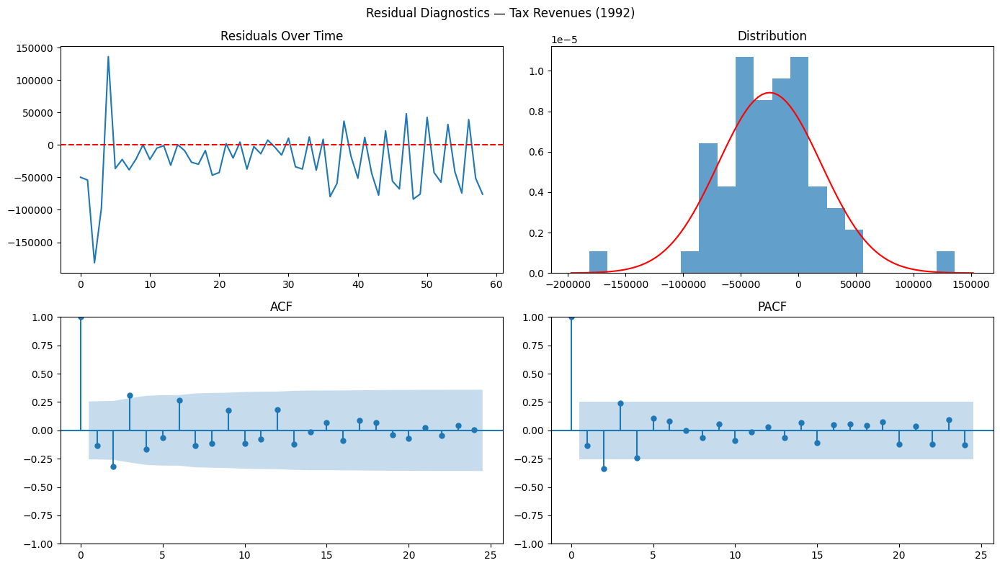

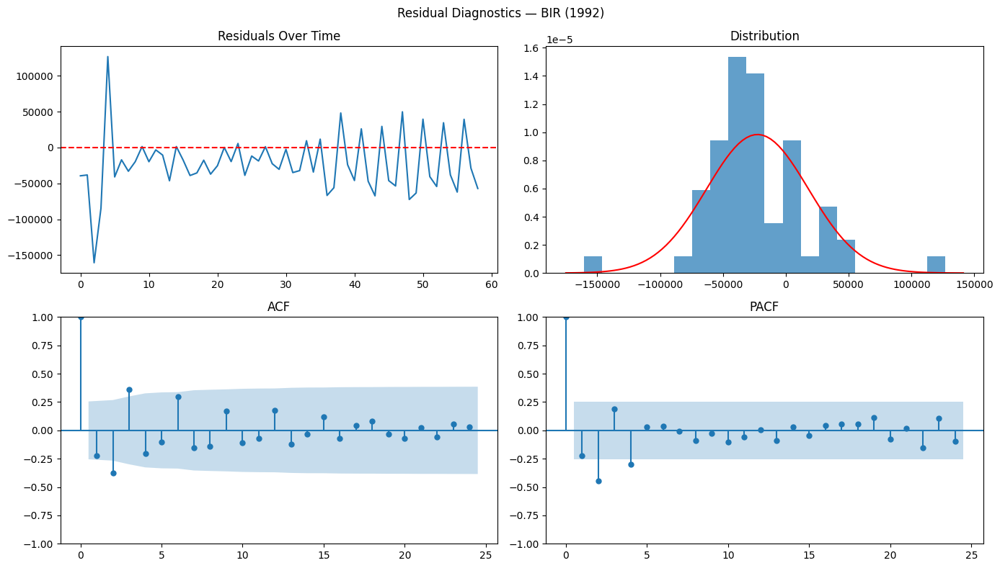

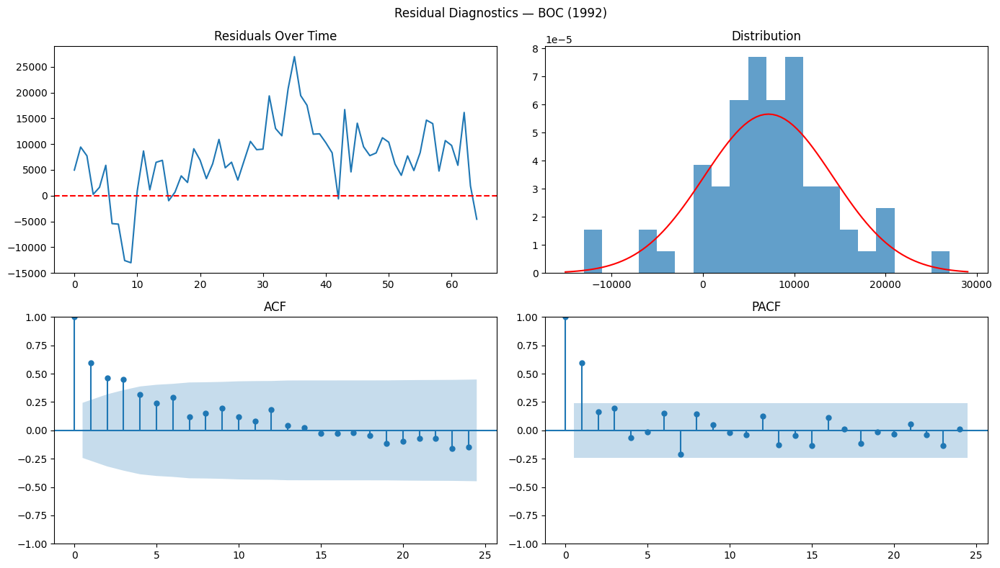

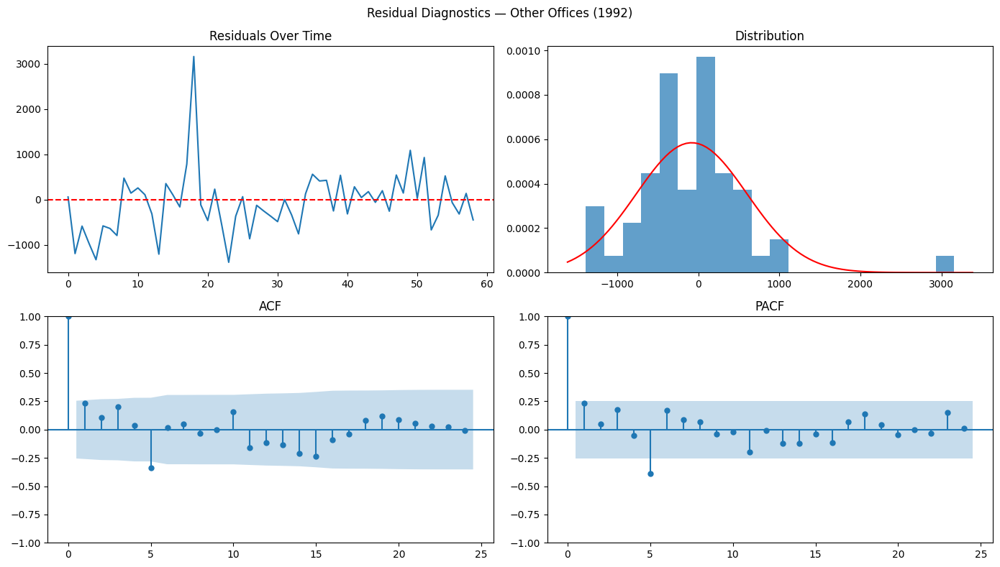

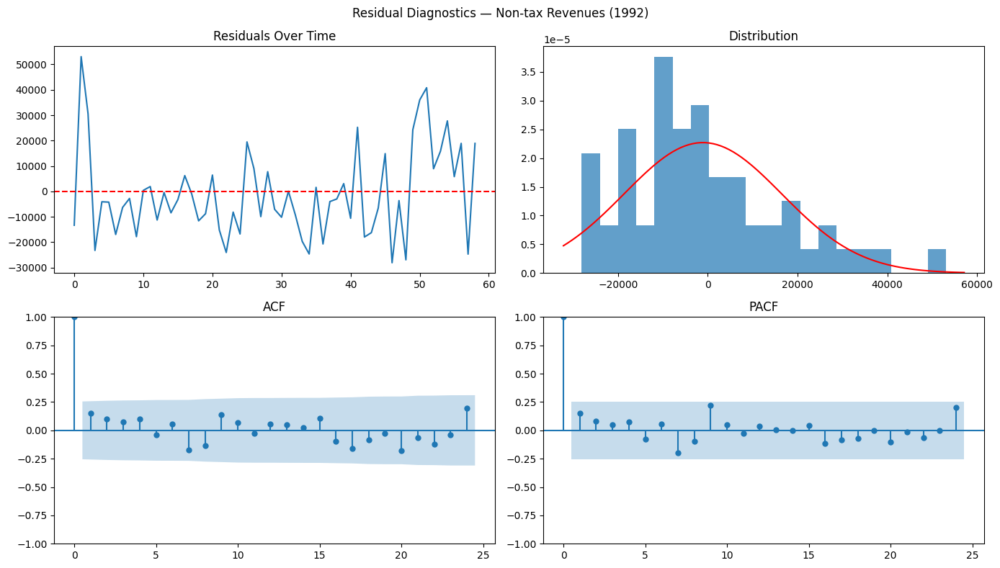

...

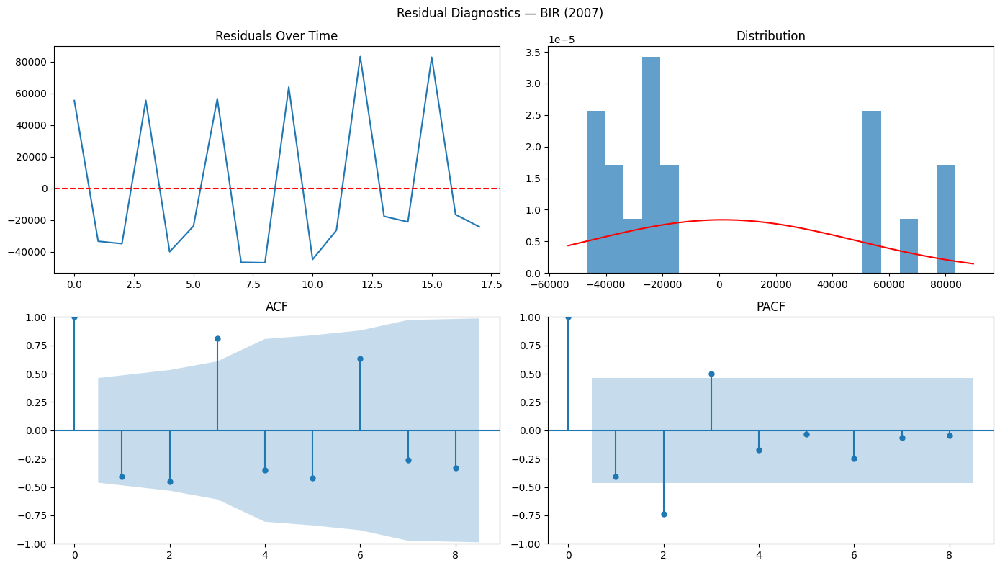

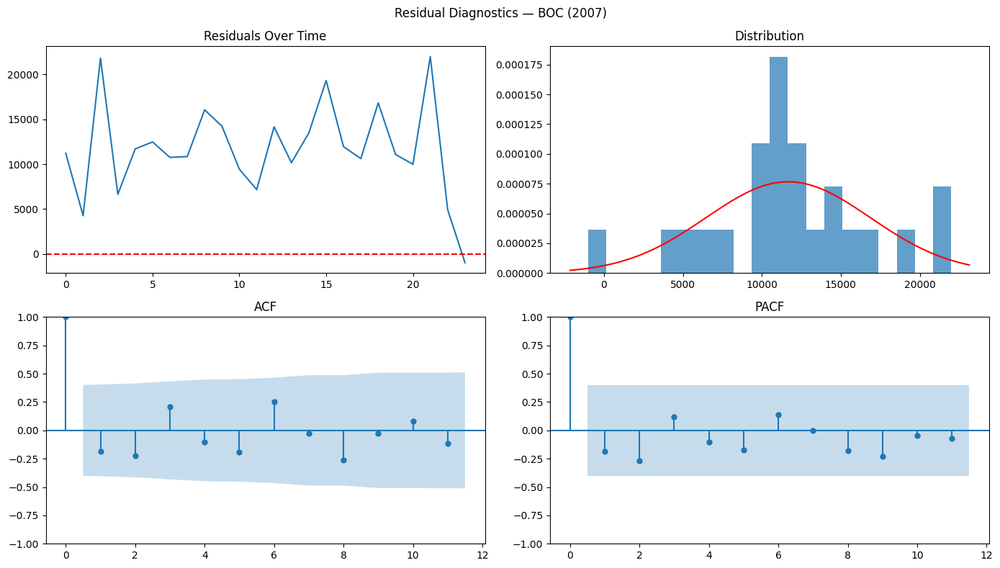

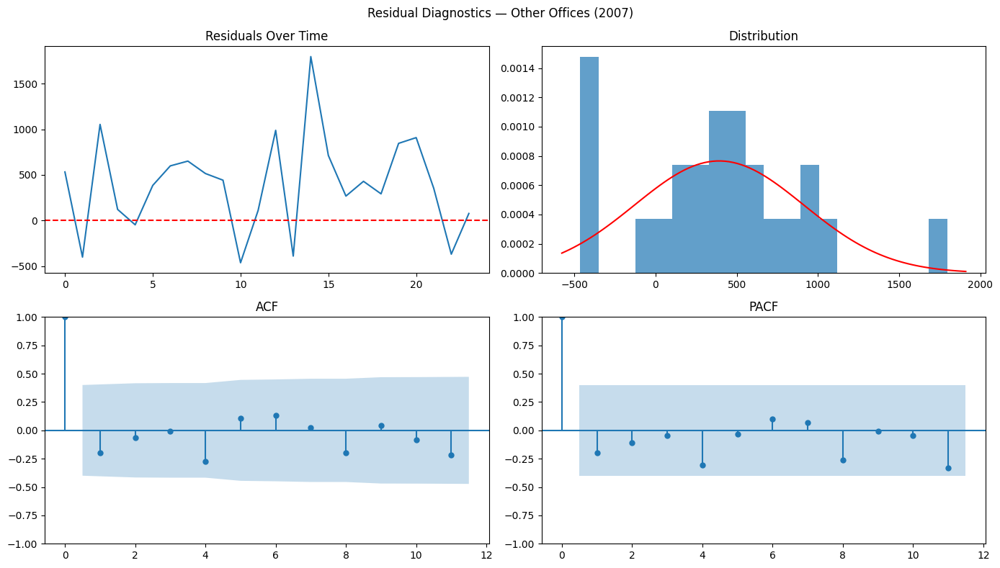

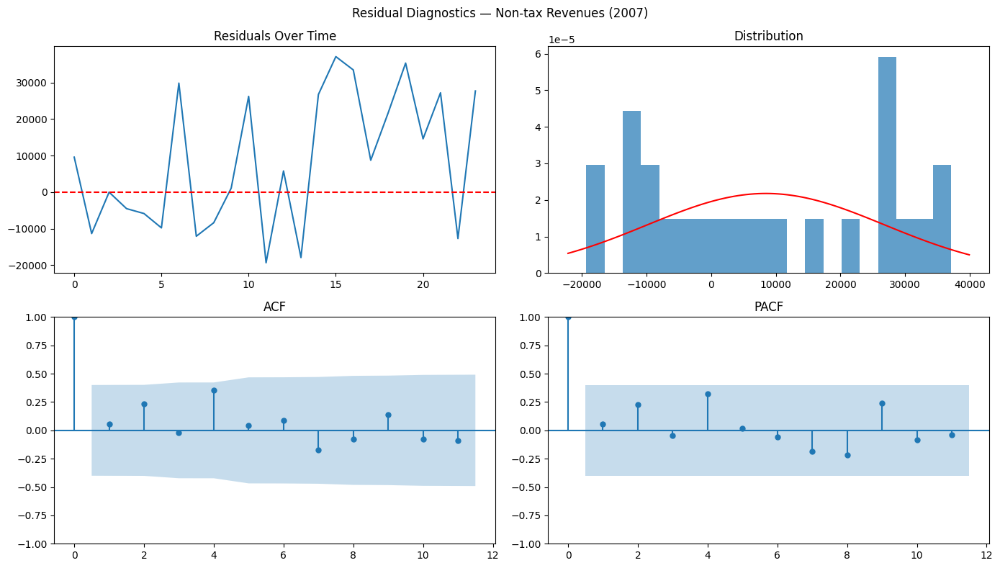

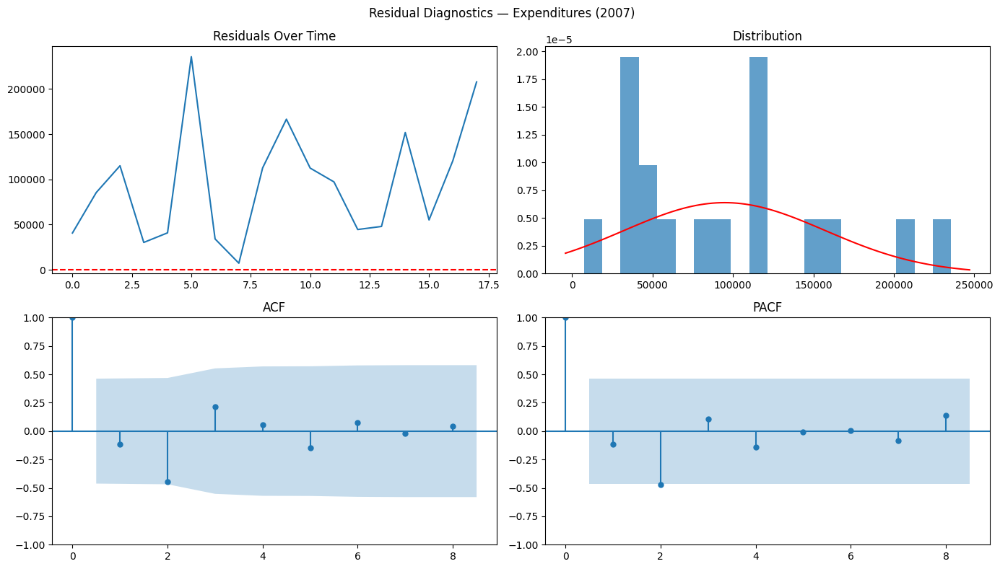

In [8]:
for start_date in START_DATES:
    for label in LABEL_COLS:
        label_slug     = label.replace(' ', '_')
        exp_name       = f"{label_slug}_{start_date[:4]}"
        results_folder = f"results/{exp_name}"

        actual    = np.load(f"{results_folder}/test_actuals.npy").flatten()
        preds     = np.load(f"{results_folder}/test_predictions.npy").flatten()
        residuals = actual - preds

        plot_residual_diagnostics(
            actual, preds,
            f"{label} ({start_date[:4]})",
            save_dir=results_folder
        )


In [9]:
SARIMA_GRID = {
    'p_range': range(0, 3),
    'd_range': range(0, 2),
    'q_range': range(0, 3),
    'P_range': (0, 1),
    'D_range': (0, 1),
    'Q_range': (0, 1),
    's_range': (3,6,12),
    'top_n':   5,
    'n_jobs':  max(1, (os.cpu_count() or 2) - 1)
}

sarima_summary = {}

for start_date in START_DATES:
    sarima_summary[start_date] = {}

    for label in LABEL_COLS:
        label_slug = label.replace(' ', '_')
        exp_name   = f"{label_slug}_{start_date[:4]}"
        results_folder = f"results/{exp_name}"

        print(f"\n{'='*60}\n  {label} | Start: {start_date[:4]}\n{'='*60}")

        # Load residuals
        train_actuals   = np.load(f"{results_folder}/train_actuals.npy").flatten()
        train_preds_arr = np.load(f"{results_folder}/train_predictions.npy").flatten()
        val_actuals     = np.load(f"{results_folder}/val_actuals.npy").flatten()
        val_preds_arr   = np.load(f"{results_folder}/val_predictions.npy").flatten()
        test_actuals    = np.load(f"{results_folder}/test_actuals.npy").flatten()
        tcn_preds       = np.load(f"{results_folder}/test_predictions.npy").flatten()

        train_residuals = train_actuals - train_preds_arr
        val_residuals   = val_actuals   - val_preds_arr
        fit_residuals   = np.concatenate([train_residuals, val_residuals])
        test_residuals  = test_actuals  - tcn_preds

        # Grid search
        print(f"\n  Grid search... (n_jobs={SARIMA_GRID['n_jobs']})")
        best = sm.gridsearch(train=train_residuals, val=val_residuals, **SARIMA_GRID)
        print(f"\n  Top {SARIMA_GRID['top_n']} by MSE:")
        print(best.to_string(index=False))
        best.to_csv(f"{results_folder}/arima_grid_search.csv", index=False)

        # Final fit
        print("\n  Fitting best model...")
        top = best.iloc[0]
        residual_preds, metrics = sm.fit_sarima(
            fit_residuals, test_residuals,
            order=top['order'],
            seasonal_order=top['seasonal_order'],
        )

        # Hybrid prediction
        hybrid_preds   = tcn_preds + residual_preds
        hybrid_metrics = sm.compute_metrics(test_actuals, hybrid_preds)
        tcn_metrics    = sm.compute_metrics(test_actuals, tcn_preds)

        np.save(f"{results_folder}/arima_residual_predictions.npy", residual_preds)
        np.save(f"{results_folder}/hybrid_predictions.npy",         hybrid_preds)

        sarima_summary[start_date][label] = {
            'order':          list(top['order']),
            'seasonal_order': list(top['seasonal_order']),
            'tcn_mape':       float(tcn_metrics['mape']),
            'tcn_rmse':       float(tcn_metrics['rmse']),
            'hybrid_mape':    float(hybrid_metrics['mape']),
            'hybrid_rmse':    float(hybrid_metrics['rmse']),
        }

with open("results/arima_summary.json", "w") as f:
    json.dump(sarima_summary, f, indent=4)

# ── Summary ───────────────────────────────────────────────
print(f"\n{'='*60}\nFINAL SUMMARY\n{'='*60}")
rows = []
for start_date, labels in sarima_summary.items():
    for label, info in labels.items():
        rows.append({"Start": start_date[:4], "Label": label, "Model": "TCN",    "MAPE": f"{info['tcn_mape']:.4f}%",    "RMSE": f"{info['tcn_rmse']:.2f}"})
        rows.append({"Start": start_date[:4], "Label": label, "Model": "Hybrid", "MAPE": f"{info['hybrid_mape']:.4f}%", "RMSE": f"{info['hybrid_rmse']:.2f}"})

print(pd.DataFrame(rows).to_string(index=False))


  Tax Revenues | Start: 1992

  Grid search... (n_jobs=21)
  Fitting 432 models (seasonal)...

  Top 5 by MSE:
    order seasonal_order          MSE
(2, 0, 1)  (1, 1, 1, 12) 1.415509e+08
(2, 0, 1)   (0, 0, 1, 3) 1.415958e+08
(2, 0, 1)  (0, 1, 1, 12) 1.419325e+08
(2, 0, 1)  (1, 0, 0, 12) 1.419811e+08
(2, 0, 1)  (0, 0, 1, 12) 1.422318e+08

  Fitting best model...

  BIR | Start: 1992

  Grid search... (n_jobs=21)
  Fitting 432 models (seasonal)...

  Top 5 by MSE:
    order seasonal_order          MSE
(2, 0, 2)  (0, 1, 0, 12) 1.074751e+08
(2, 0, 1)  (0, 1, 0, 12) 1.182529e+08
(2, 0, 2)  (1, 1, 0, 12) 1.242505e+08
(2, 0, 1)  (1, 1, 0, 12) 1.249461e+08
(2, 1, 1)  (1, 1, 0, 12) 1.251982e+08

  Fitting best model...

  BOC | Start: 1992

  Grid search... (n_jobs=21)
  Fitting 432 models (seasonal)...

  Top 5 by MSE:
    order seasonal_order          MSE
(2, 1, 0)   (0, 0, 1, 3) 1.220042e+07
(2, 1, 1)   (1, 0, 0, 3) 1.224303e+07
(0, 1, 1)   (1, 0, 1, 3) 1.227067e+07
(0, 1, 1)   (0, 0, 1, 3)

In [10]:
def plot_test_predictions(test_preds, test_actuals, label, save_dir=None):
    test_preds   = np.array(test_preds).flatten()
    test_actuals = np.array(test_actuals).flatten()

    plt.figure(figsize=(12, 6))
    plt.plot(test_actuals, label='Actual',    linewidth=2)
    plt.plot(test_preds,   label='Predicted', linewidth=2, alpha=0.7)
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.title(f'{label}: Predictions vs Actual')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    if save_dir:
        plt.savefig(f"{save_dir}/predictions.png", dpi=150)
    plt.show()

def plot_qq(actual_dict, pred_dict, label_cols, save_path=None):
    fig, axes = plt.subplots(1, len(label_cols), figsize=(5 * len(label_cols), 4))
    if len(label_cols) == 1:
        axes = [axes]

    for ax, label in zip(axes, label_cols):
        residuals = np.array(actual_dict[label]).flatten() - np.array(pred_dict[label]).flatten()
        stats.probplot(residuals, dist="norm", plot=ax)
        ax.set_title(f'Q-Q Plot — {label}')
        ax.get_lines()[1].set_color('red')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150)
    plt.show()


  PLOTTING: Tax Revenues | Start: 1992


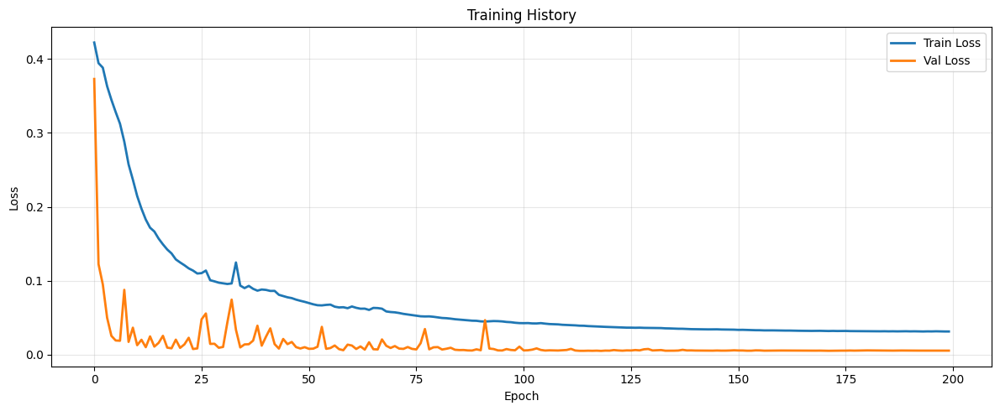

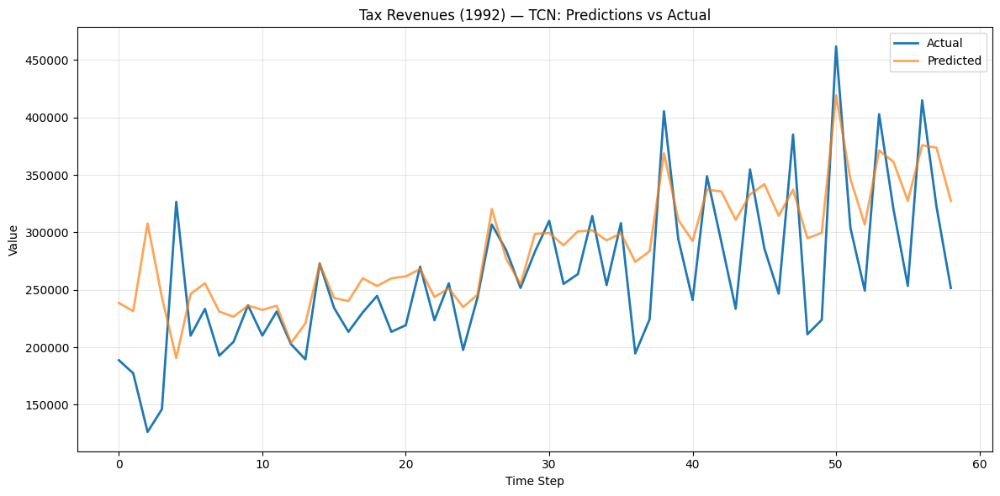

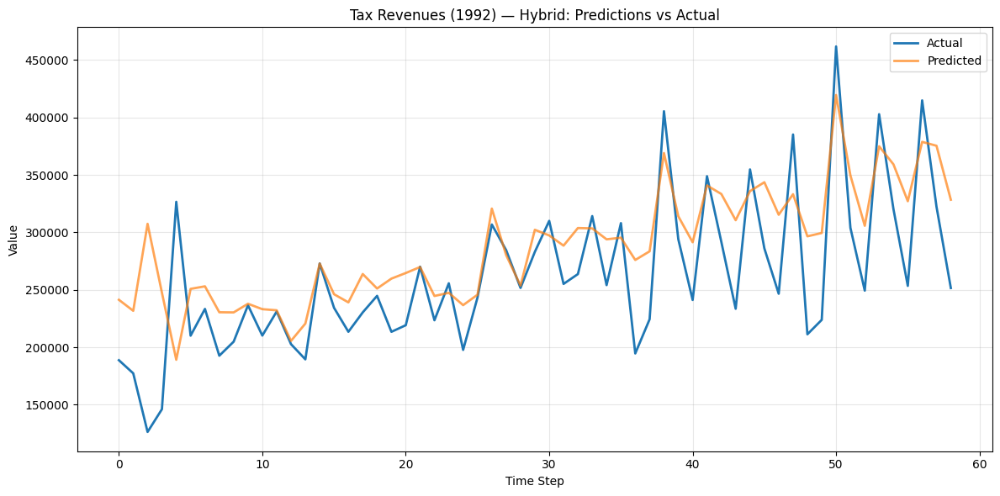

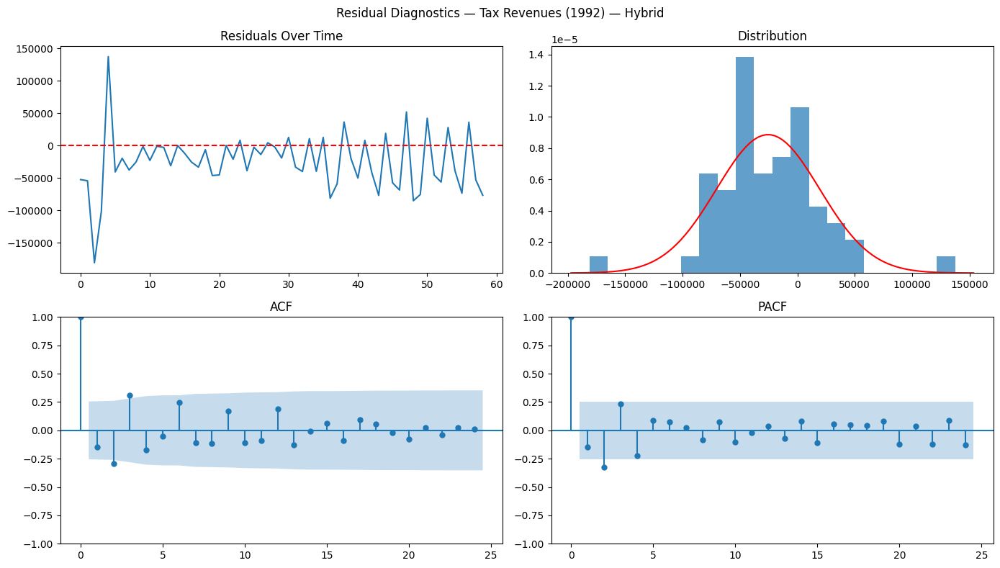

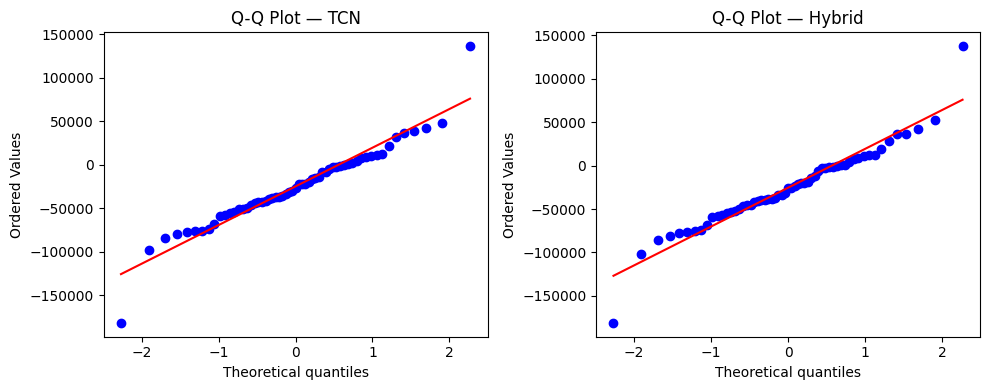


  PLOTTING: BIR | Start: 1992


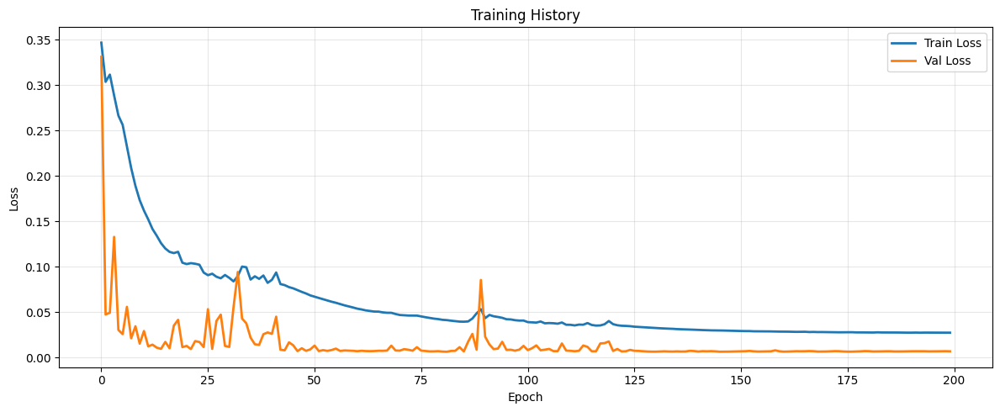

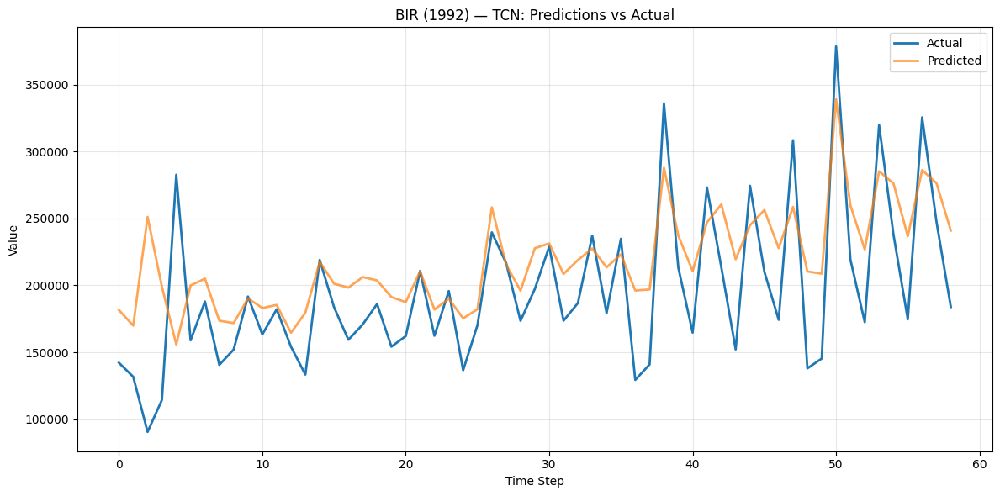

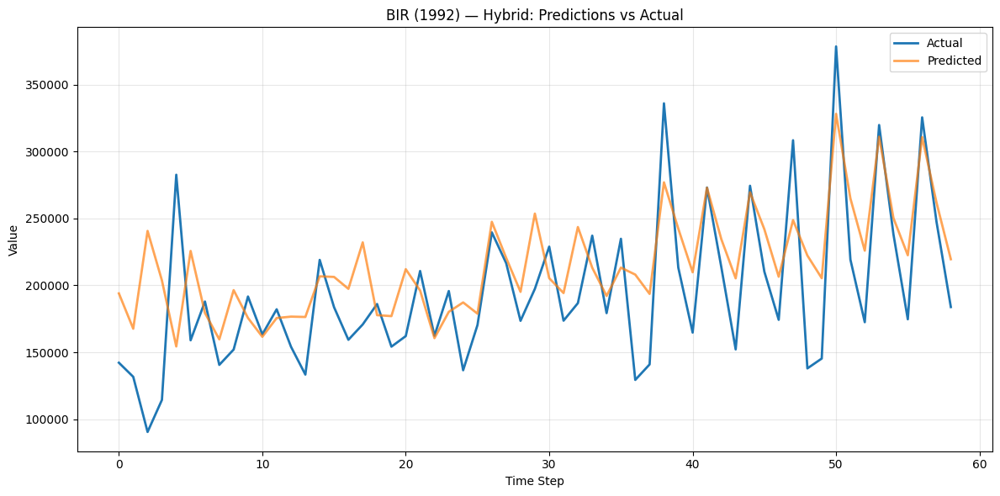

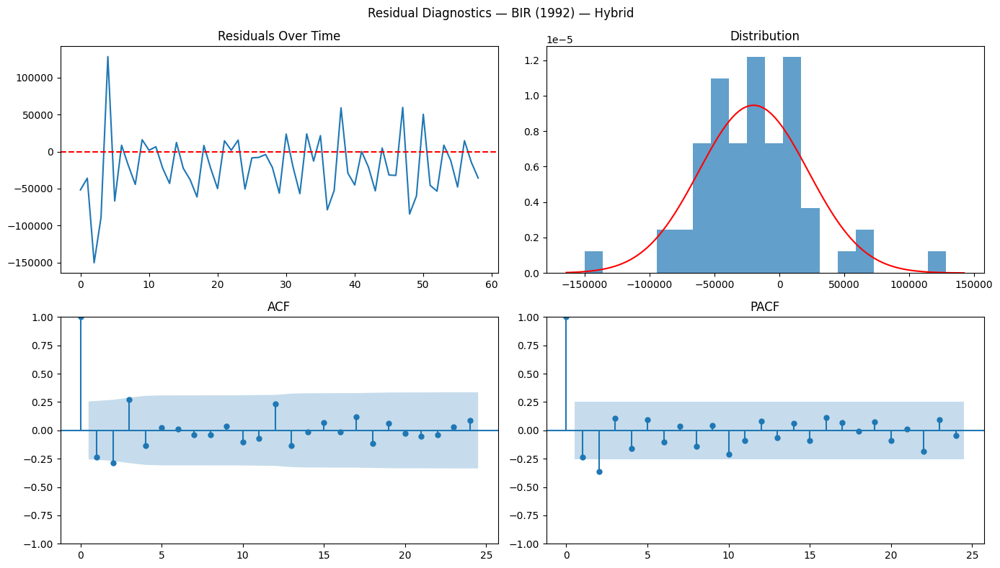

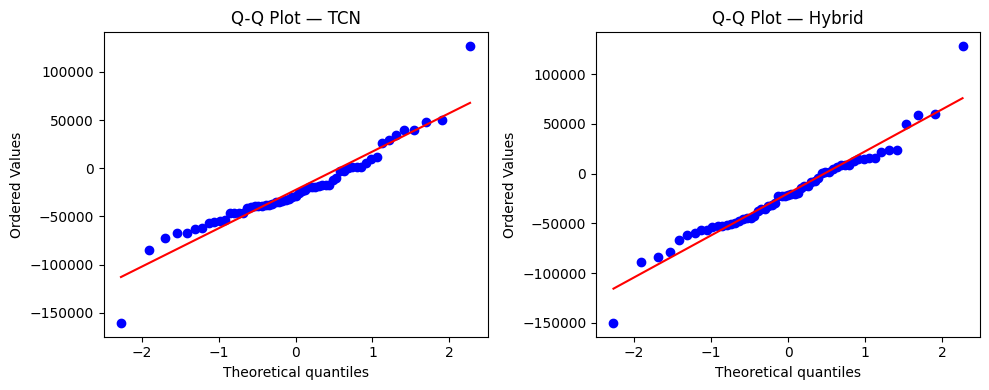


  PLOTTING: BOC | Start: 1992


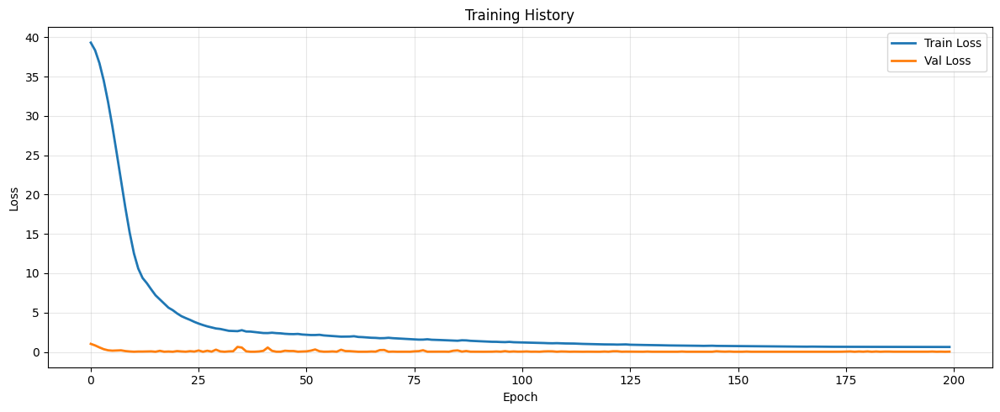

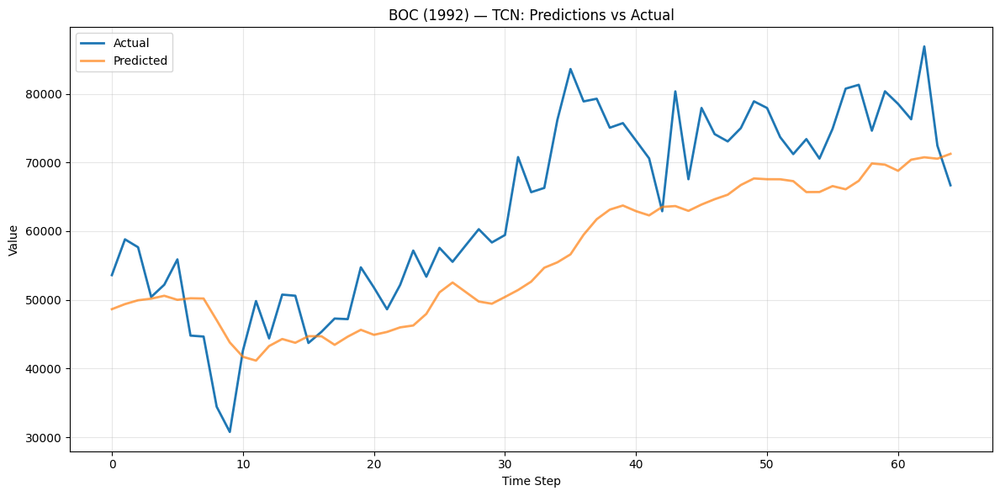

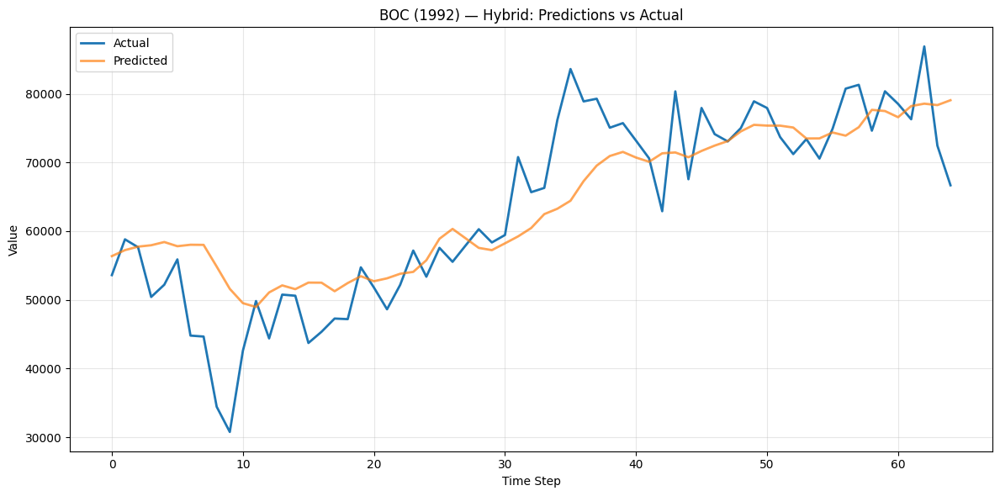

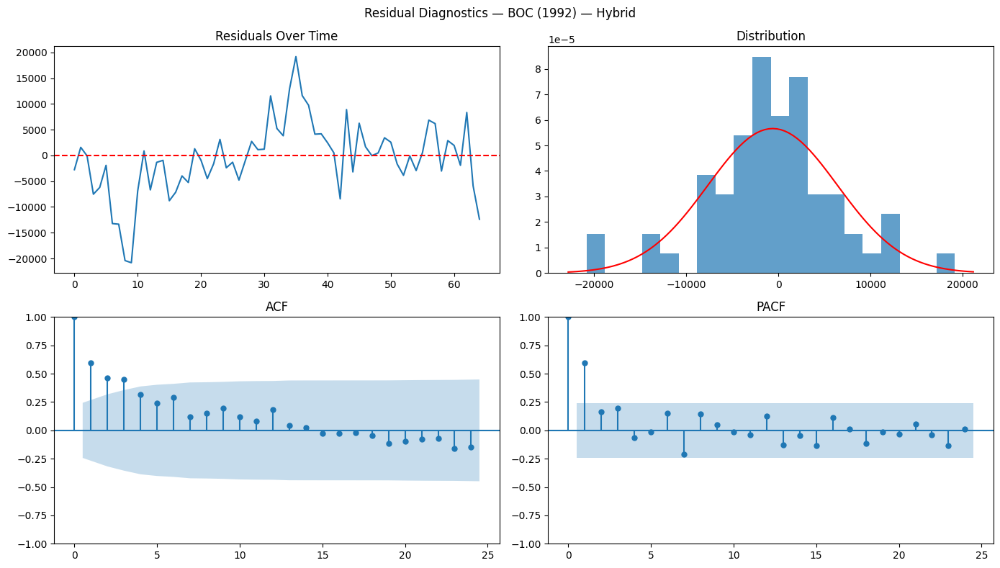

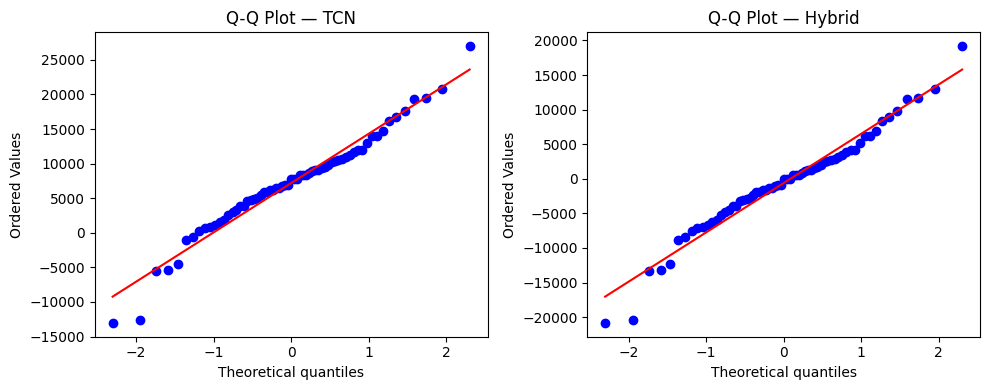


  PLOTTING: Other Offices | Start: 1992


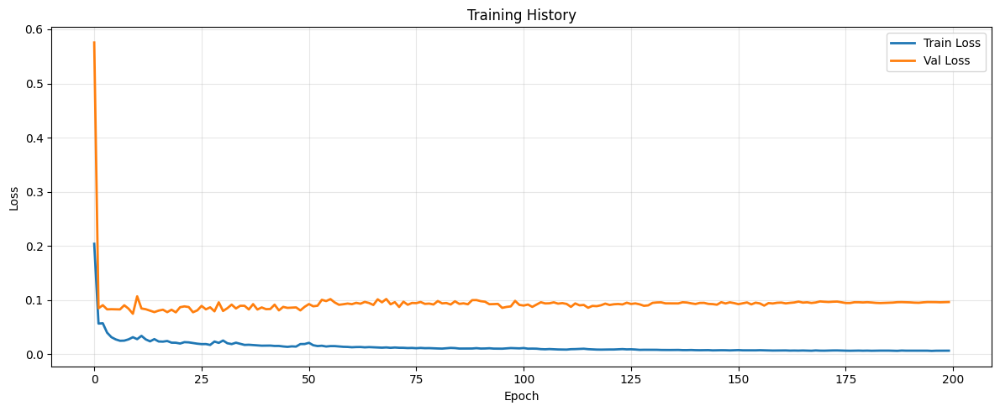

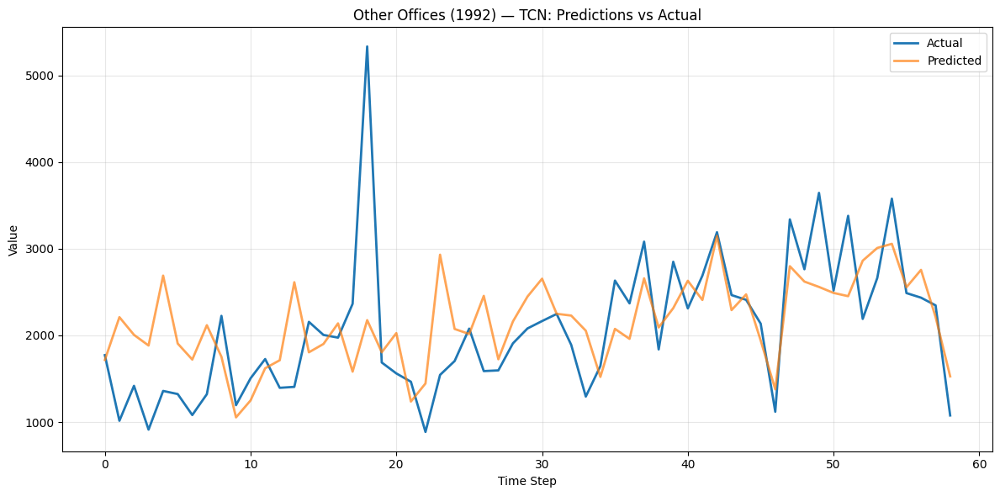

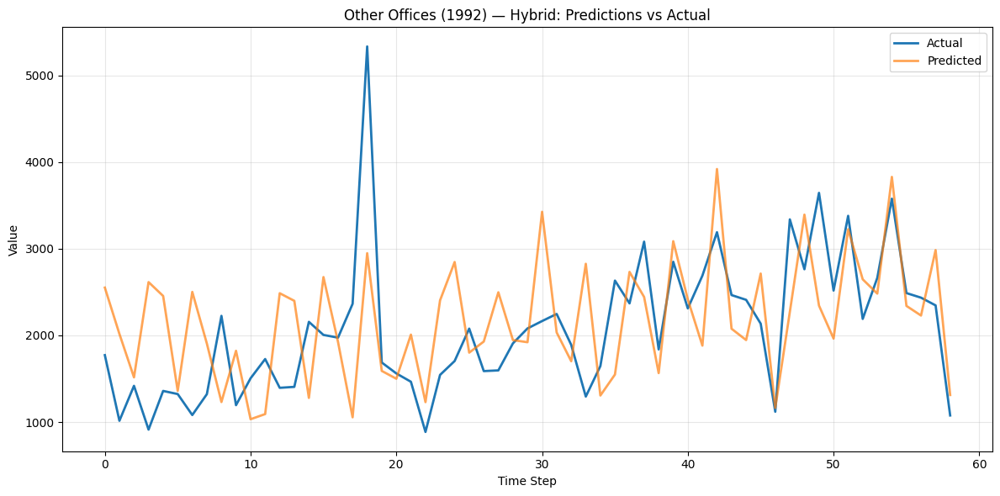

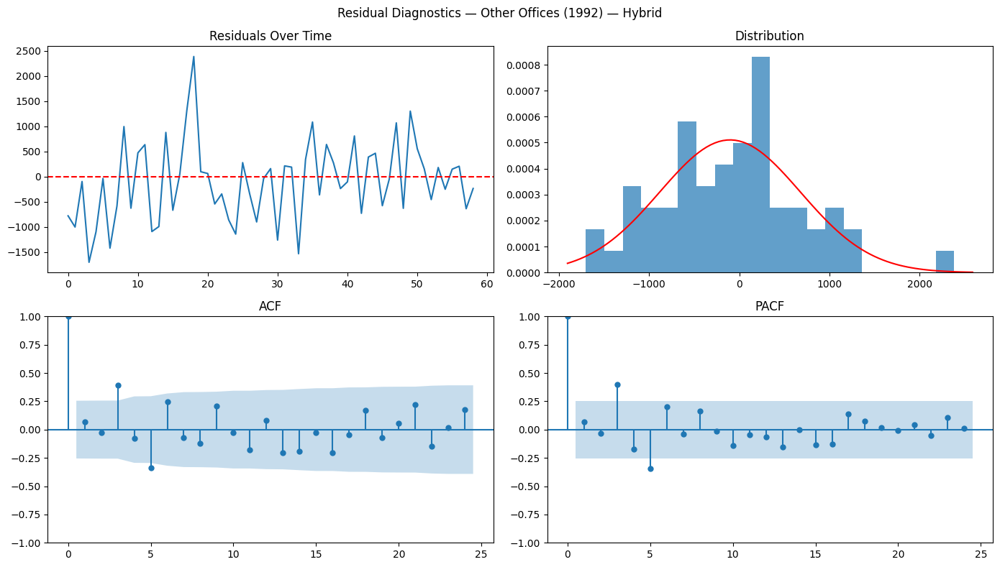

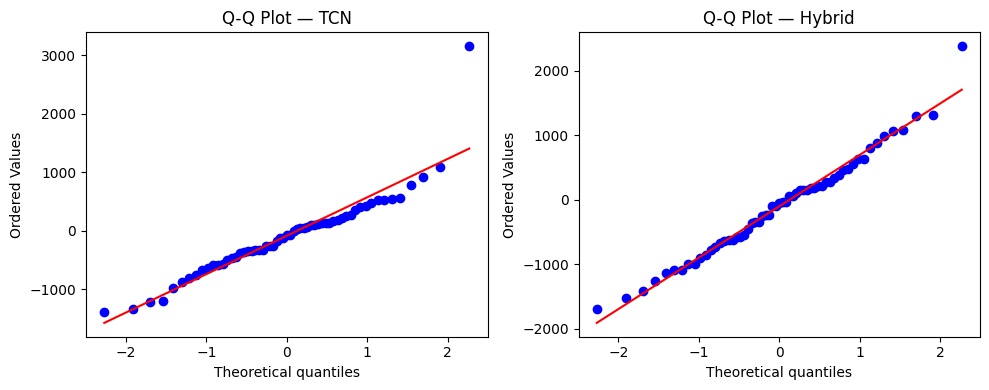


  PLOTTING: Non-tax Revenues | Start: 1992


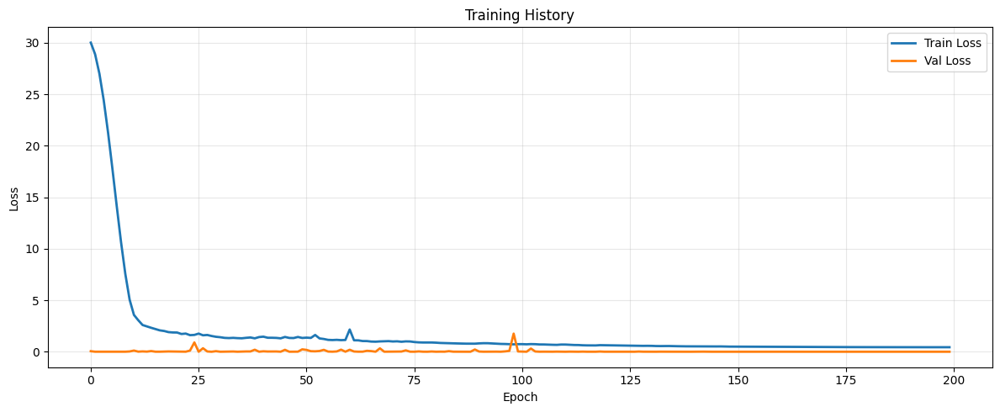

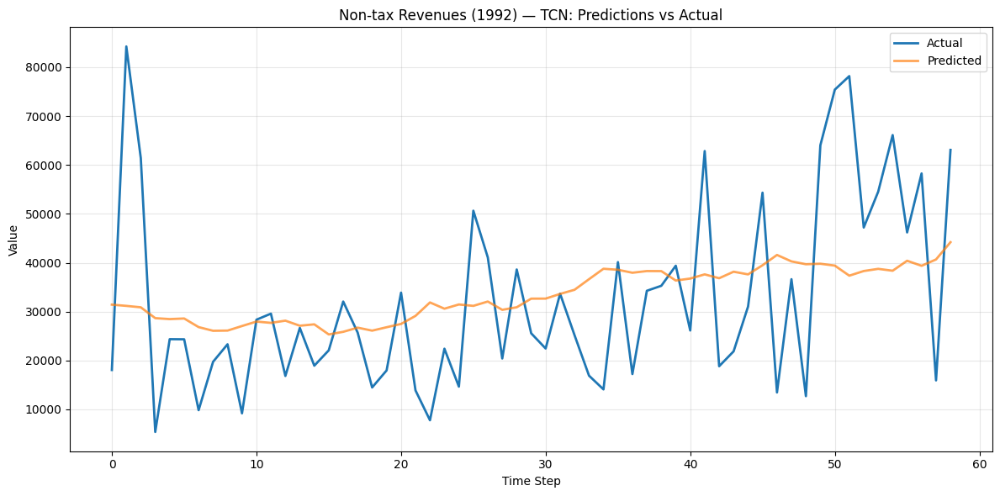

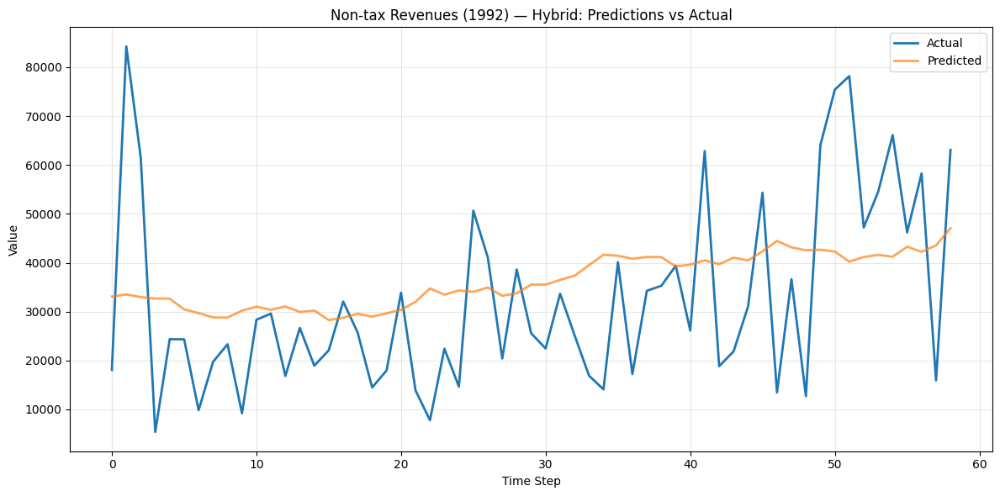

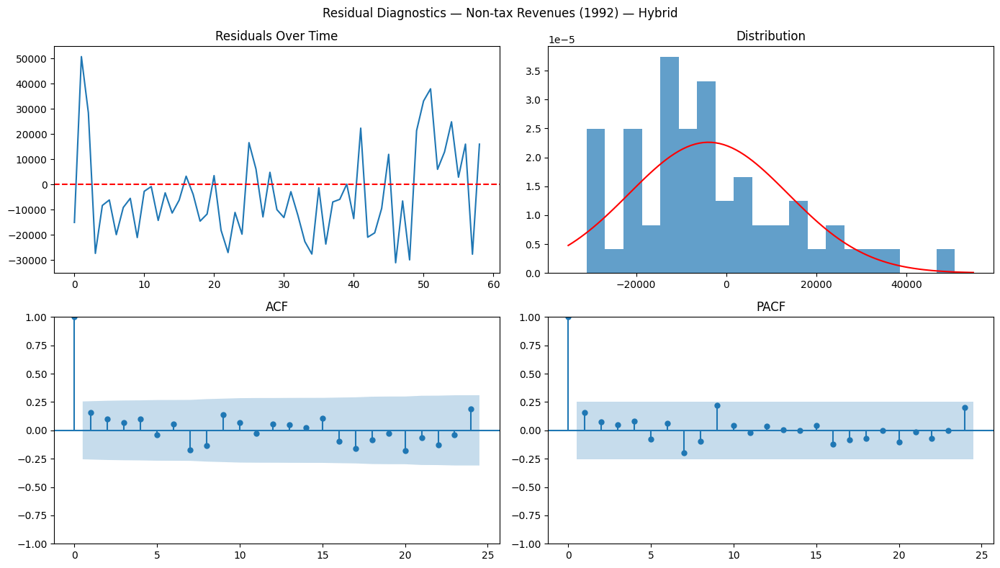

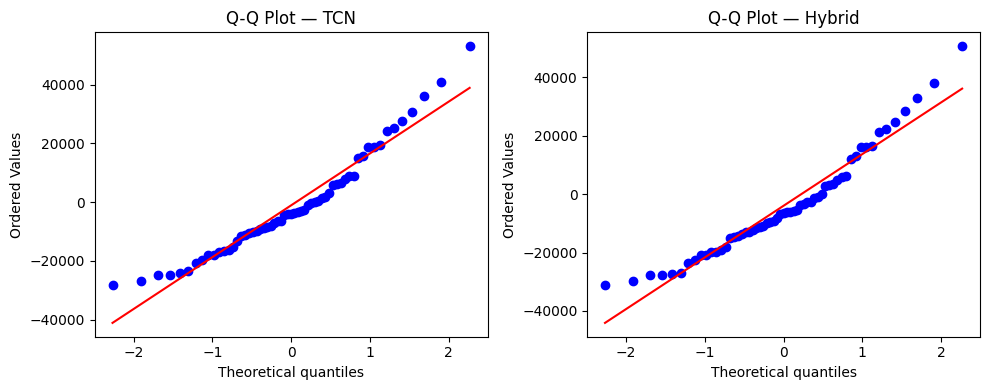


  PLOTTING: Expenditures | Start: 1992


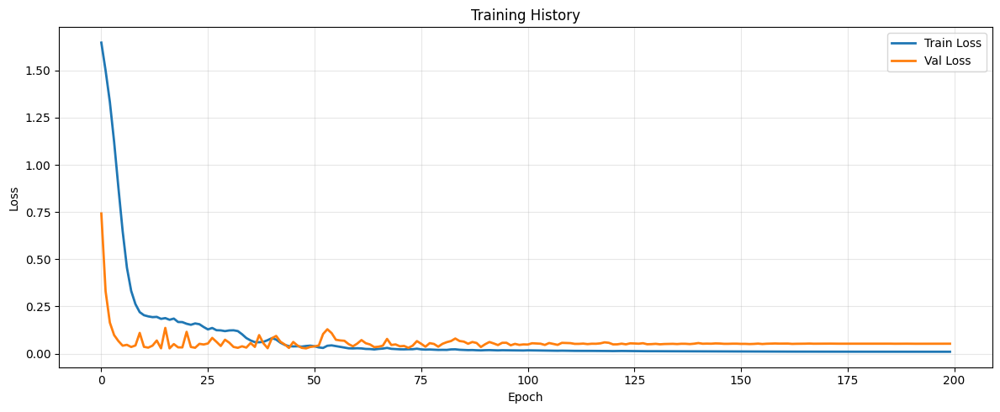

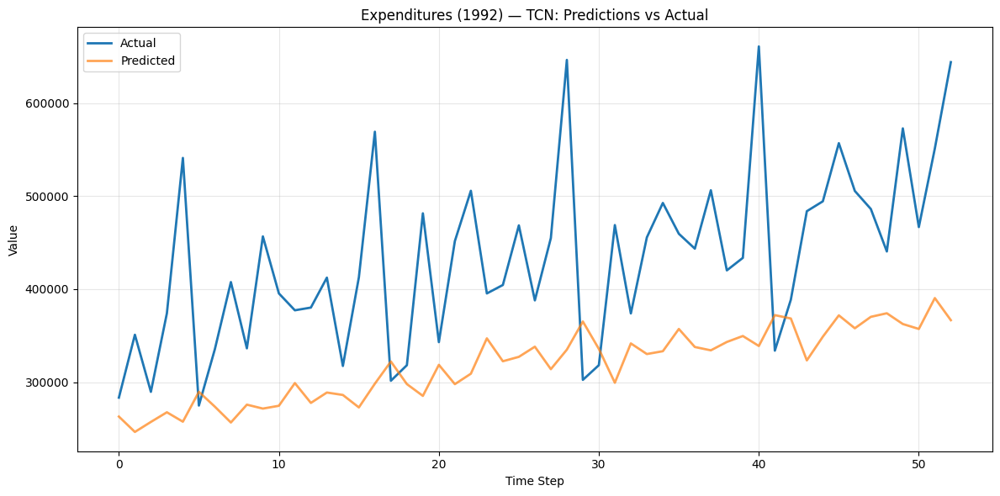

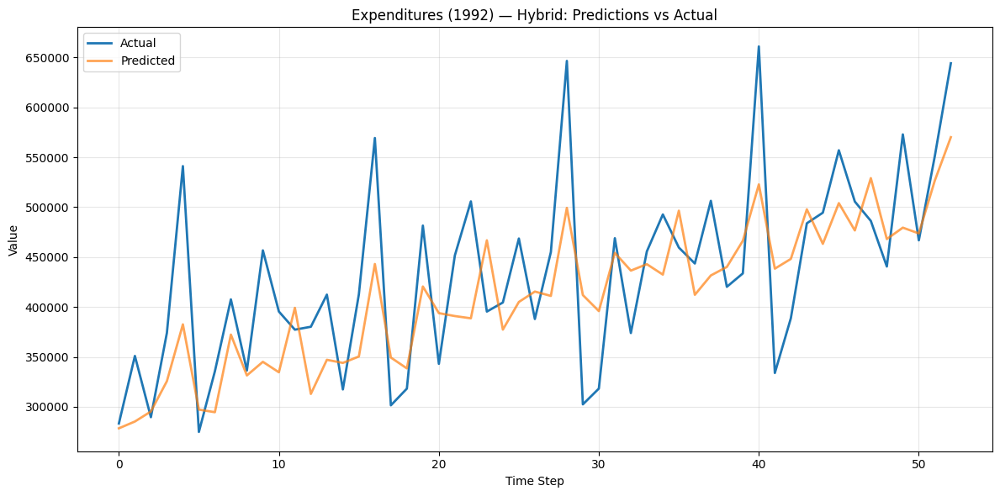

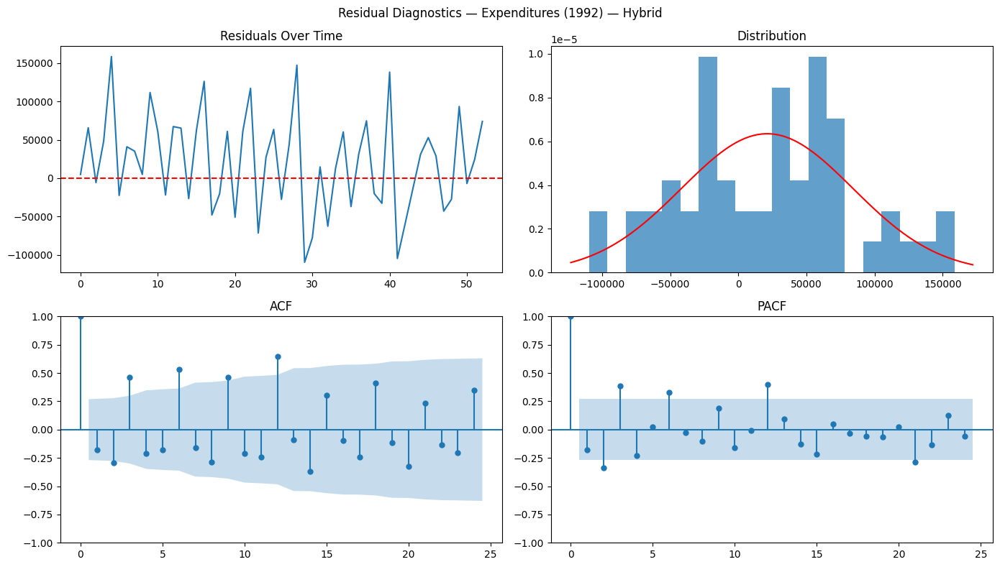

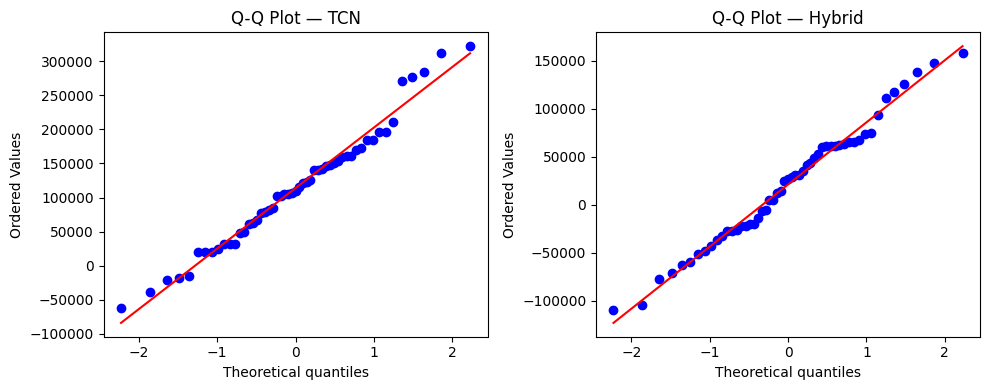


  PLOTTING: Tax Revenues | Start: 2000


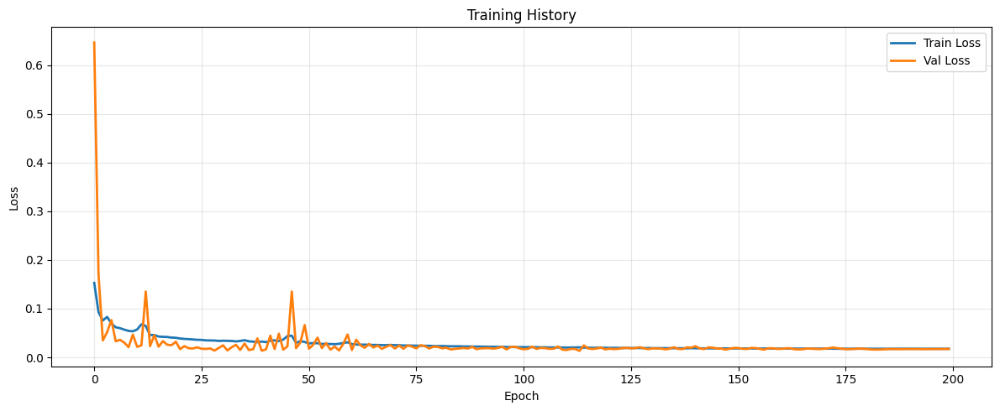

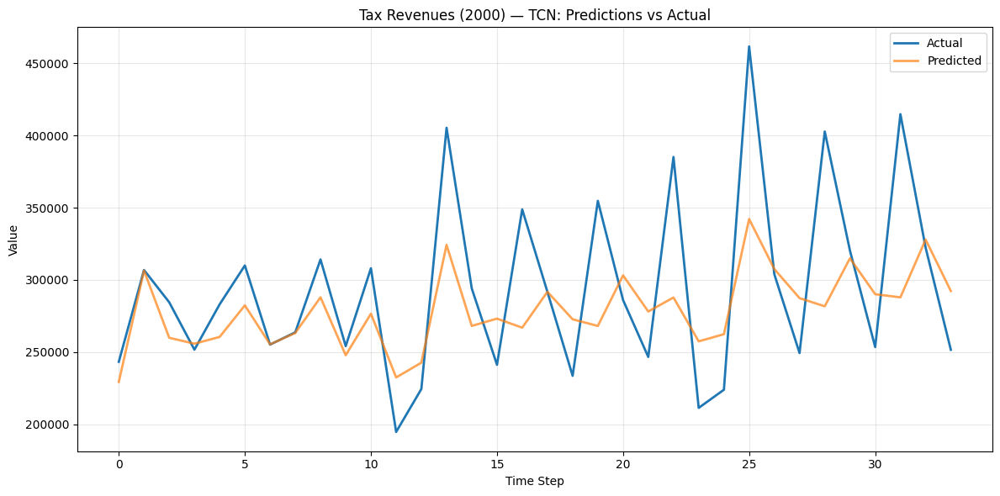

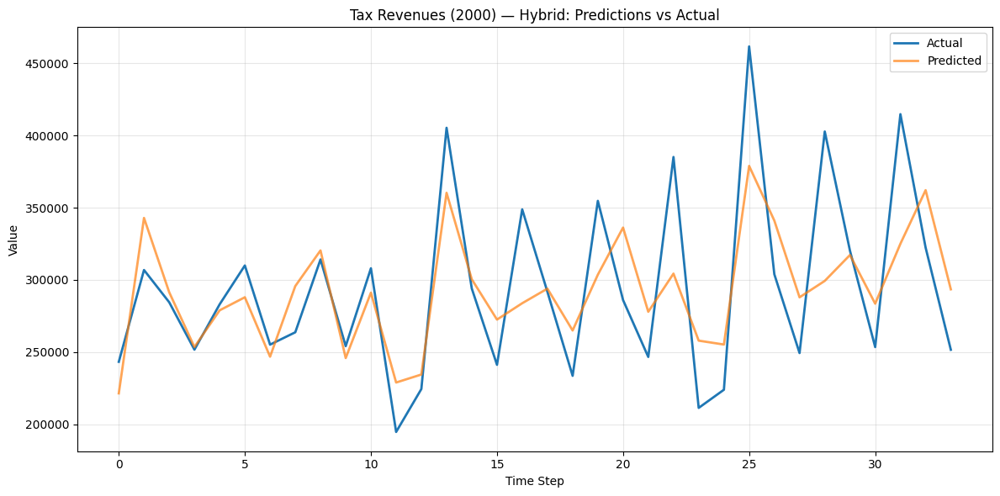

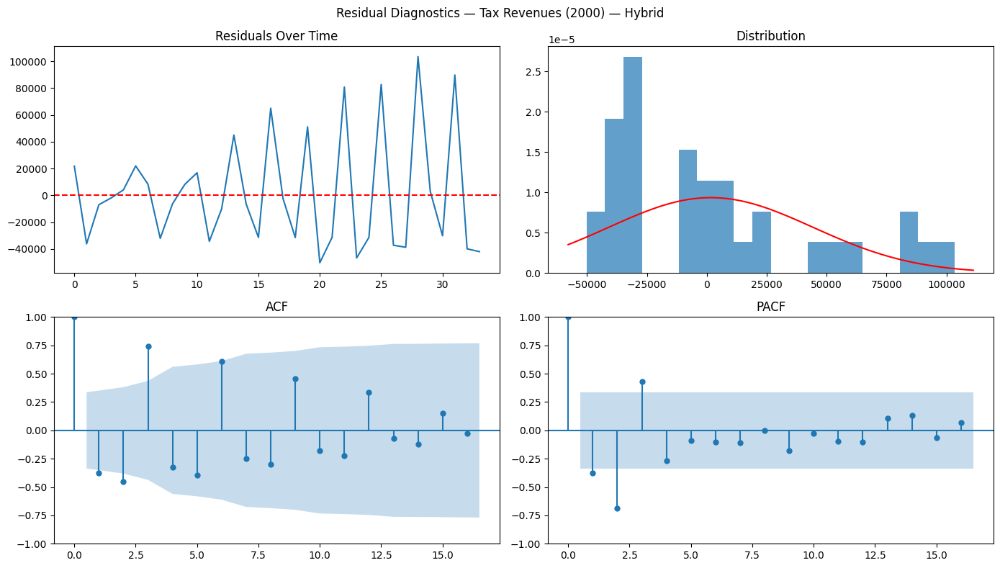

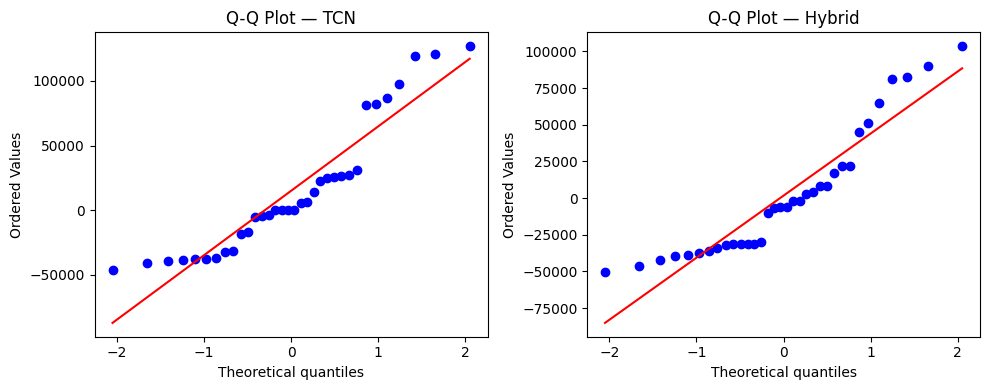


  PLOTTING: BIR | Start: 2000


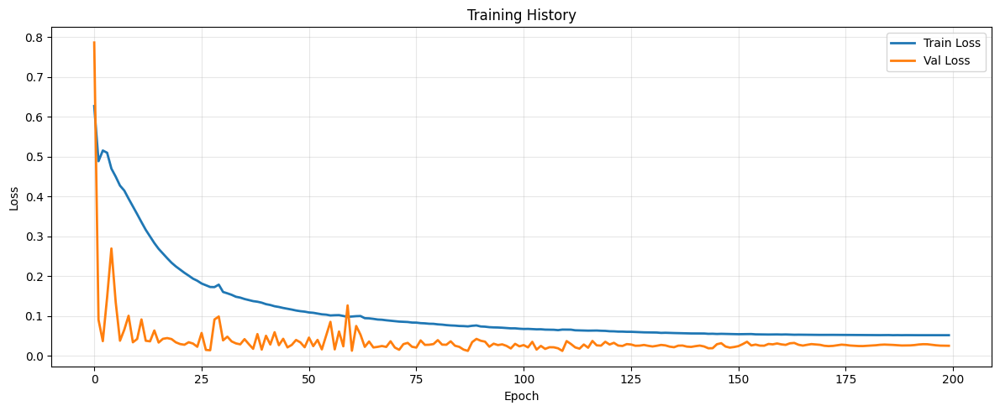

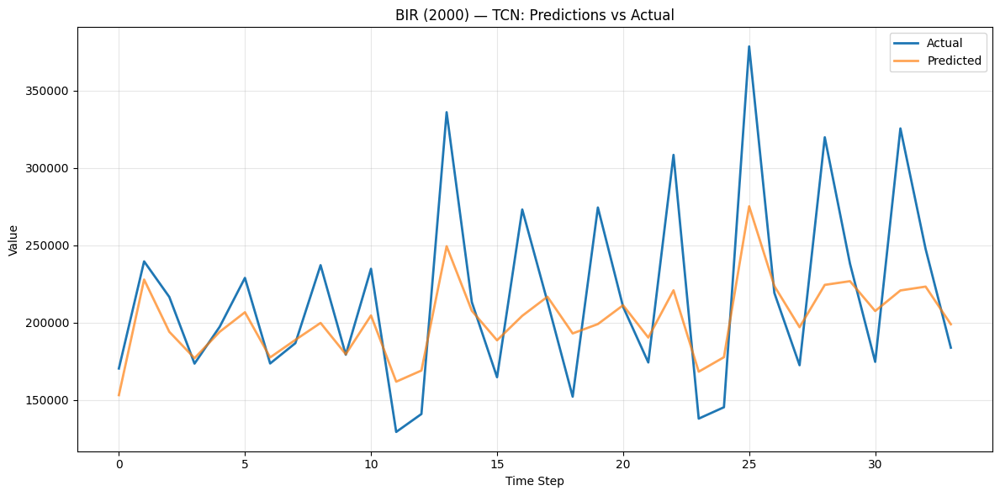

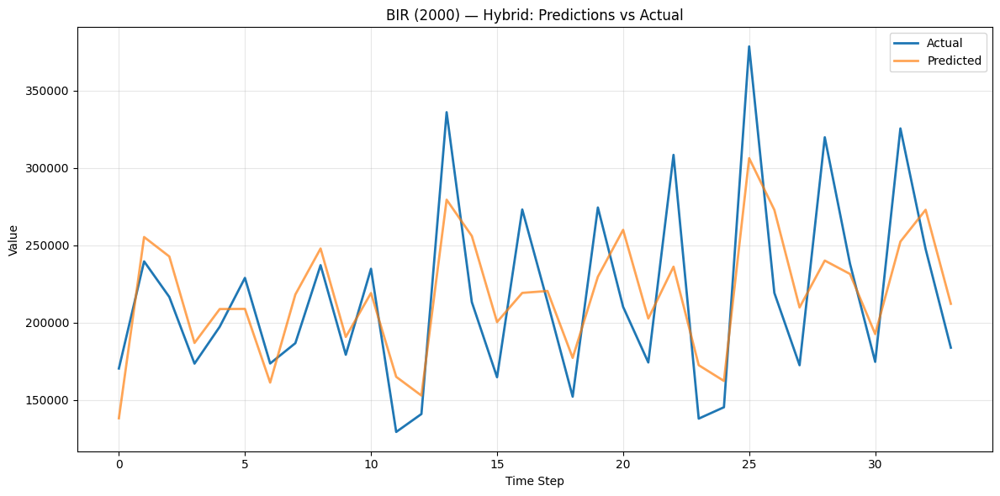

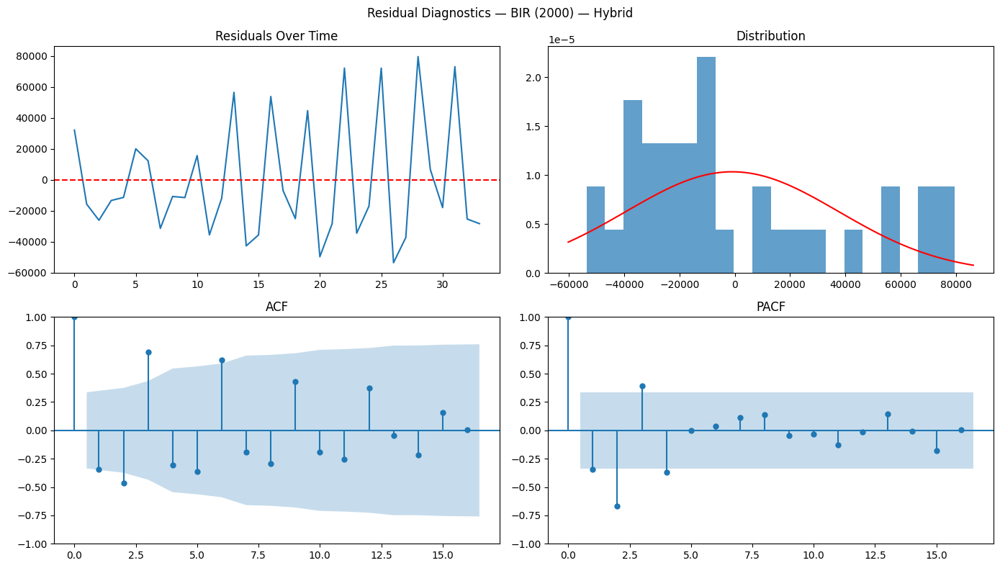

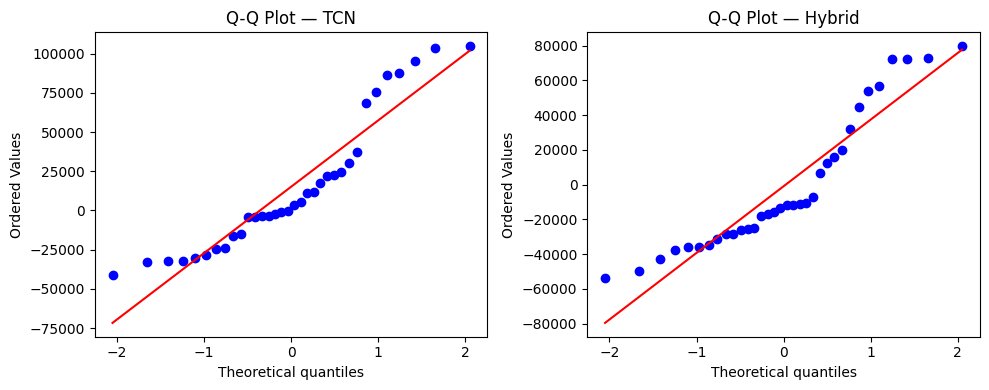


  PLOTTING: BOC | Start: 2000


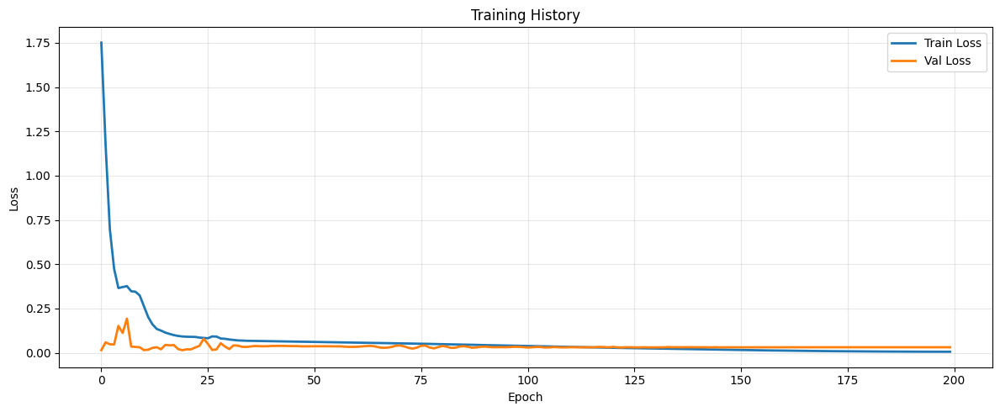

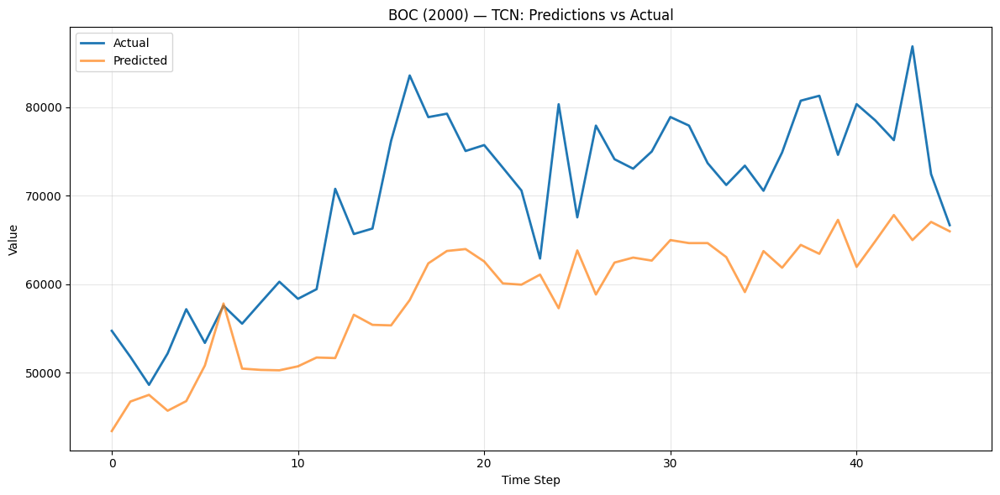

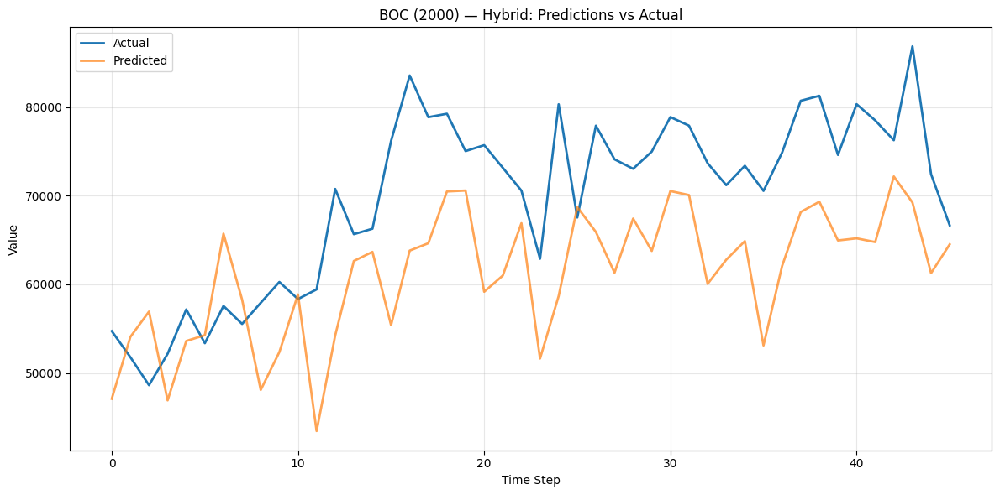

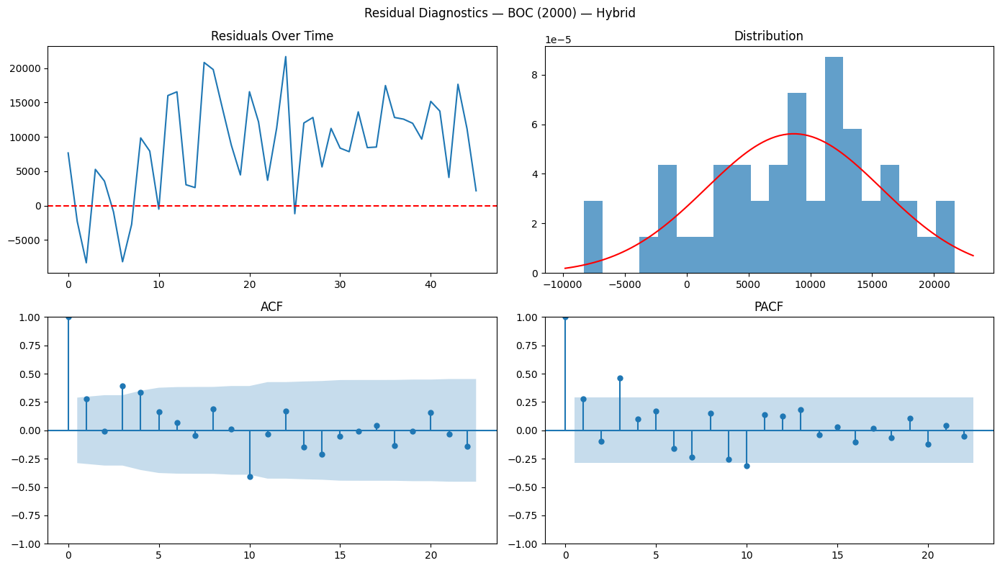

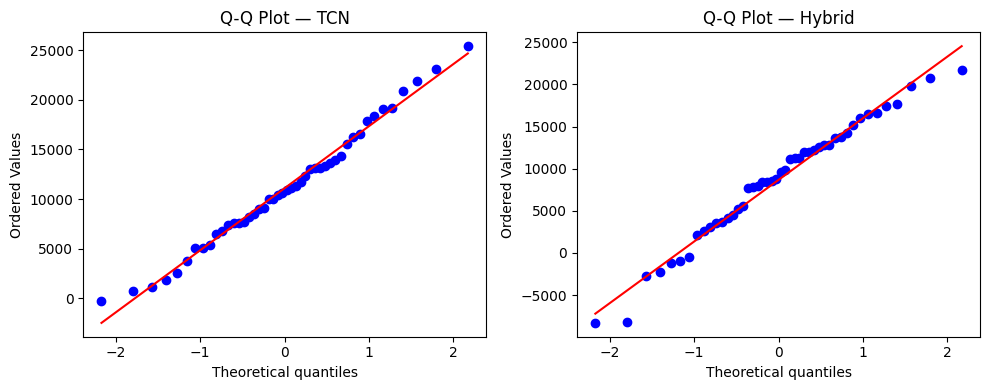


  PLOTTING: Other Offices | Start: 2000


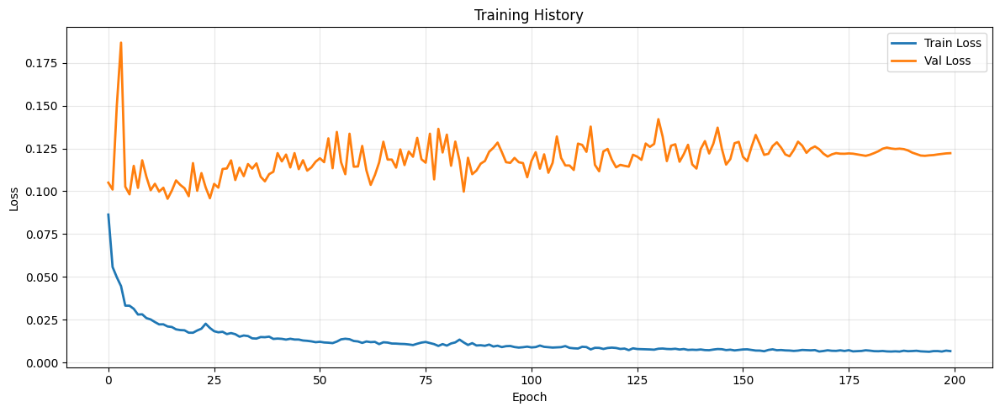

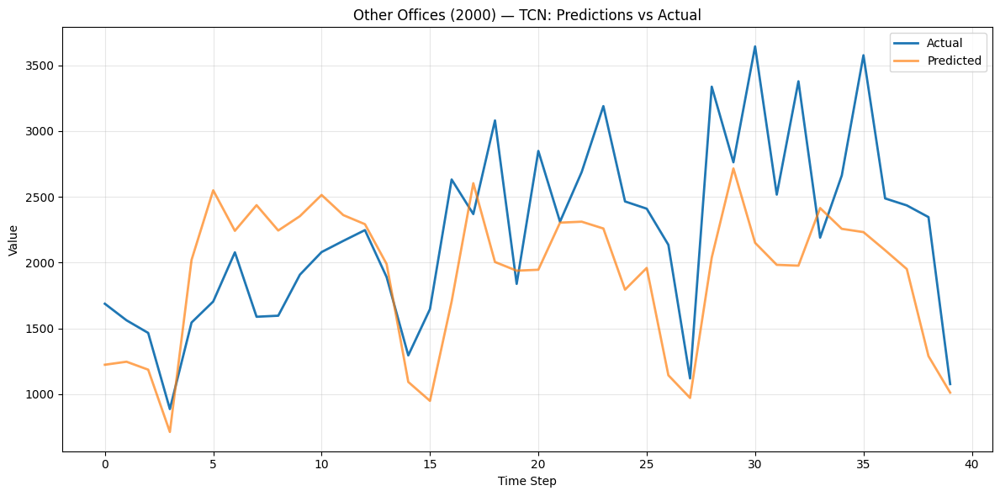

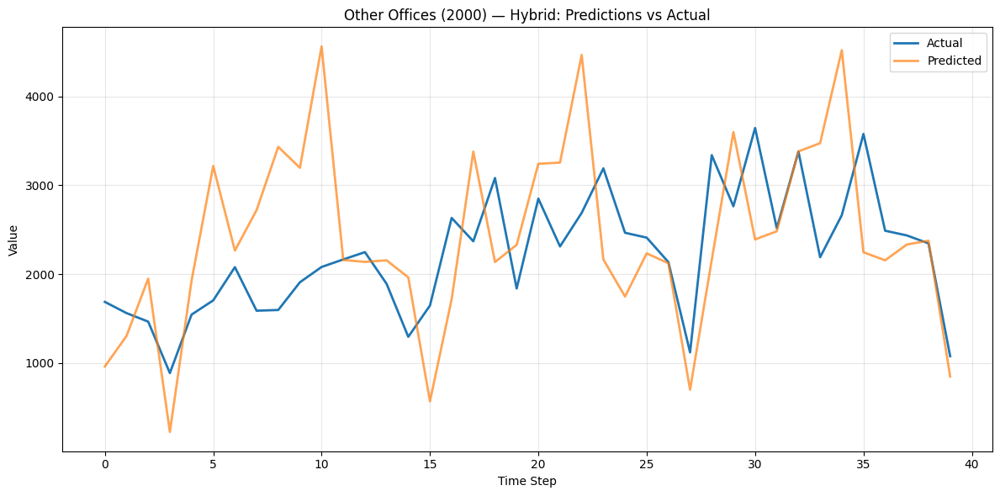

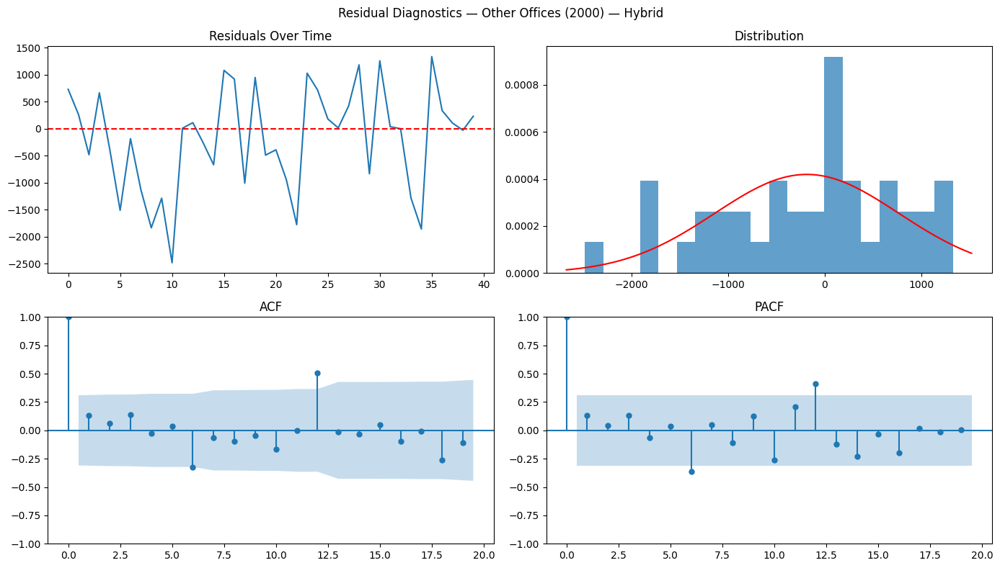

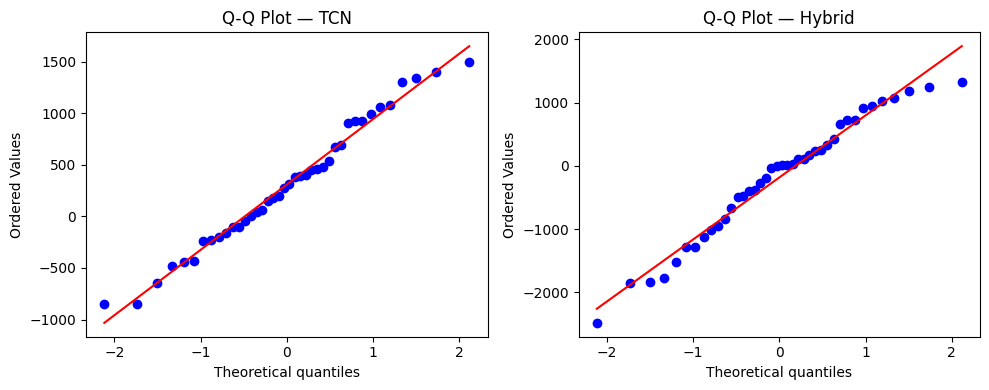


  PLOTTING: Non-tax Revenues | Start: 2000


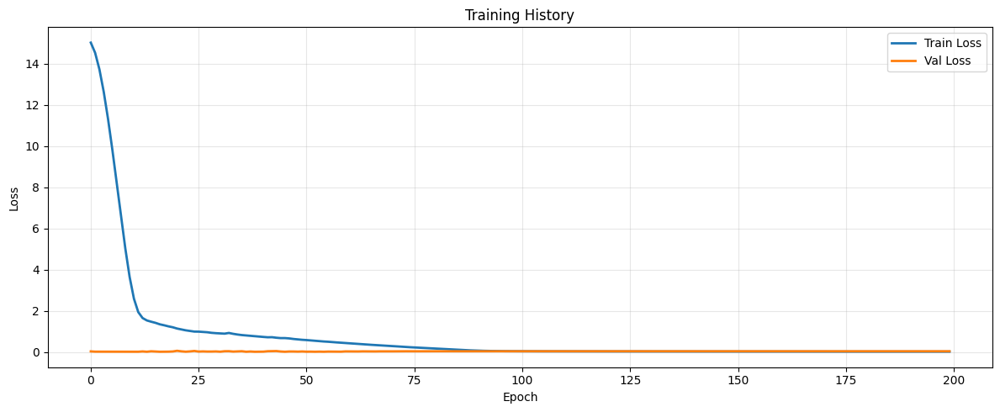

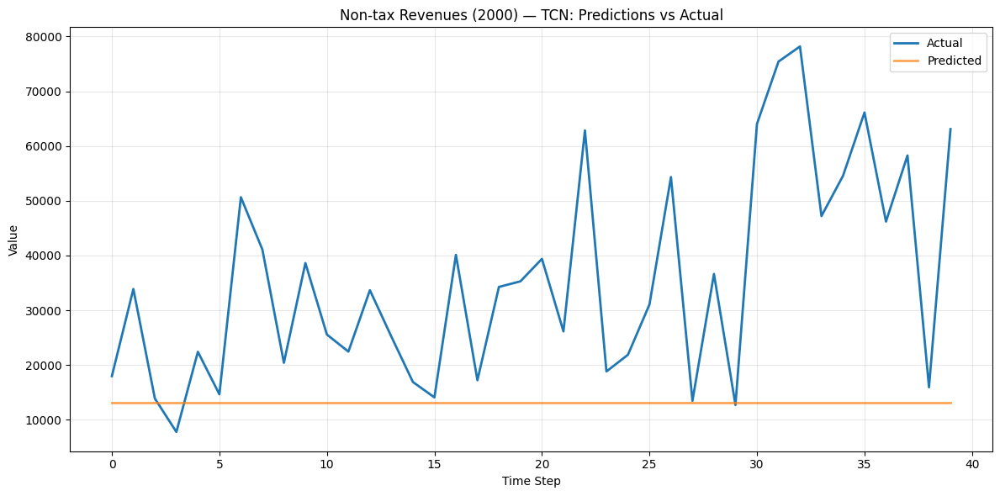

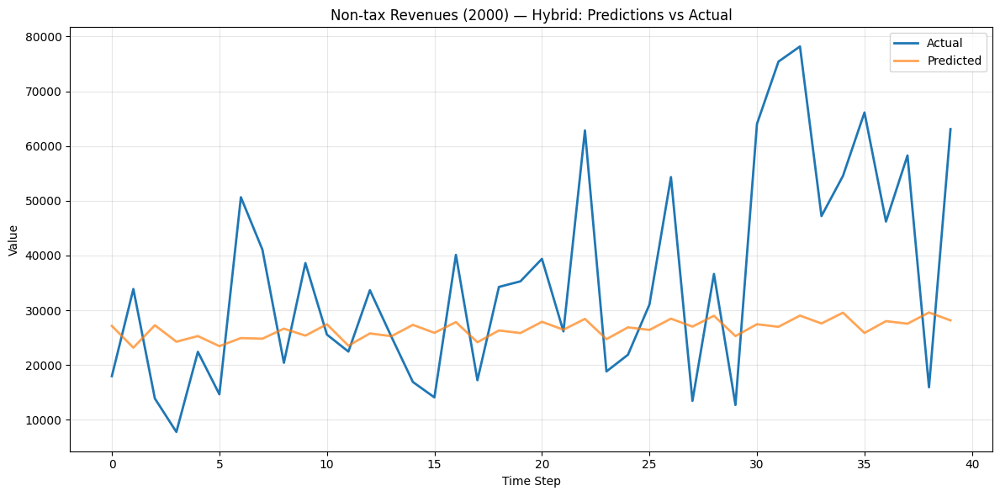

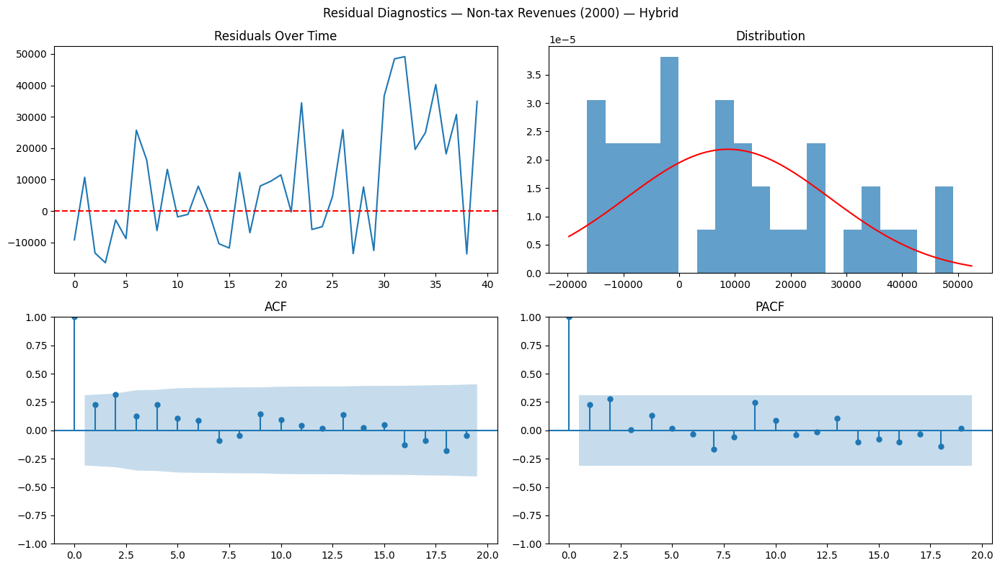

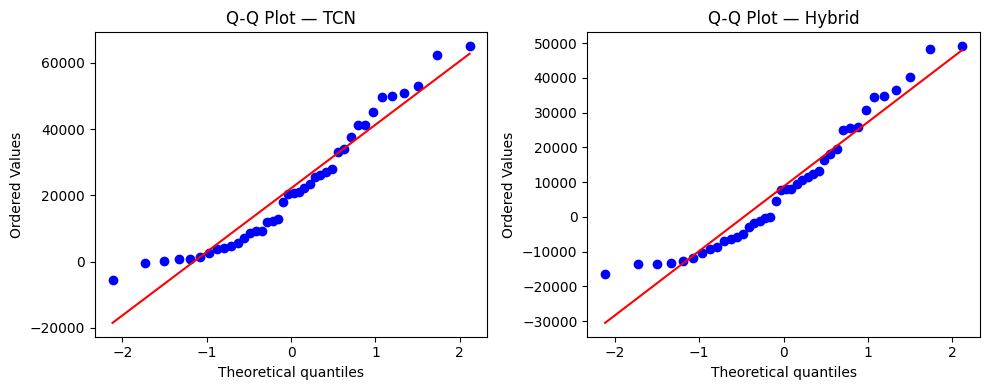


  PLOTTING: Expenditures | Start: 2000


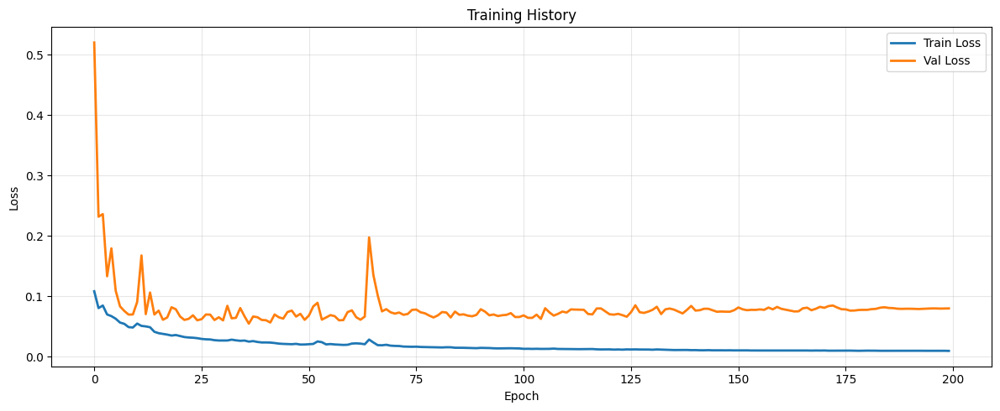

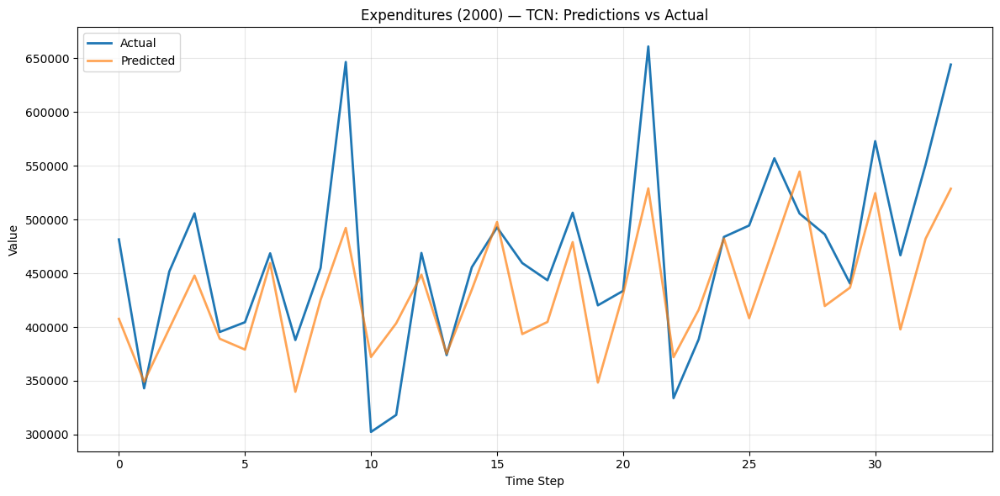

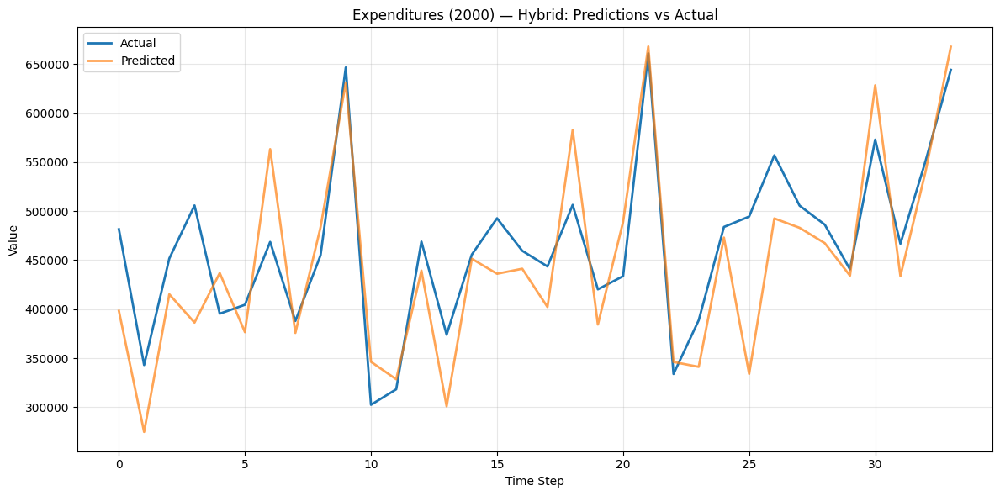

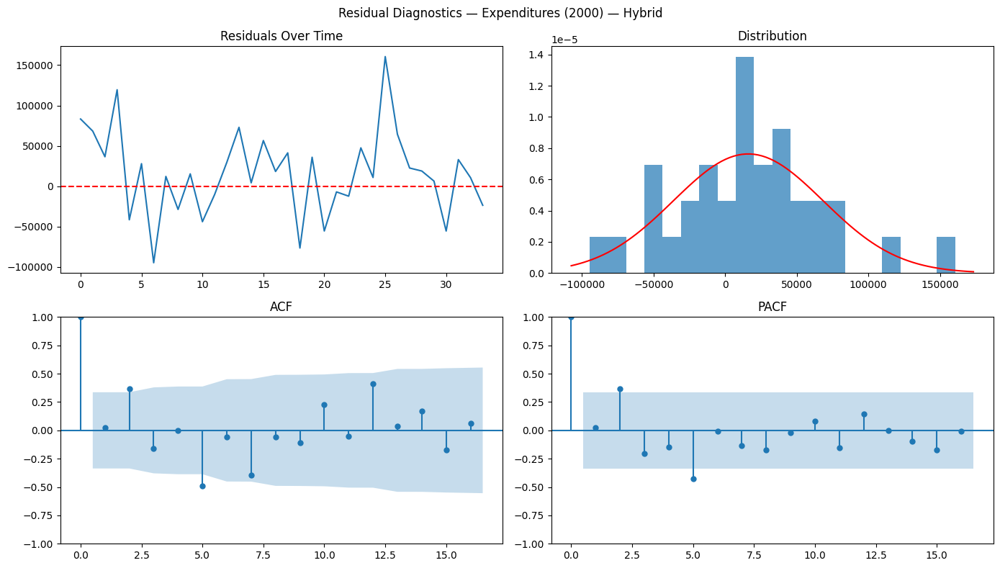

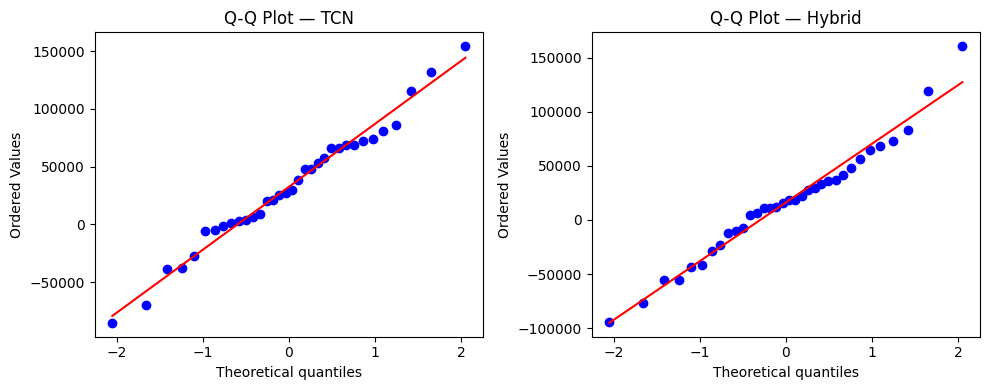


  PLOTTING: Tax Revenues | Start: 2007


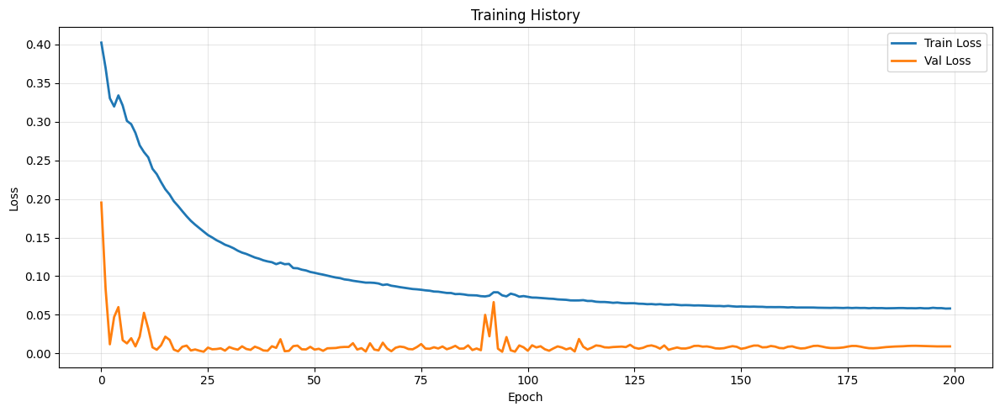

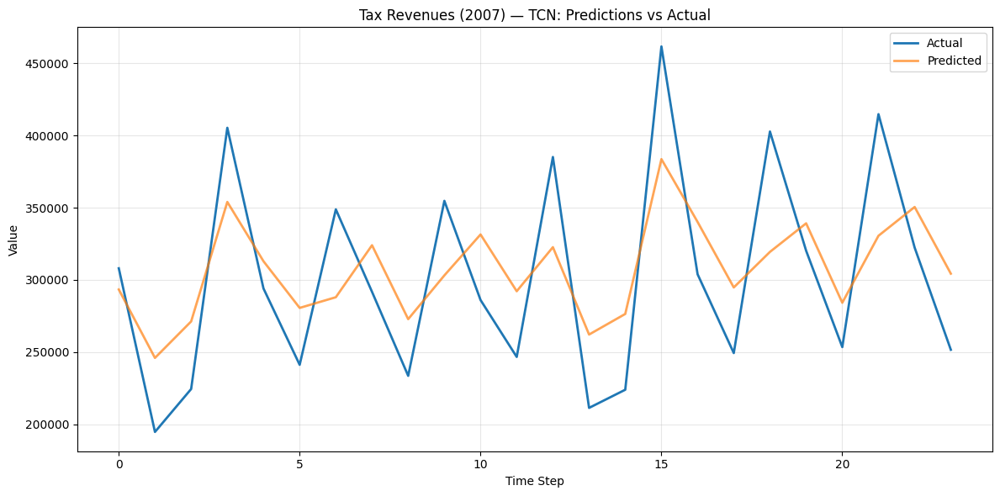

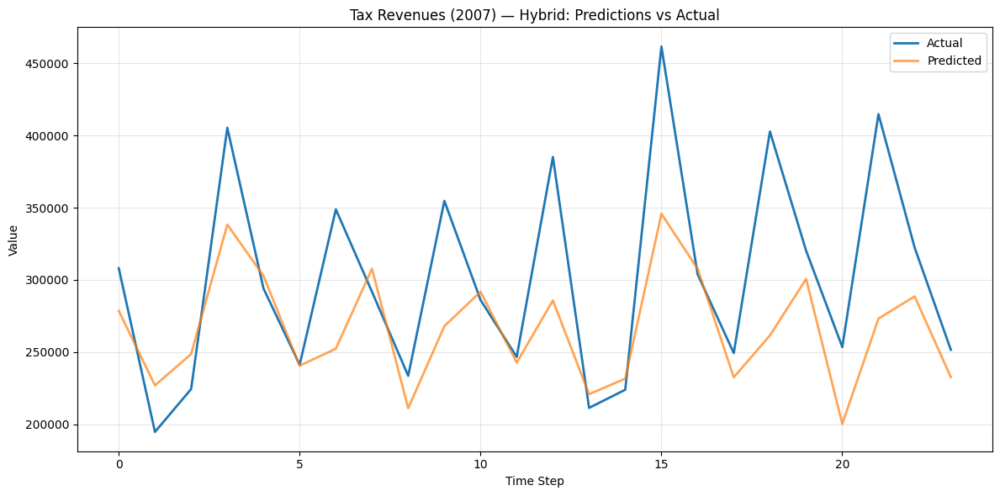

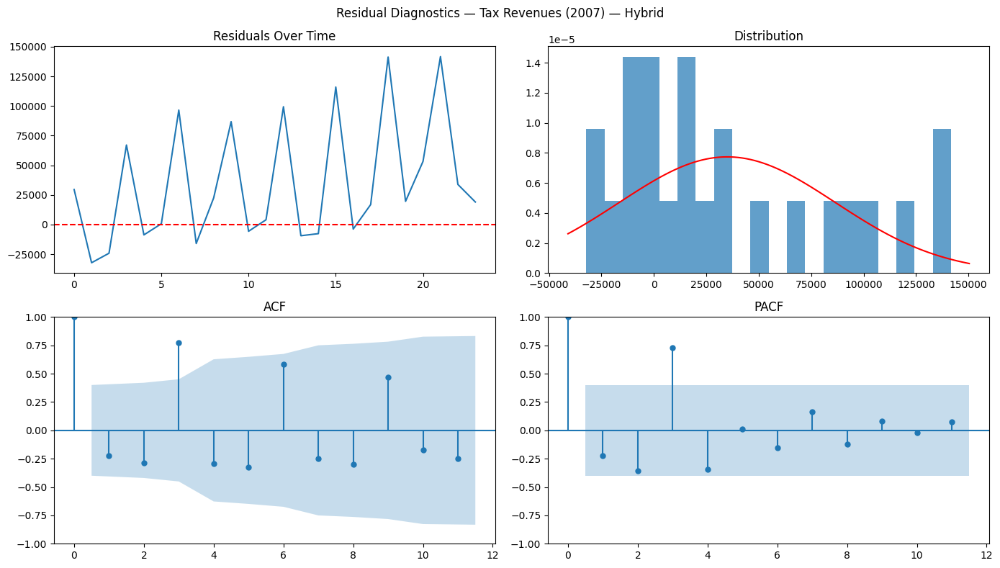

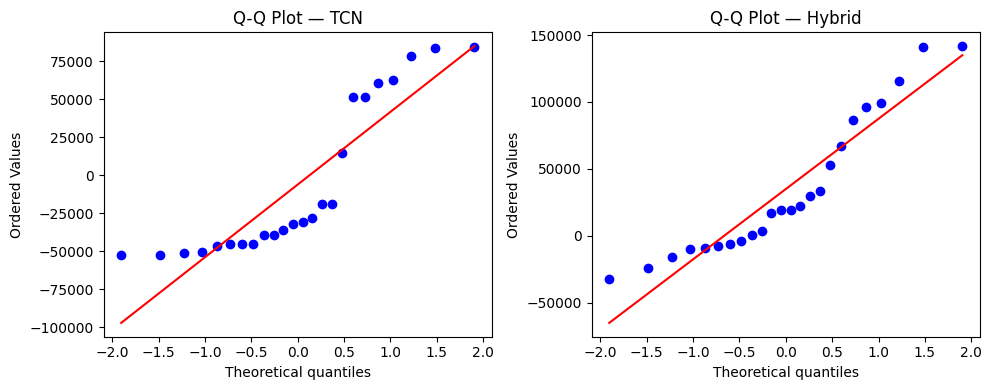


  PLOTTING: BIR | Start: 2007


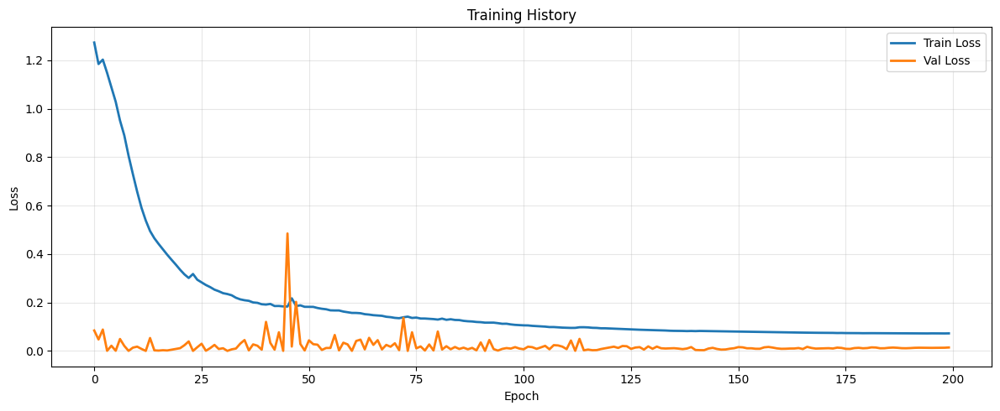

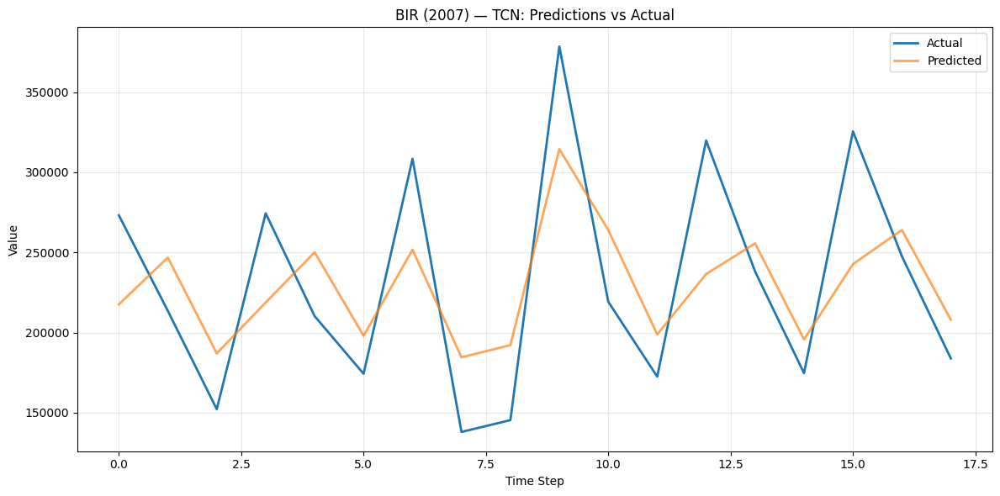

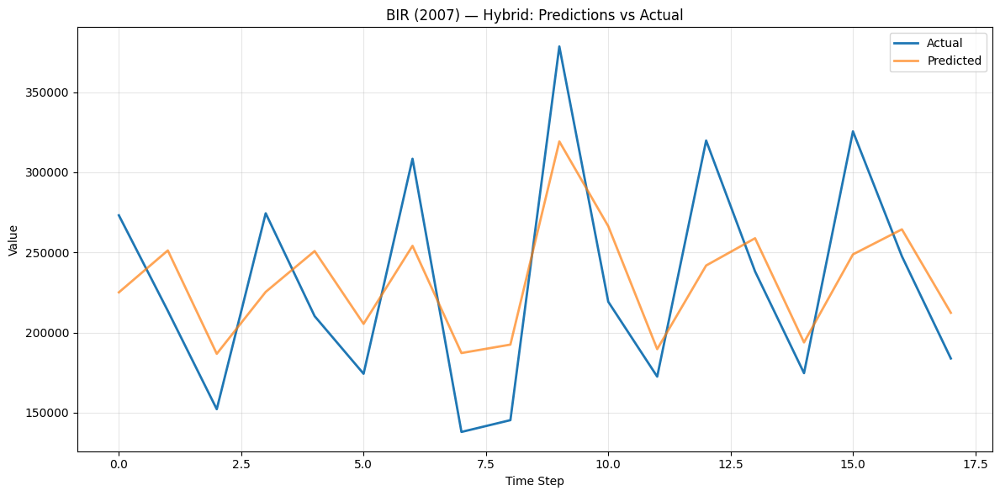

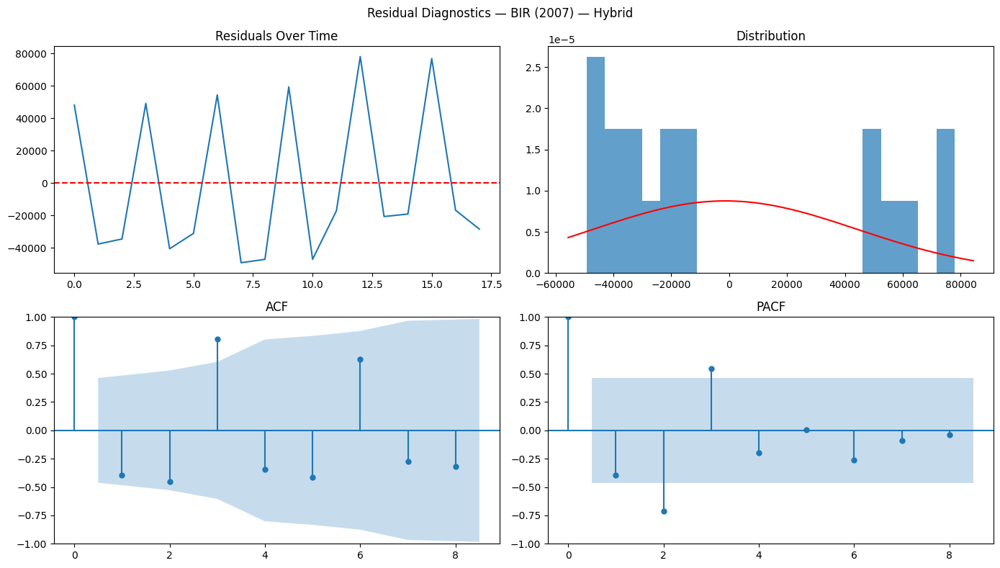

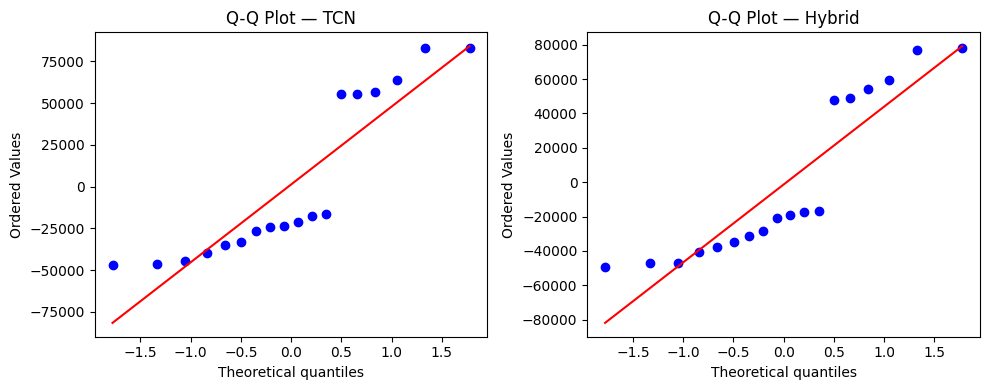


  PLOTTING: BOC | Start: 2007


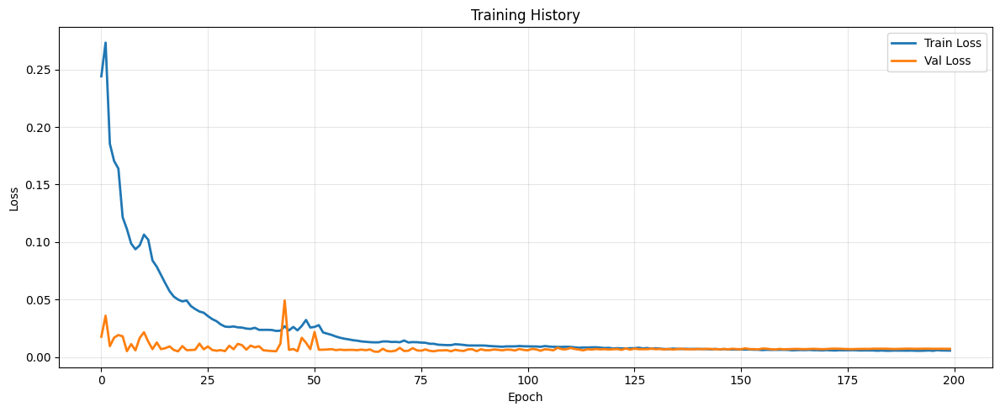

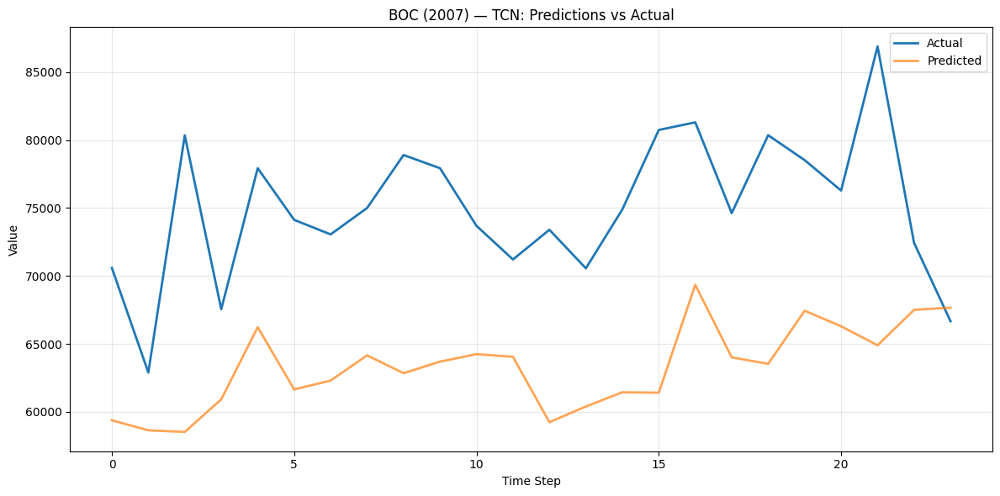

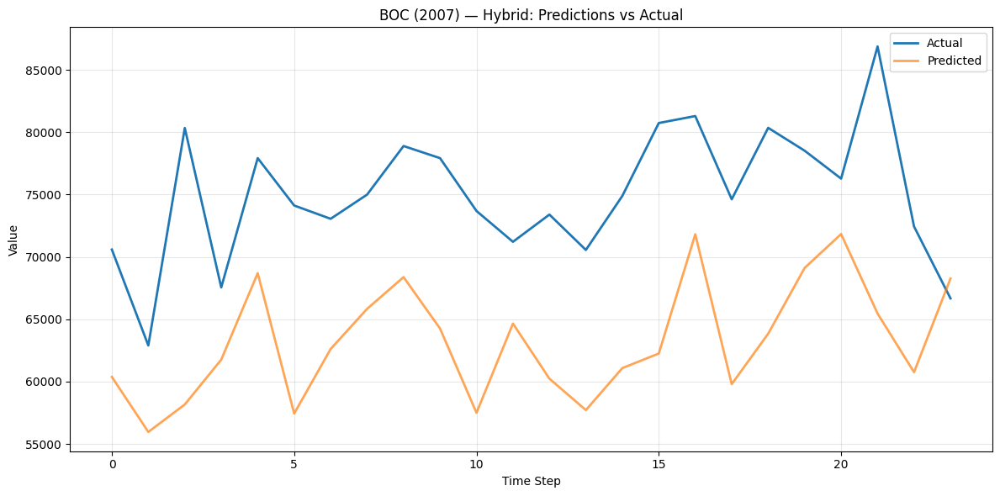

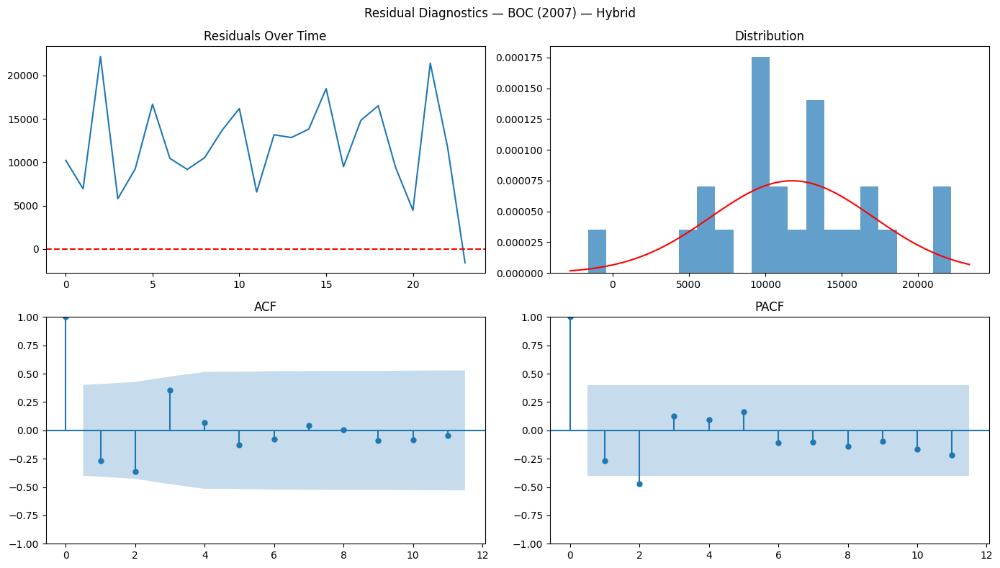

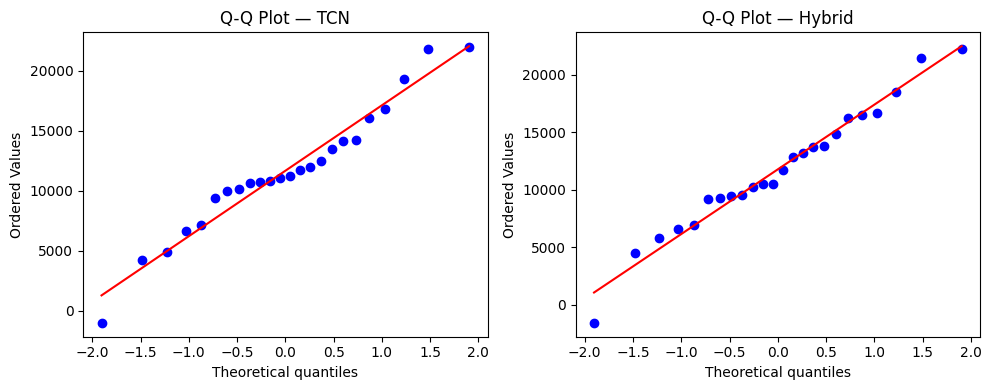


  PLOTTING: Other Offices | Start: 2007


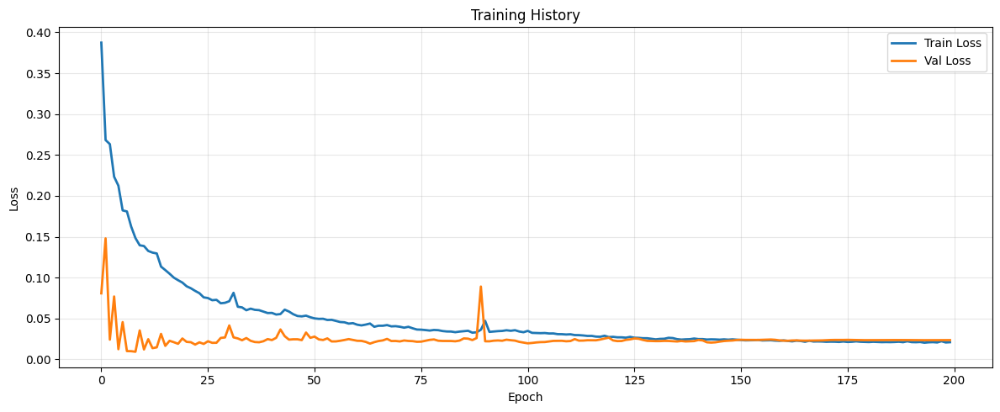

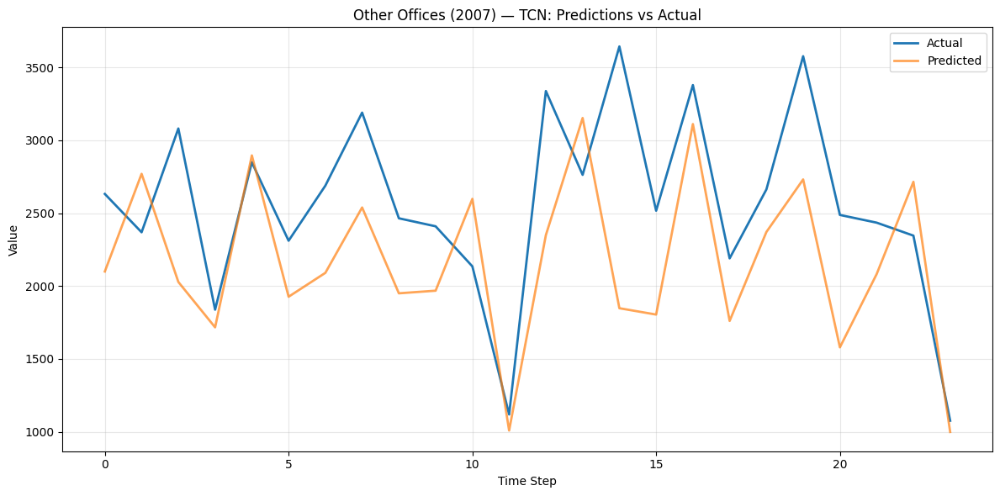

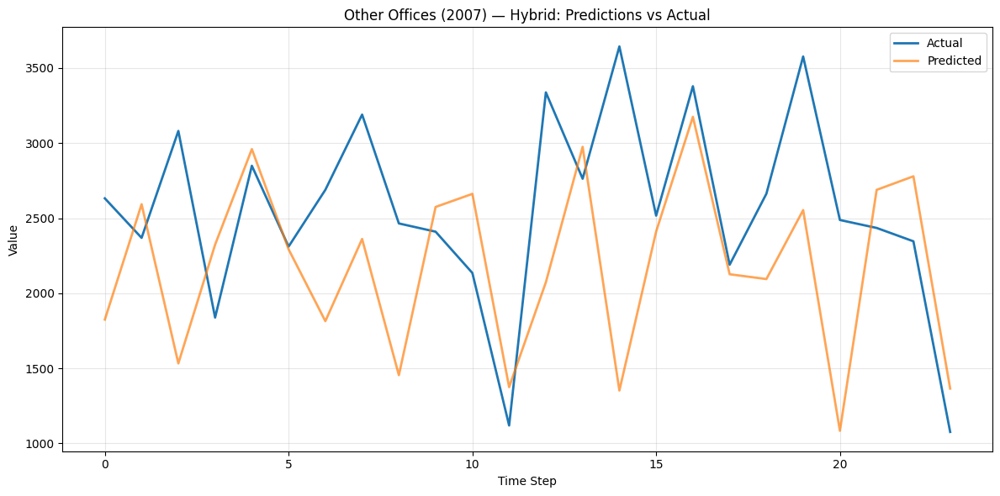

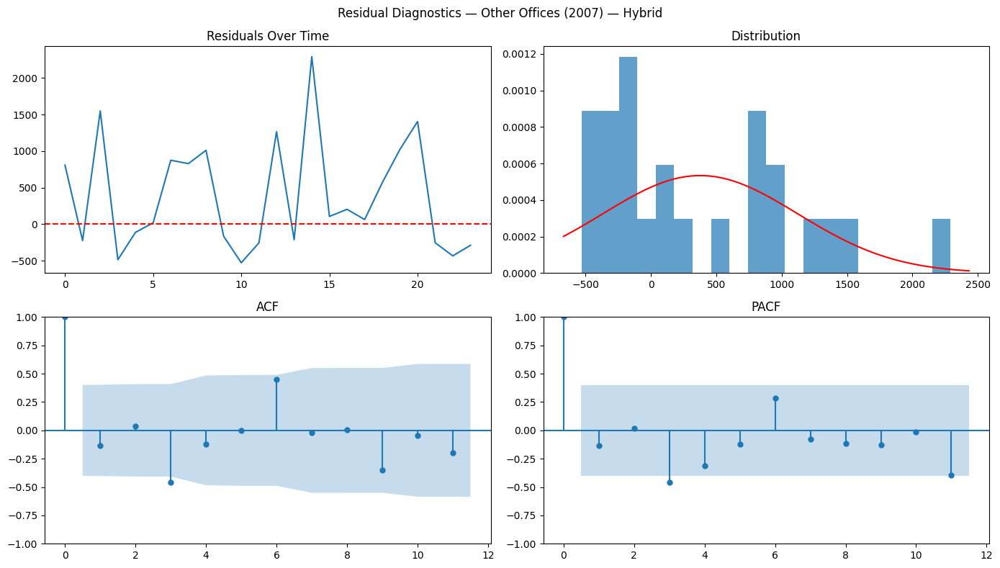

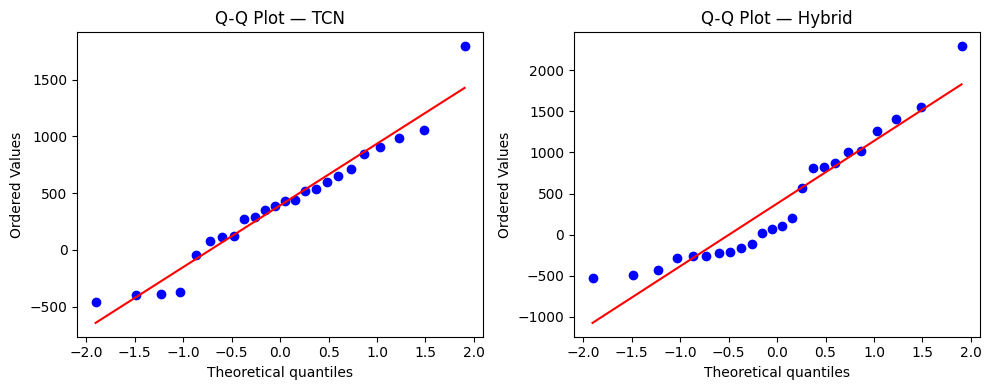


  PLOTTING: Non-tax Revenues | Start: 2007


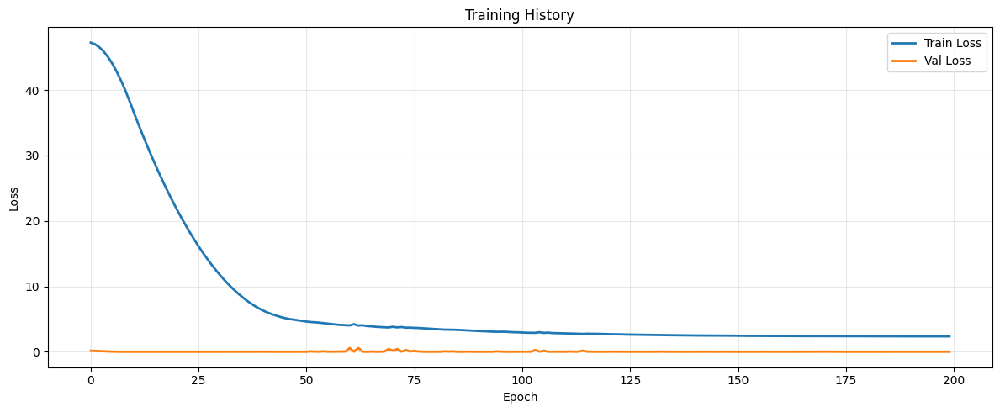

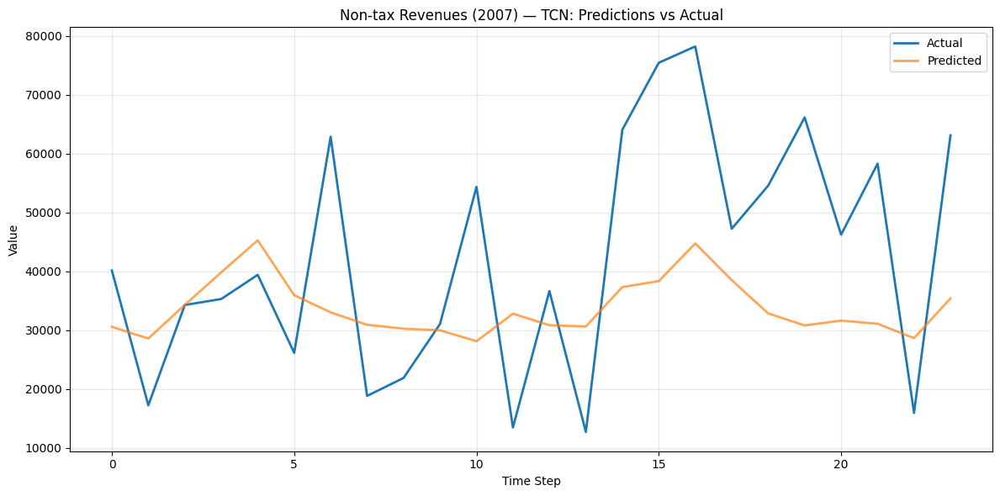

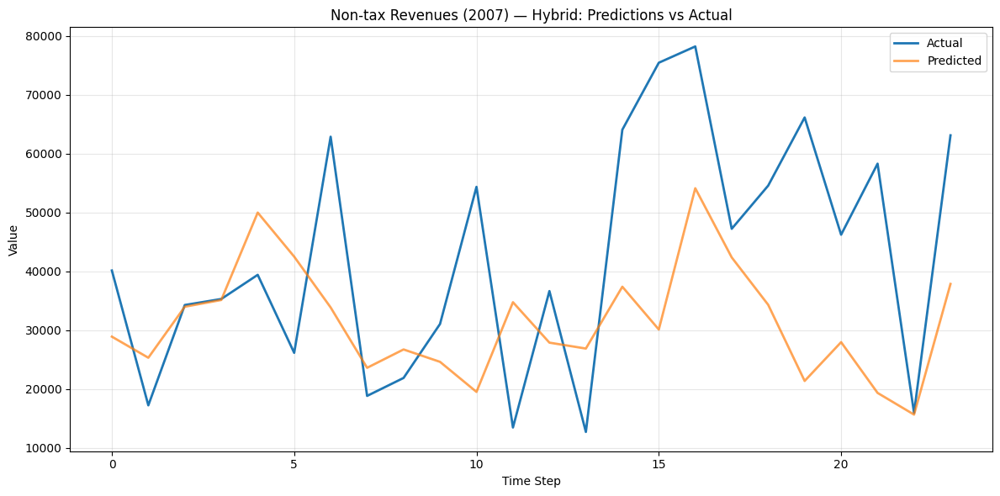

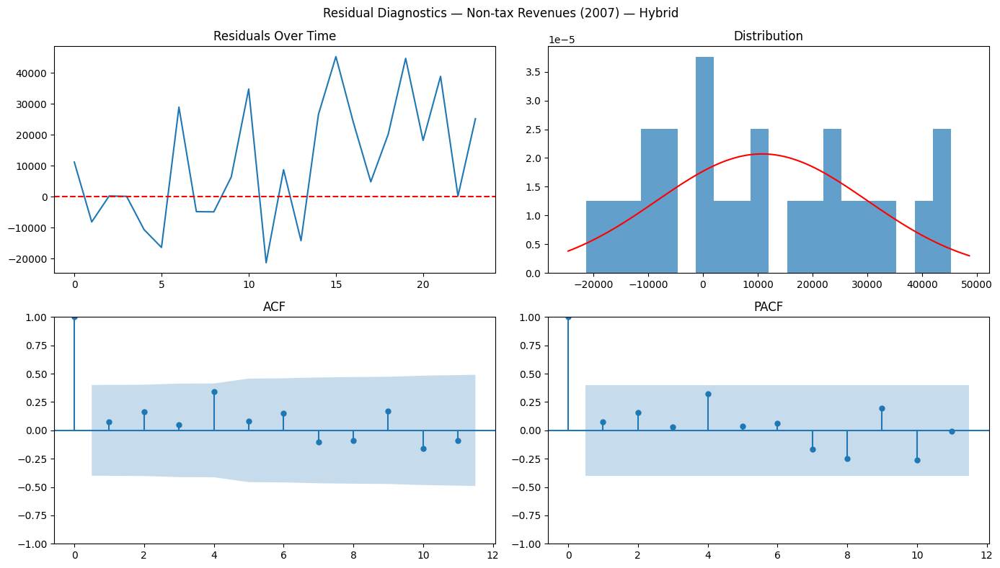

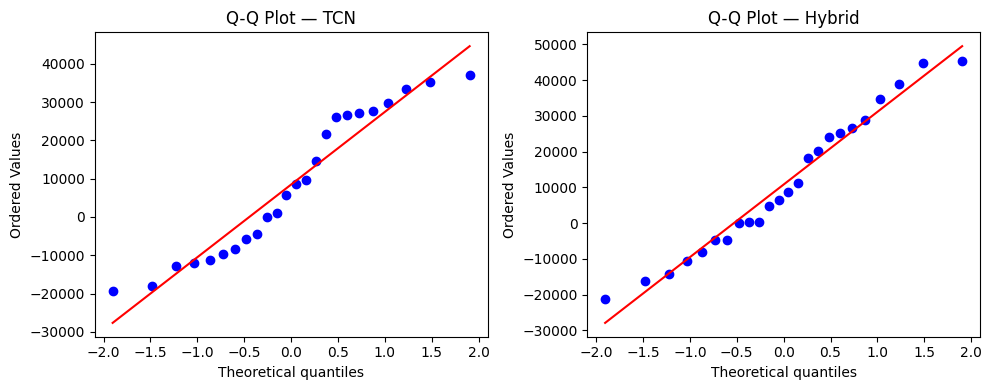


  PLOTTING: Expenditures | Start: 2007


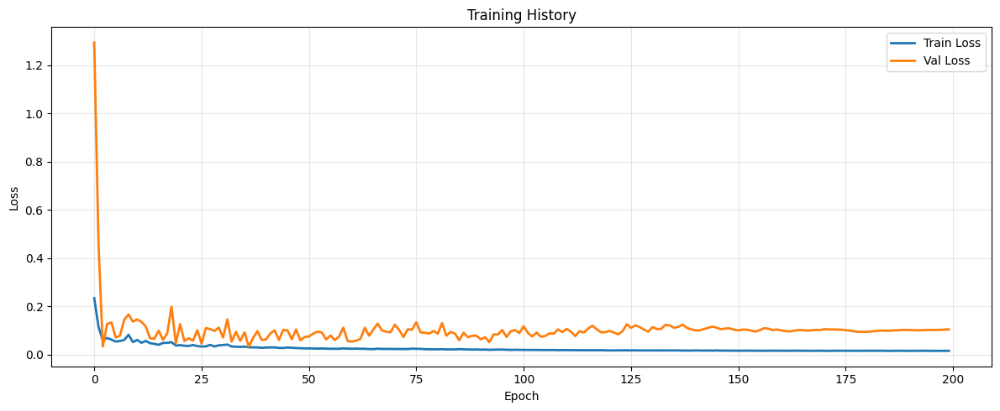

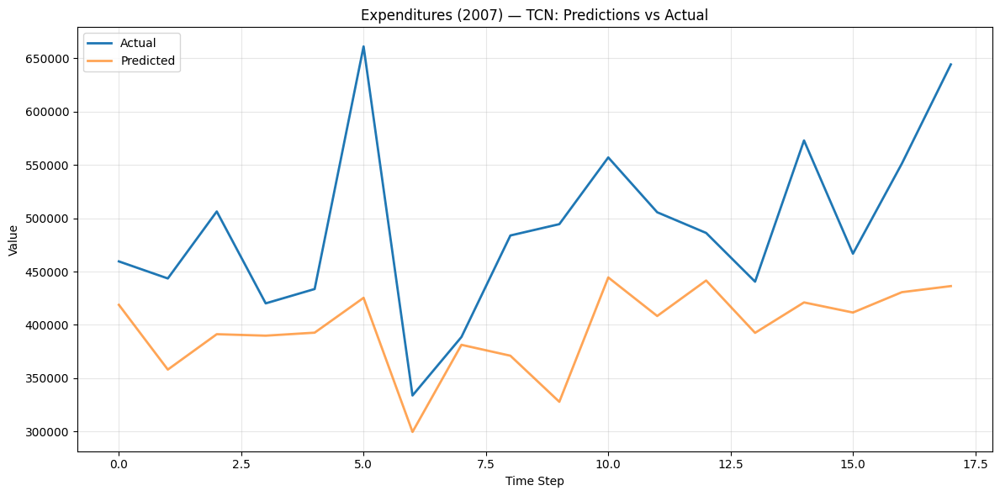

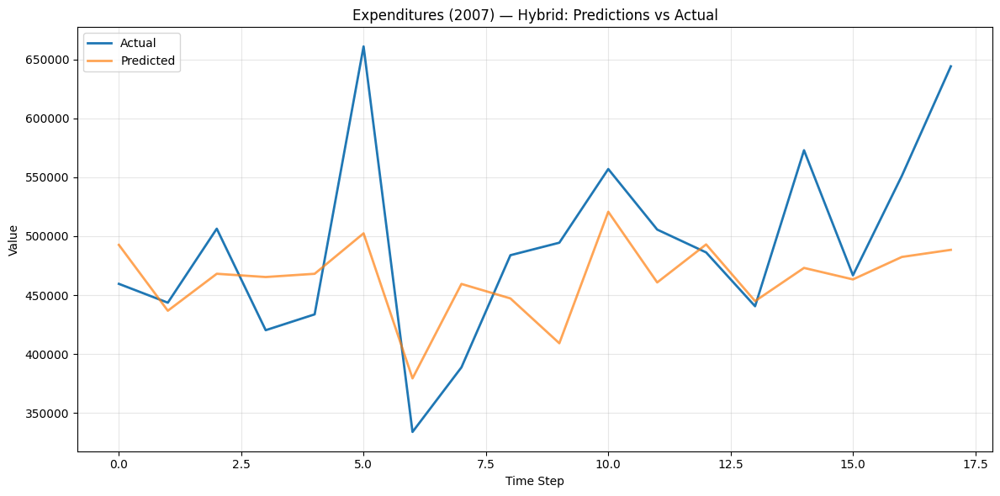

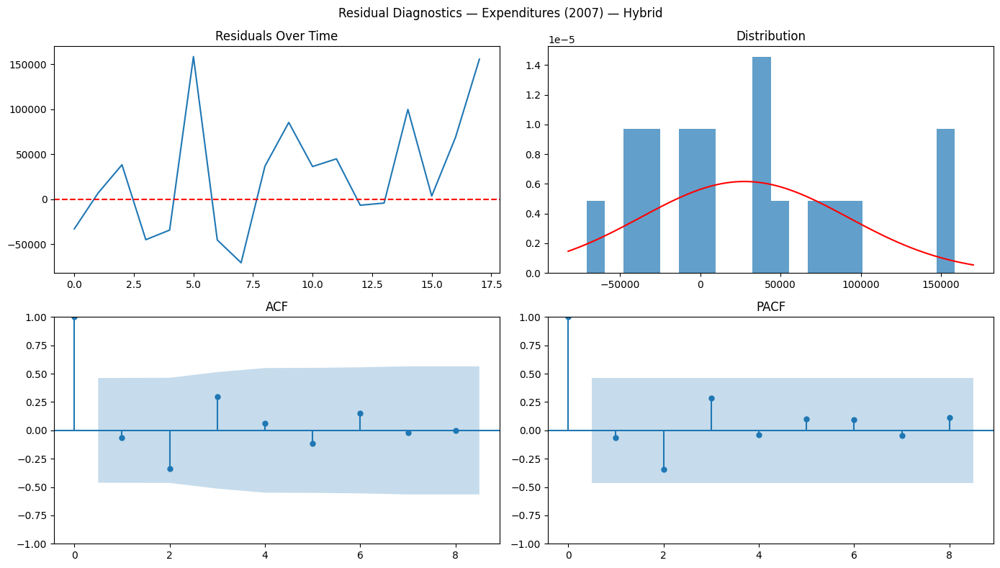

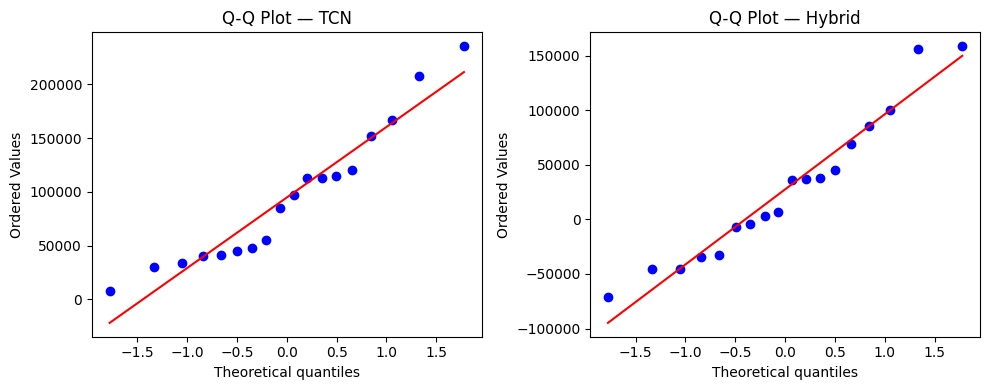

In [ ]:
for start_date in START_DATES:
    for label in LABEL_COLS:
        label_slug     = label.replace(' ', '_')
        exp_name       = f"{label_slug}_{start_date[:4]}"
        results_folder = f"results/{exp_name}"
        config_folder  = f"configs_featcorr/{exp_name}"

        print(f"\n{'='*60}\n  PLOTTING: {label} | Start: {start_date[:4]}\n{'='*60}")

        # Load
        test_preds   = np.load(f"{results_folder}/test_predictions.npy")
        test_actuals = np.load(f"{results_folder}/test_actuals.npy")
        hybrid_preds = np.load(f"{results_folder}/hybrid_predictions.npy")
        train_losses = np.load(f"{results_folder}/train_losses.npy")
        val_losses   = np.load(f"{results_folder}/val_losses.npy")

        # Training history
        utils.plot_training_history(train_losses, val_losses)

        # Predictions vs actuals
        plot_test_predictions(test_preds,   test_actuals, f"{label} ({start_date[:4]}) — TCN",    save_dir=results_folder)
        plot_test_predictions(hybrid_preds, test_actuals, f"{label} ({start_date[:4]}) — Hybrid", save_dir=results_folder)

        # Residual diagnostics
        plot_residual_diagnostics(test_actuals, hybrid_preds, f"{label} ({start_date[:4]}) — Hybrid", save_dir=results_folder)

        # QQ
        plot_qq(
            {'TCN': test_actuals, 'Hybrid': test_actuals},
            {'TCN': test_preds,   'Hybrid': hybrid_preds},
            ['TCN', 'Hybrid'],
            save_path=f"{results_folder}/qq_plots.png"
        )